**stage2_DANN_rep_n**. This notebook perform DANN training on optimal hyperparameters for rep_n times.

**Edit**<br/>

**TODO**<br/>

# Import packages and get authenticated

In [1]:
# from google.colab import drive
# drive.mount('drive')

In [2]:
import numpy as np

import pandas as pd
pd.set_option('display.max_columns', 500)
from tqdm import tqdm_notebook as tqdm
from IPython.display import display
import os
import sys
sys.path.append('/content/drive/My Drive/中研院/repo/')
# sys.path.append('~/project_FDDAT/repo/')
sys.path.append('../') # add this line so Data and data are visible in this file
from os.path import expanduser
home = expanduser("~")

from falldetect.utilities import *
from falldetect.models import *
from falldetect.dataset_util import *
from falldetect.training_util import *
from falldetect.eval_util import *

import time
import datetime
from datetime import datetime
import json
import argparse

# Plotting
# checklist 1: comment inline, uncomment Agg
%matplotlib inline
import matplotlib
# matplotlib.use('Agg')
import matplotlib.pyplot as plt
matplotlib.rc( 'savefig', facecolor = 'white' )

from sklearn.decomposition import PCA

import torch
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.nn.functional as F

# Get user inputs
In ipython notebook, these are hardcoded. In production python code, use parsers to provide these inputs

In [3]:
parser = argparse.ArgumentParser(description='FD_DAT')
parser.add_argument('--input_folder', metavar='input_folder', help='input_folder',
                    default='../')
parser.add_argument('--output_folder', metavar='output_folder', help='output_folder',
                    default='../')
parser.add_argument('--extractor_type', metavar='extractor_type', help='extractor_type',
                    default='CNN')
parser.add_argument('--num_epochs', type=int, metavar='num_epochs', help='number of epochs',
                    default='5')
parser.add_argument('--CV_n', type=int, metavar='CV_n', help='CV folds',
                    default='2')
parser.add_argument('--rep_n', type=int, metavar='rep_n', help='number of repitition',
                    default='5')
parser.add_argument('--tasks_list', metavar='tasks_list', help='a list of all tasks',
                    default='UMAFall_waist_UPFall_belt UPFall_wrist_UMAFall_ankle')



# split_mode = 'LOO'
# split_mode = '5fold'

# checklist 2: comment first line, uncomment second line seizures_FN
args = parser.parse_args(['--input_folder', 'stage1_preprocessed_18hz_5fold', 
                          '--output_folder', 'stage2_modeloutput_18hz_5fold',
                          '--extractor_type', 'CNN',
                          '--num_epochs', '2',
                          '--CV_n', '2',
                          '--rep_n', '2',
                          '--tasks_list', 'UMAFall_ankle-UPFall_ankle UPFall_rightpocket-UMAFall_leg',])
#                           '--tasks_list', 'UMAFall_waist-UPFall_belt UPFall_wrist-UMAFall_ankle',])
                          
# args = parser.parse_args()

In [4]:
home_dir = home+'/project_FDDAT/'
input_folder = args.input_folder
output_folder = args.output_folder
extractor_type = args.extractor_type
num_epochs = args.num_epochs
CV_n = args.CV_n
rep_n = args.rep_n

tasks_list = []
for item in args.tasks_list.split(' '):
    tasks_list.append((item.split('-')[0], item.split('-')[1]))
    
inputdir = home_dir + 'data_mic/{}/'.format(input_folder)

device = torch.device('cuda:1' if torch.cuda.is_available() else 'cpu')

In [5]:
tasks_list

[('UMAFall_ankle', 'UPFall_ankle'), ('UPFall_rightpocket', 'UMAFall_leg')]

# Repeat 10 times experiment

In [6]:
tasks_params_list = []
for task in tasks_list:
    tasks_params_list.append(  
        {'HP_name': 'rep',
         'task': task,
         'classes_n': 2,
         'CV_n': CV_n,
         'num_epochs': num_epochs,
         'channel_n': 4,
         'batch_size': 4,
         'learning_rate': 0.0001,
         'extractor_type': extractor_type,
         'device': device}, )
print(tasks_params_list)


[{'HP_name': 'rep', 'task': ('UMAFall_ankle', 'UPFall_ankle'), 'classes_n': 2, 'CV_n': 2, 'num_epochs': 2, 'channel_n': 4, 'batch_size': 4, 'learning_rate': 0.0001, 'extractor_type': 'CNN', 'device': device(type='cuda', index=1)}, {'HP_name': 'rep', 'task': ('UPFall_rightpocket', 'UMAFall_leg'), 'classes_n': 2, 'CV_n': 2, 'num_epochs': 2, 'channel_n': 4, 'batch_size': 4, 'learning_rate': 0.0001, 'extractor_type': 'CNN', 'device': device(type='cuda', index=1)}]


outputdir for stage2 output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/

======================  train on source, val on target(source=UMAFall_ankle to target=UPFall_ankle)  ======================

------------------------------Working on i_CV 0------------------------------
Working on get_UMAFall_loader...
train_data shape: (304, 3, 66)
val_data shape: (122, 3, 66)
Working on get_UPFall_loader...
train_data shape: (426, 3, 66)
val_data shape: (132, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/source/
acc performance: 0.6480263157894737 0.4309210526315789 0.9243421052631579 0.75
acc performance: 0.7540983606557377 0.36885245901639346 0.7213114754098361 0.5819672131147541


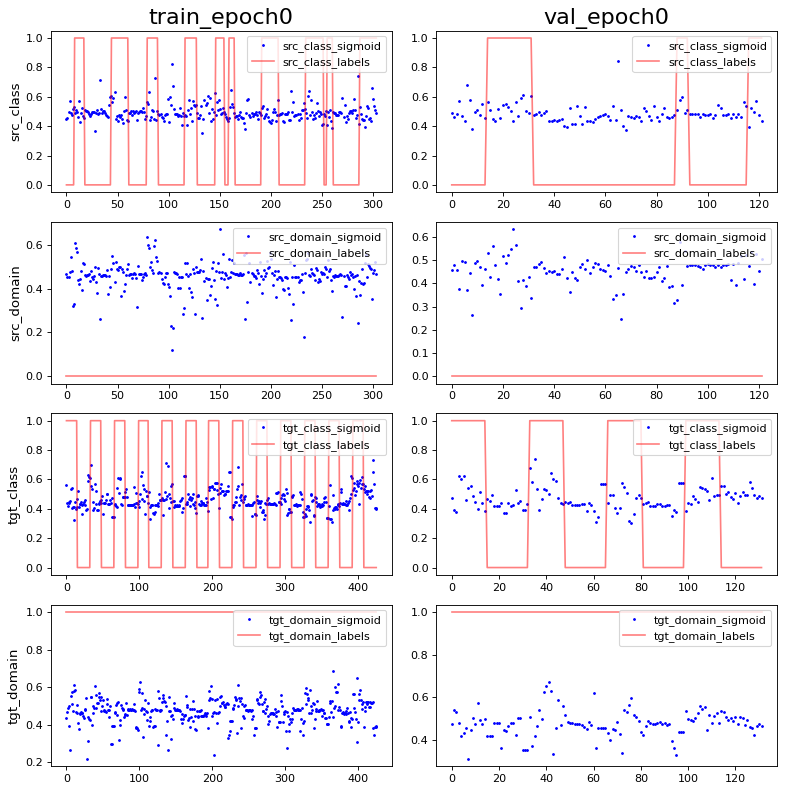

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/source/
show standardize mean and std: -2.3224946e-09 1.0
PCA var: [21.6      34.6      43.       49.3      54.2      57.100002 59.500004
 61.700005 63.700005 65.50001 ]
show standardize mean and std: -8.3436075e-10 0.9965218
PCA var: [19.1      34.800003 46.300003 52.800003 57.000004 60.700005 64.3
 66.9      69.200005 71.3     ]


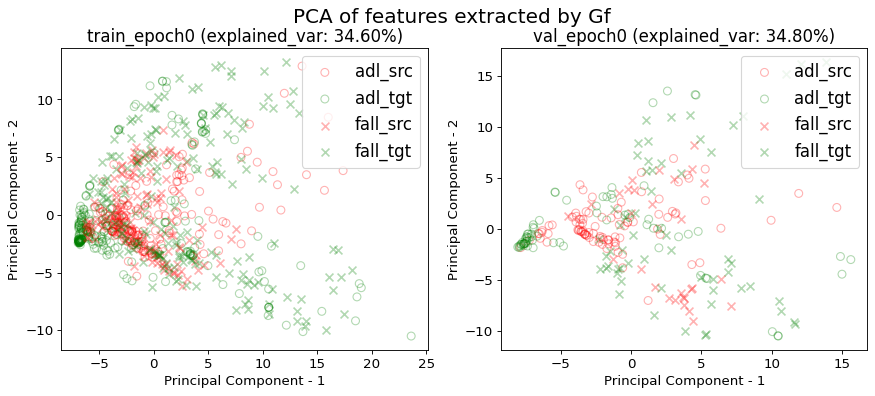

outputdir for baseline_learning_diagnosis output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/source/


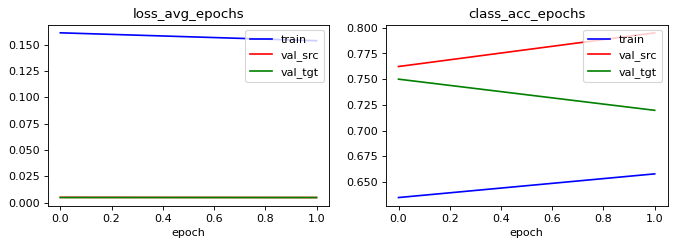

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/source/
acc performance: 0.6710526315789473 0.4506578947368421 0.8421052631578947 0.5526315789473685
acc performance: 0.7950819672131147 0.3770491803278688 0.7786885245901639 0.22131147540983606


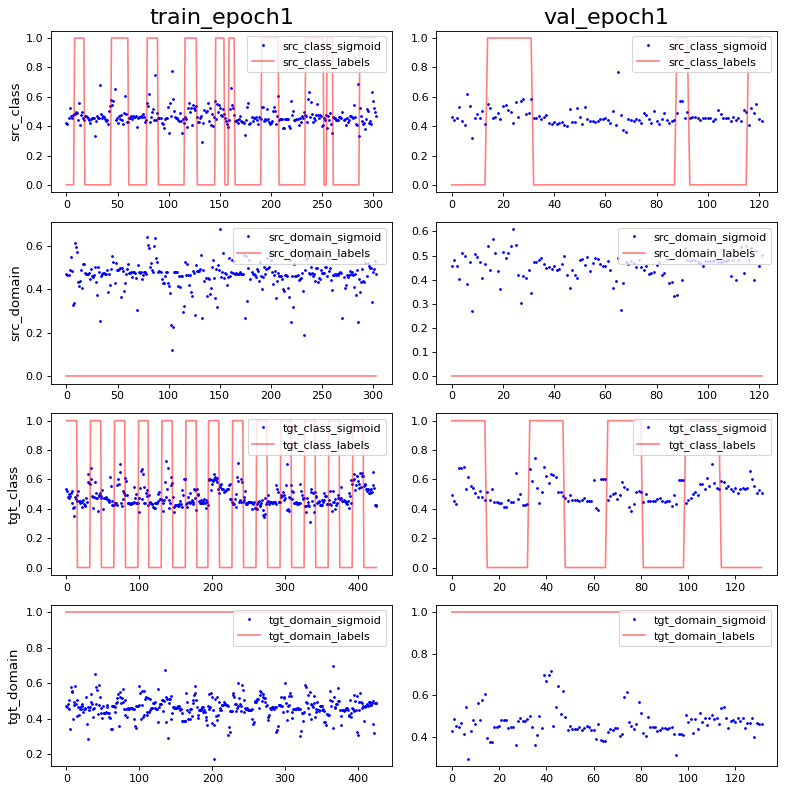

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/source/
show standardize mean and std: 4.6449893e-09 0.9965217
PCA var: [23.199999 38.2      46.7      51.7      55.3      58.2      60.600002
 62.800003 64.700005 66.3     ]
show standardize mean and std: 3.337443e-09 0.99303126
PCA var: [22.400002 38.4      47.4      53.       57.8      61.2      64.
 66.5      68.7      70.5     ]


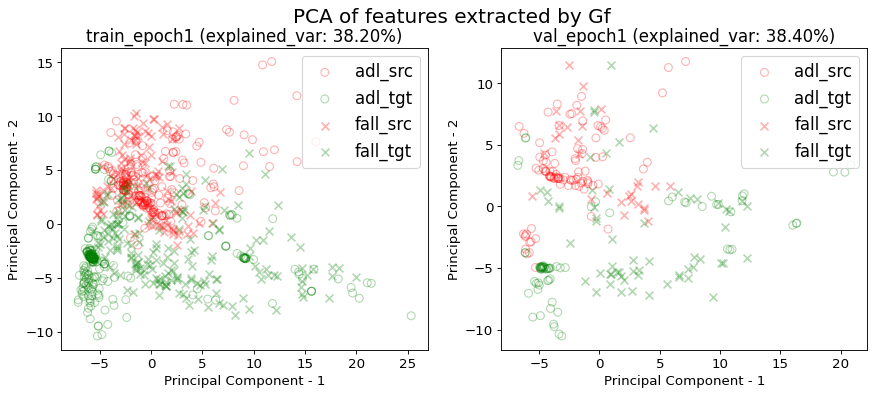

------------------------------Working on i_CV 1------------------------------
Working on get_UMAFall_loader...
train_data shape: (336, 3, 66)
val_data shape: (90, 3, 66)
Working on get_UPFall_loader...
train_data shape: (427, 3, 66)
val_data shape: (131, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/source/
acc performance: 0.6964285714285714 0.9970238095238095 0.8660714285714286 0.0
acc performance: 0.7333333333333333 1.0 0.9666666666666667 0.0


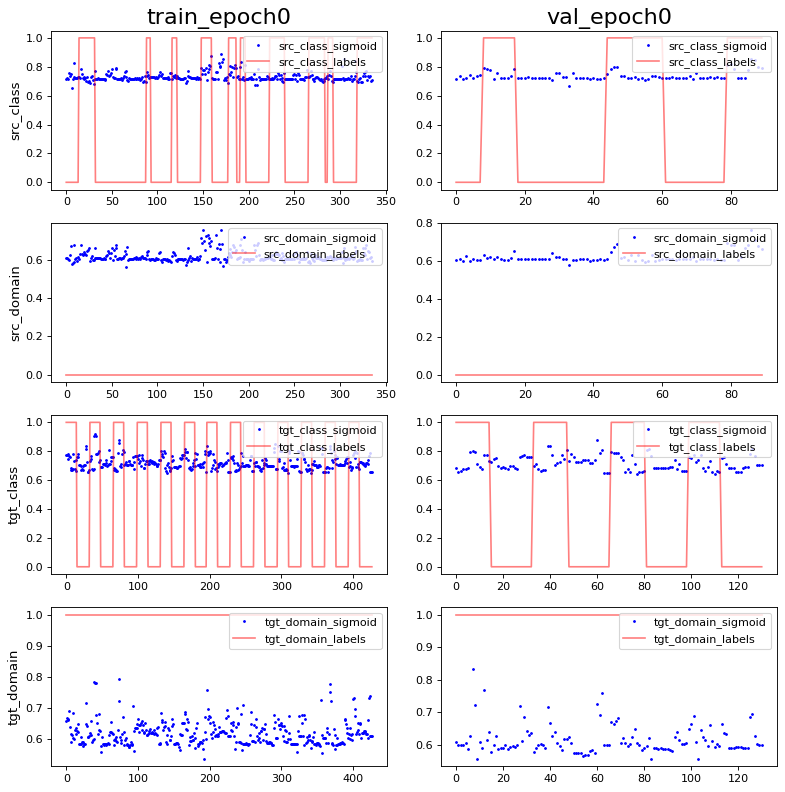

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/source/
show standardize mean and std: 0.0 0.98952854
PCA var: [18.7      29.2      35.3      40.       43.9      47.2      50.5
 53.1      55.199997 57.1     ]
show standardize mean and std: 1.9178972e-09 0.9895285
PCA var: [21.5      34.       41.5      46.2      50.3      53.899998 57.1
 60.1      62.5      64.8     ]


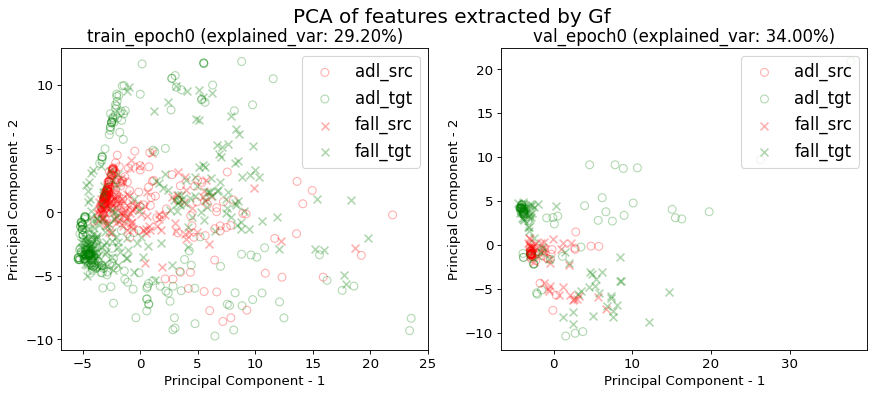

outputdir for baseline_learning_diagnosis output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/source/


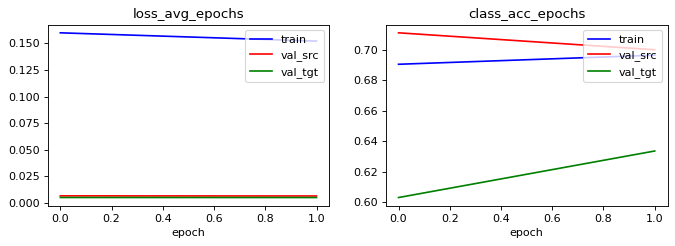

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/source/
acc performance: 0.7083333333333334 0.9970238095238095 0.8273809523809523 0.0
acc performance: 0.7 1.0 0.9222222222222223 0.0


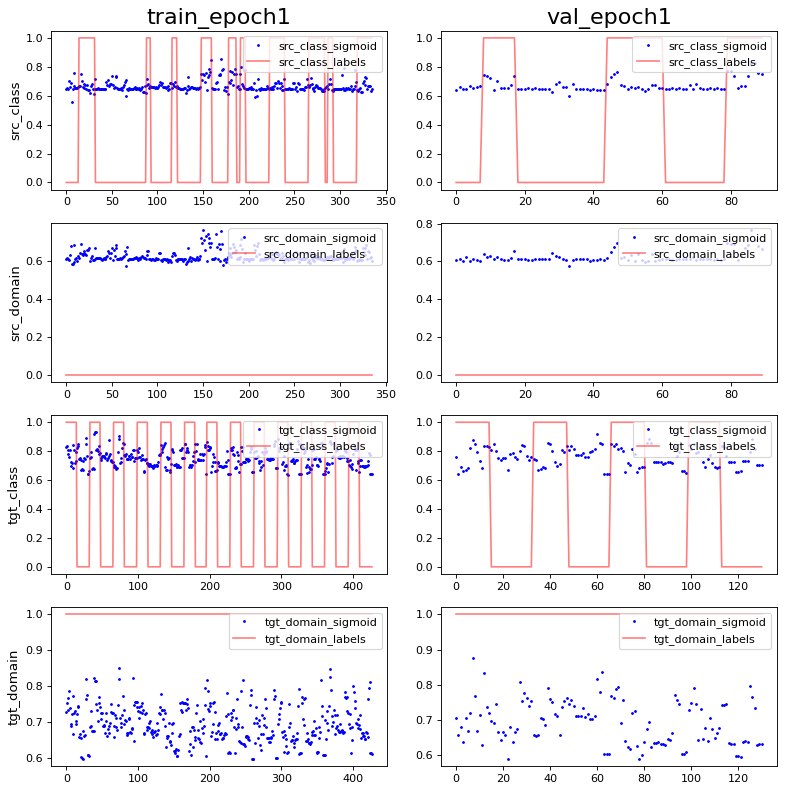

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/source/
show standardize mean and std: 3.333069e-09 0.98952854
PCA var: [35.7      47.2      54.2      58.2      61.100002 63.4      65.3
 67.       68.4      69.8     ]
show standardize mean and std: 9.589486e-10 0.98952854
PCA var: [39.6      48.399998 55.1      59.3      62.6      65.1      67.4
 69.4      71.3      73.200005]


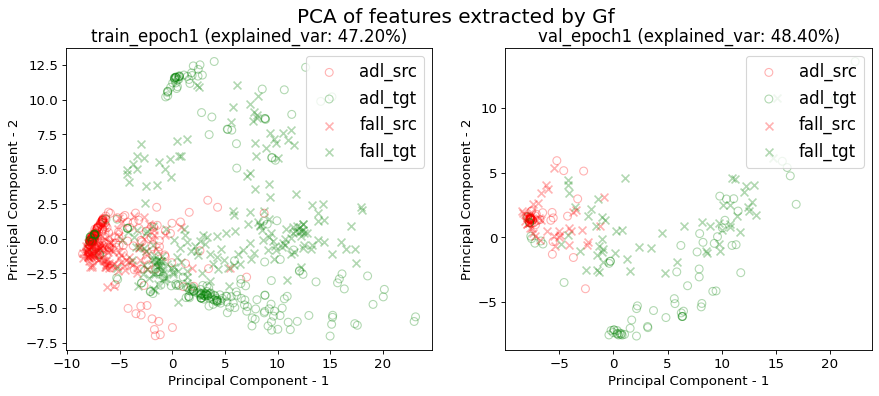

---------------Exporting model performance---------------
show df_performance


,i_CV,train_loss,train_acc,val_loss,val_acc,tgt_val_loss,tgt_val_acc
0,0.000000,0.153664,0.657895,0.004740,0.795082,0.004724,0.719697
1,1.000000,0.152060,0.696429,0.006606,0.700000,0.005135,0.633588
mean,0.500000,0.152862,0.677162,0.005673,0.747541,0.004929,0.676642
std,0.707107,0.001135,0.027248,0.001320,0.067233,0.000290,0.060888


src val loss: 0.0057±0.0013
src val acc: 0.7475±0.0672
tgt val loss: 0.0049±0.0003
tgt val acc: 0.6766±0.0609
--------------Exporting notebook parameters--------------
{'CV_n': 2, 'samples_n': 426, 'classes_n': 2, 'model_name': 'DannModel', 'dataset_name': 'UMAFall', 'num_epochs': 2, 'channel_n': 4, 'batch_size': 4, 'learning_rate': 0.0001, 'sensor_loc': 'ankle', 'date': '2020/04/11 21:59:19', 'input_dim': (4, 3, 66), 'output_dim': (4,)}

======================  train on target, val on target(source=UMAFall_ankle to target=UPFall_ankle)  ======================

------------------------------Working on i_CV 0------------------------------
Working on get_UPFall_loader...
train_data shape: (426, 3, 66)
val_data shape: (132, 3, 66)
Working on get_UMAFall_loader...
train_data shape: (304, 3, 66)
val_data shape: (122, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modelo

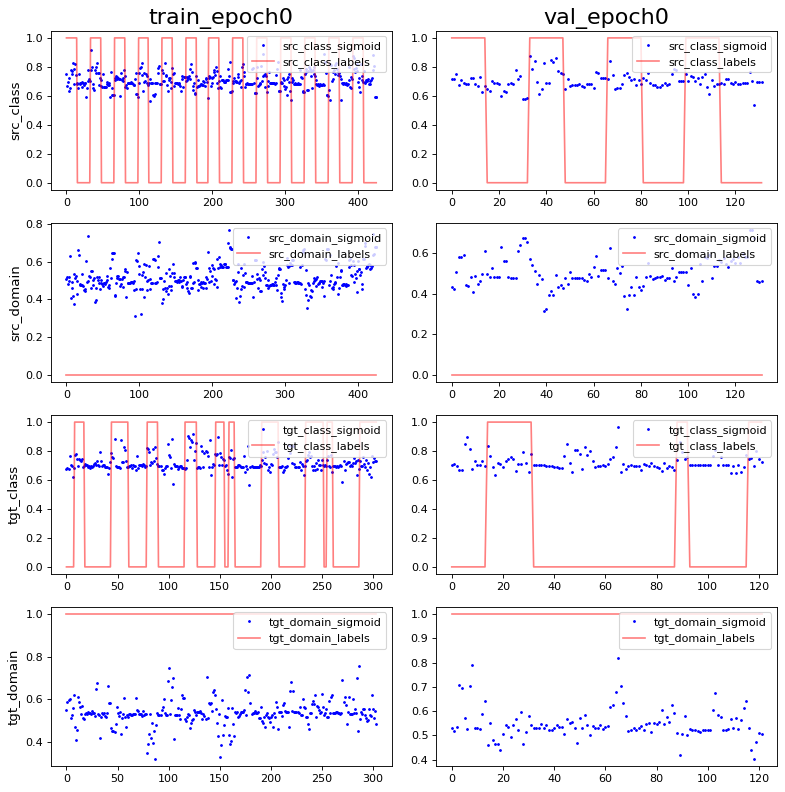

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/target/
show standardize mean and std: -1.4515591e-09 1.0
PCA var: [23.6      33.300003 40.500004 46.400005 49.900005 53.100006 55.500008
 57.600006 59.500008 61.300007]
show standardize mean and std: -4.1718037e-10 0.9965218
PCA var: [25.       34.6      42.199997 49.299995 52.899994 56.299995 59.099995
 61.599995 63.699993 65.7     ]


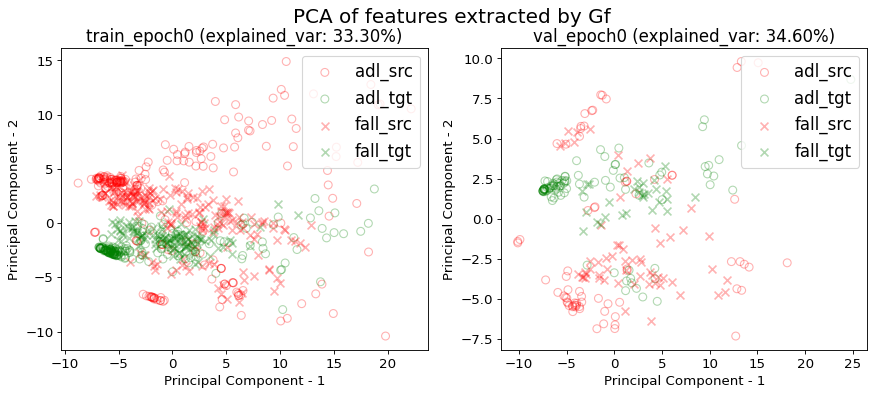

outputdir for baseline_learning_diagnosis output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/target/


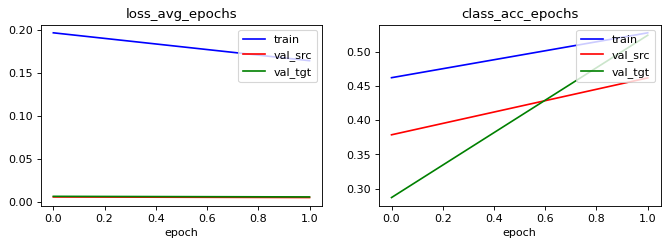

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/target/
acc performance: 0.5586854460093896 0.6901408450704225 0.392018779342723 0.24178403755868544
acc performance: 0.4621212121212121 0.6439393939393939 0.48484848484848486 0.24242424242424243


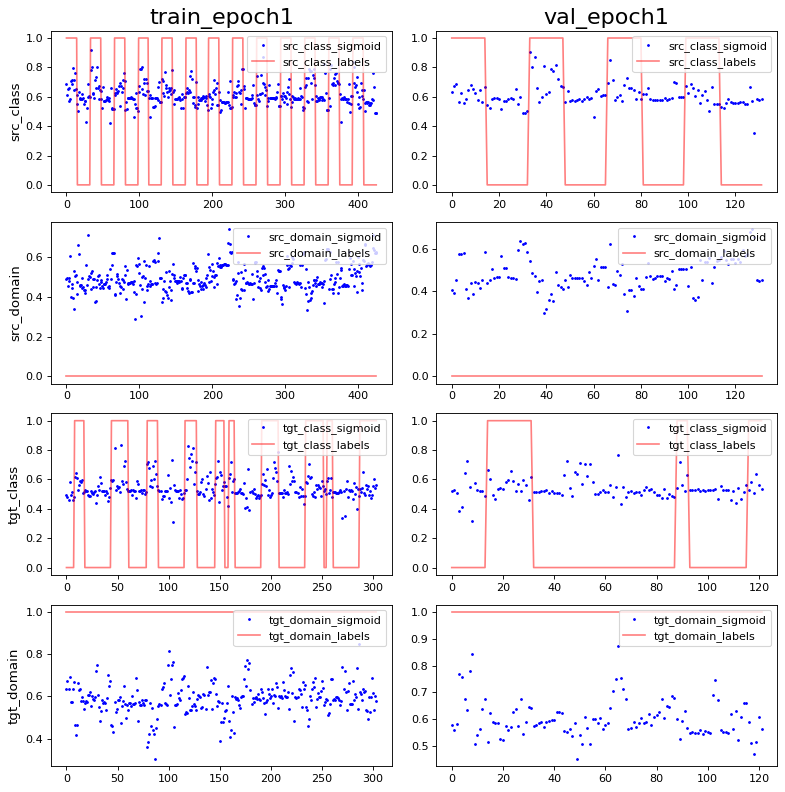

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/target/
show standardize mean and std: 1.4515591e-09 1.0
PCA var: [21.699999 36.1      44.399998 49.399998 52.699997 55.499996 57.699997
 59.799995 61.599995 63.199993]
show standardize mean and std: 2.5030822e-09 1.0
PCA var: [21.8      35.6      44.899998 50.899998 54.399998 57.399998 59.999996
 62.499996 64.799995 66.799995]


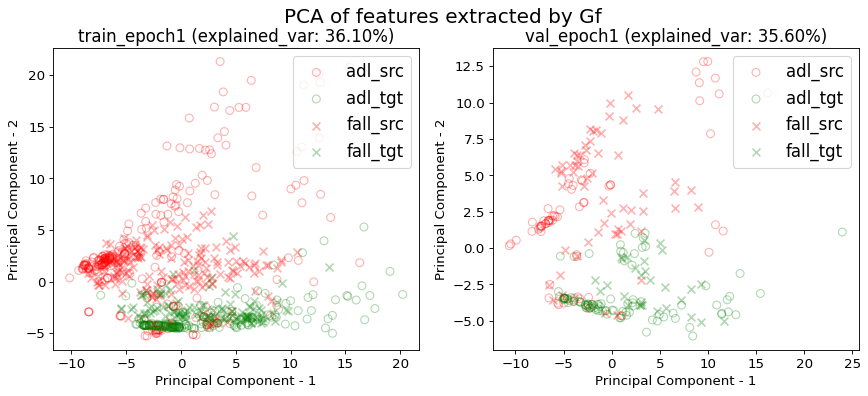

------------------------------Working on i_CV 1------------------------------
Working on get_UPFall_loader...
train_data shape: (427, 3, 66)
val_data shape: (131, 3, 66)
Working on get_UMAFall_loader...
train_data shape: (336, 3, 66)
val_data shape: (90, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/target/
acc performance: 0.4309133489461358 0.03981264637002342 0.33489461358313816 0.6838407494145199
acc performance: 0.45038167938931295 0.030534351145038167 0.366412213740458 0.6030534351145038


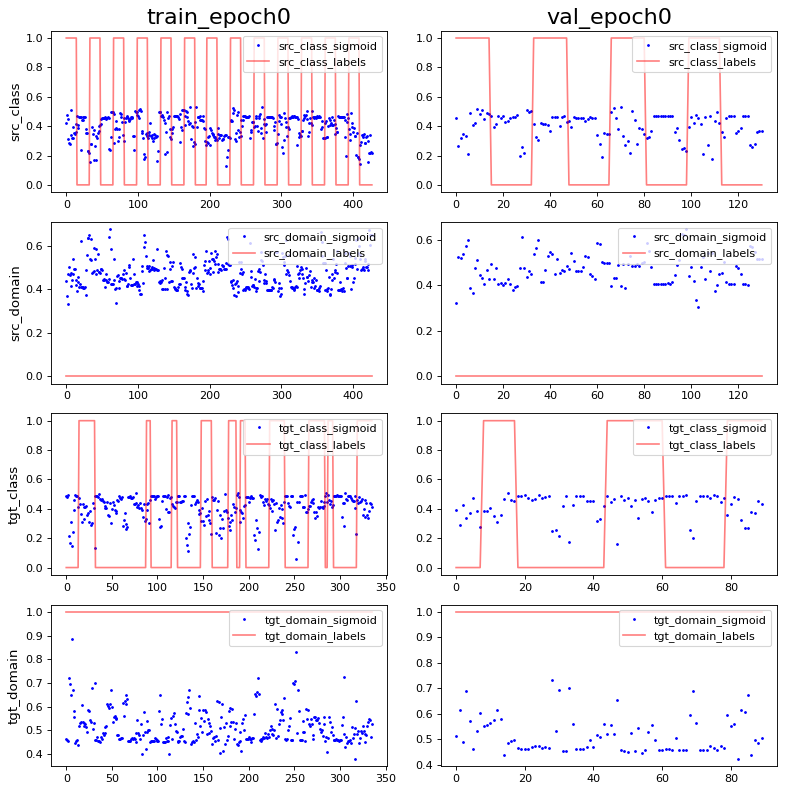

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/target/
show standardize mean and std: 5.5551147e-10 1.0
PCA var: [24.2      34.7      41.3      46.8      50.8      54.5      57.
 59.3      61.2      63.100002]
show standardize mean and std: 1.9178972e-09 0.9965217
PCA var: [24.       34.7      42.100002 48.4      53.300003 57.600002 60.9
 63.600002 66.       68.2     ]


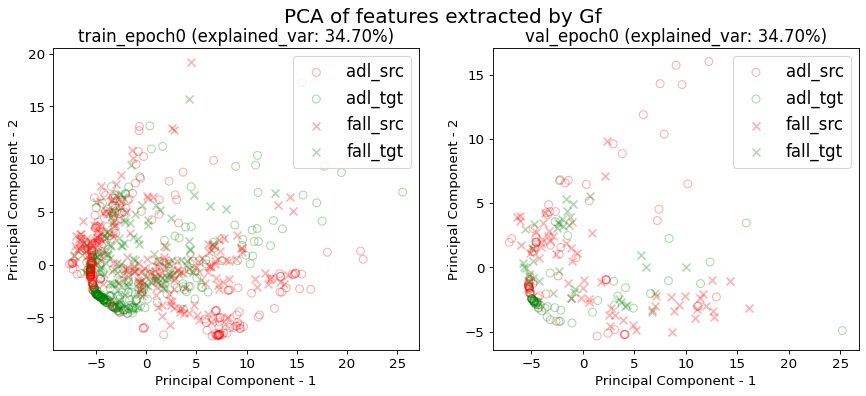

outputdir for baseline_learning_diagnosis output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/target/


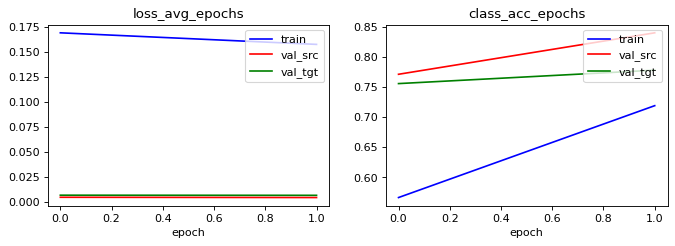

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/target/
acc performance: 0.7962529274004684 0.03278688524590164 0.6018735362997658 0.522248243559719
acc performance: 0.8396946564885496 0.015267175572519083 0.5343511450381679 0.48091603053435117


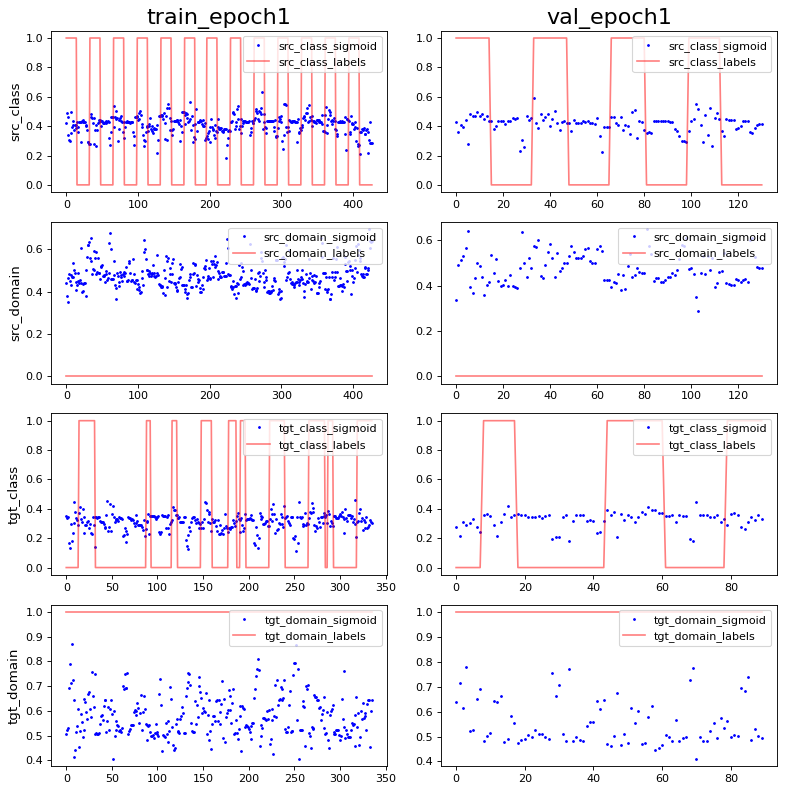

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/target/
show standardize mean and std: -5.5551147e-10 1.0
PCA var: [35.100002 46.300003 52.000004 57.100002 60.800003 63.300003 65.5
 67.5      69.2      70.799995]
show standardize mean and std: 1.9178972e-09 0.9965218
PCA var: [32.600002 49.100002 56.       60.2      64.       66.6      69.1
 71.299995 73.1      74.9     ]


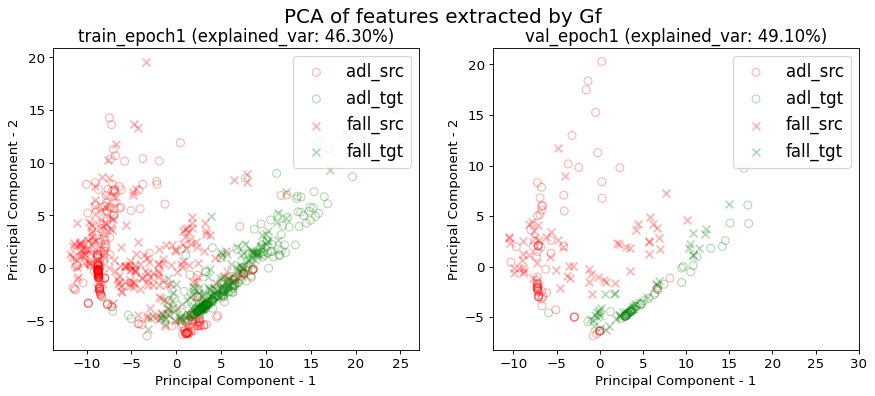

---------------Exporting model performance---------------
show df_performance


,i_CV,train_loss,train_acc,val_loss,val_acc,tgt_val_loss,tgt_val_acc
0,0.000000,0.164544,0.528169,0.005189,0.462121,0.005911,0.524590
1,1.000000,0.157206,0.718970,0.004410,0.839695,0.006623,0.777778
mean,0.500000,0.160875,0.623569,0.004799,0.650908,0.006267,0.651184
std,0.707107,0.005189,0.134916,0.000551,0.266985,0.000504,0.179031


src val loss: 0.0048±0.0006
src val acc: 0.6509±0.2670
tgt val loss: 0.0063±0.0005
tgt val acc: 0.6512±0.1790
--------------Exporting notebook parameters--------------
{'CV_n': 2, 'samples_n': 558, 'classes_n': 2, 'model_name': 'DannModel', 'dataset_name': 'UPFall', 'num_epochs': 2, 'channel_n': 4, 'batch_size': 4, 'learning_rate': 0.0001, 'sensor_loc': 'ankle', 'date': '2020/04/11 21:59:35', 'input_dim': (4, 3, 66), 'output_dim': (4,)}

======================  DANN training transferring knowledge(source=UMAFall_ankle to target=UPFall_ankle)  ======================

------------------------------Working on i_CV 0------------------------------
Working on get_UMAFall_loader...
train_data shape: (304, 3, 66)
val_data shape: (122, 3, 66)
Working on get_UPFall_loader...
train_data shape: (426, 3, 66)
val_data shape: (132, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_m

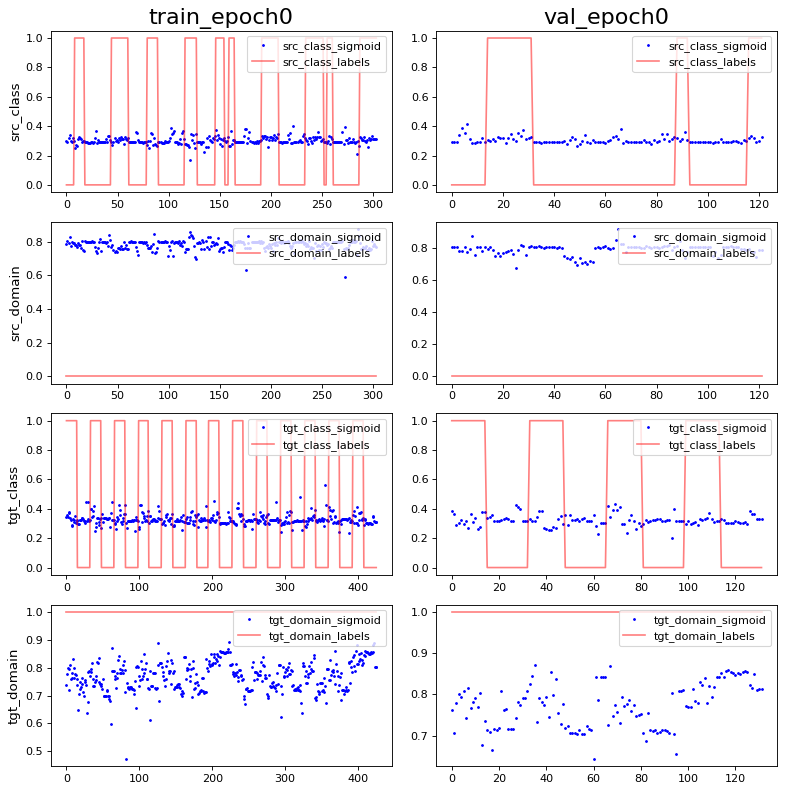

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/dann/
show standardize mean and std: -1.7418709e-09 0.99303126
PCA var: [24.6      37.4      42.9      47.300003 51.300003 54.300003 56.9
 59.300003 61.500004 63.400005]
show standardize mean and std: -3.1288527e-09 0.99303126
PCA var: [25.3      39.4      46.4      51.100002 54.9      57.9      60.7
 63.2      65.5      67.7     ]


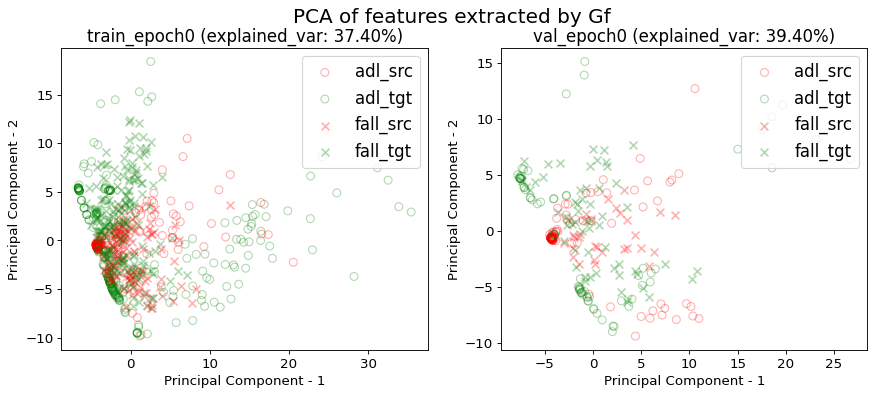

outputdir for dann_learning_diagnosis output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/dann/


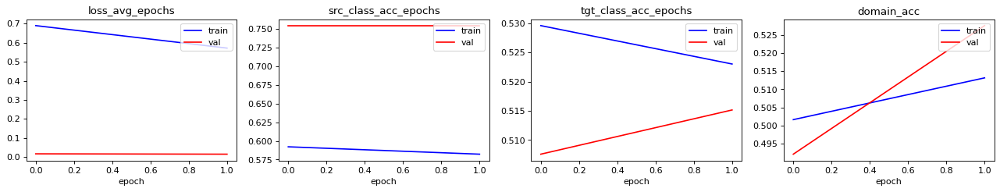

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/dann/
acc performance: 0.5855263157894737 0.9736842105263158 0.6578947368421053 0.18421052631578946
acc performance: 0.7540983606557377 0.9754098360655737 0.5573770491803278 0.12295081967213115


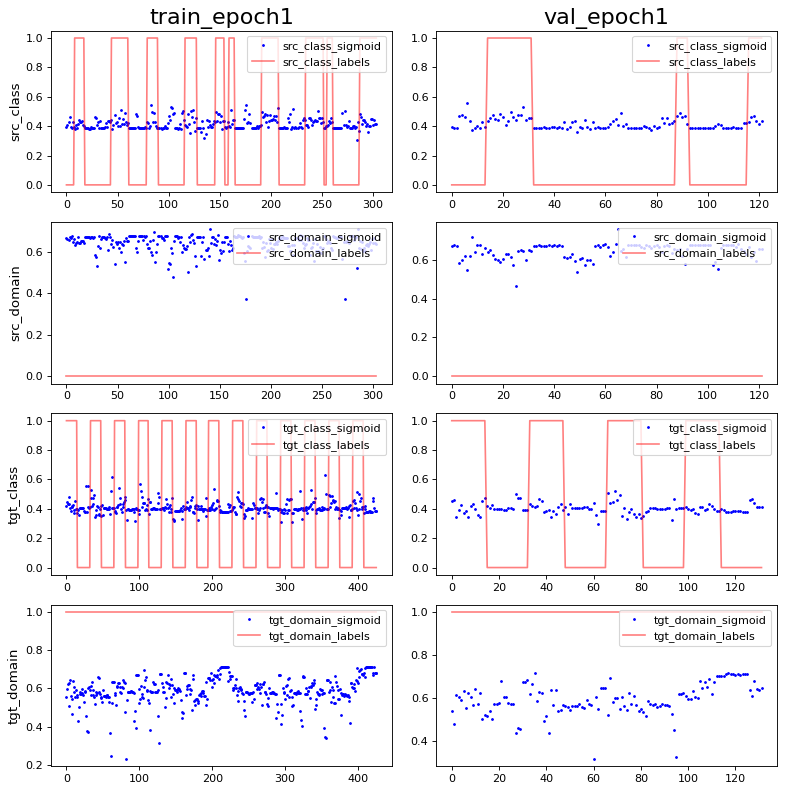

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/dann/
show standardize mean and std: 1.1612473e-09 0.99303126
PCA var: [32.5      47.5      51.9      56.       58.9      61.600002 63.600002
 65.600006 67.3      69.      ]
show standardize mean and std: 0.0 0.99303126
PCA var: [34.2      49.3      54.399998 58.8      61.8      64.7      67.1
 69.4      71.5      73.3     ]


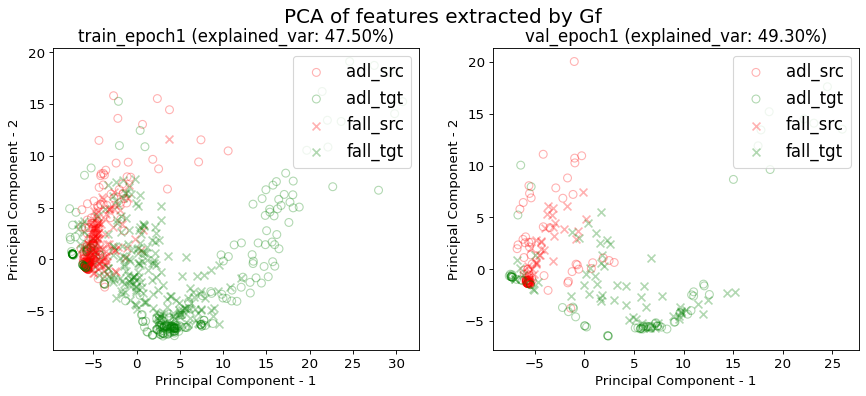

------------------------------Working on i_CV 1------------------------------
Working on get_UMAFall_loader...
train_data shape: (336, 3, 66)
val_data shape: (90, 3, 66)
Working on get_UPFall_loader...
train_data shape: (427, 3, 66)
val_data shape: (131, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/dann/
acc performance: 0.3392857142857143 1.0 0.5803571428571429 0.0
acc performance: 0.4222222222222222 1.0 0.6555555555555556 0.0


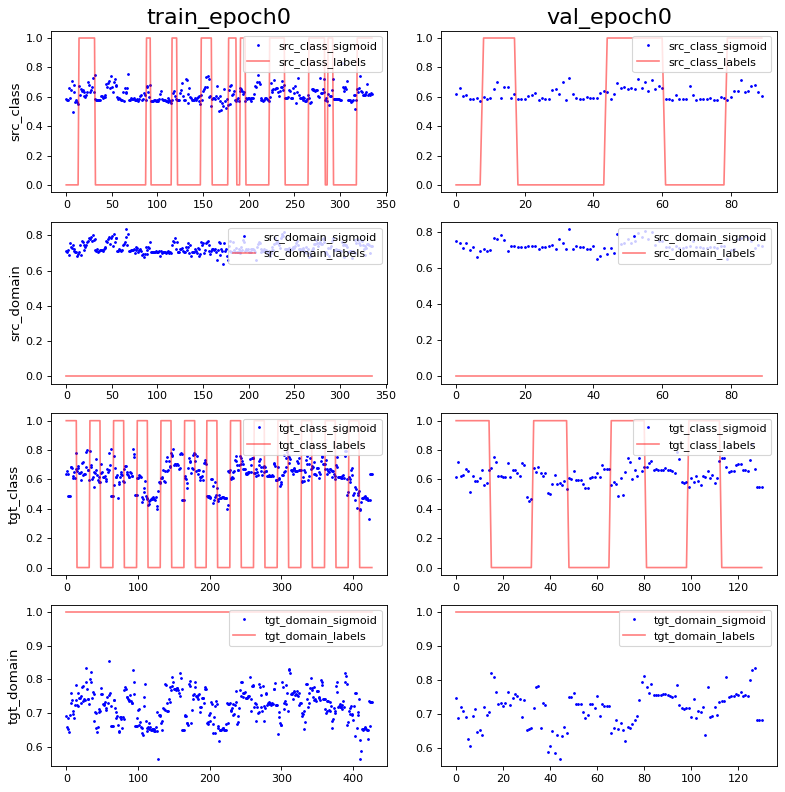

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/dann/
show standardize mean and std: -1.6665345e-09 0.99303126
PCA var: [28.       42.6      50.       54.8      58.5      61.5      64.1
 66.       67.7      69.299995]
show standardize mean and std: 0.0 0.9860133
PCA var: [23.6 35.9 44.  51.1 55.5 59.1 62.  64.6 66.9 68.9]


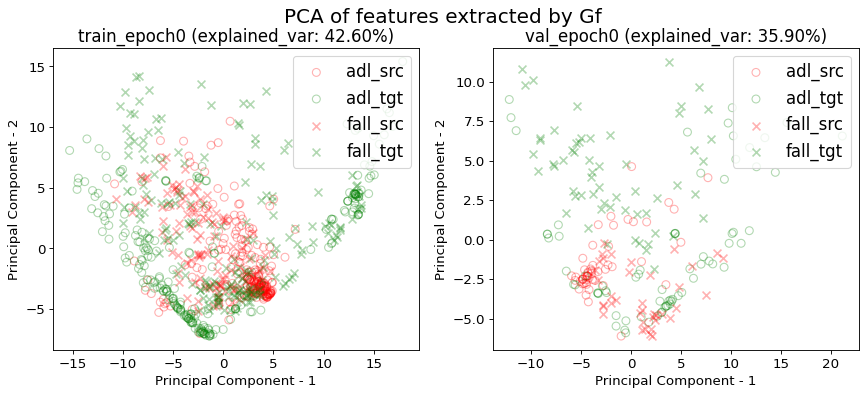

outputdir for dann_learning_diagnosis output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/dann/


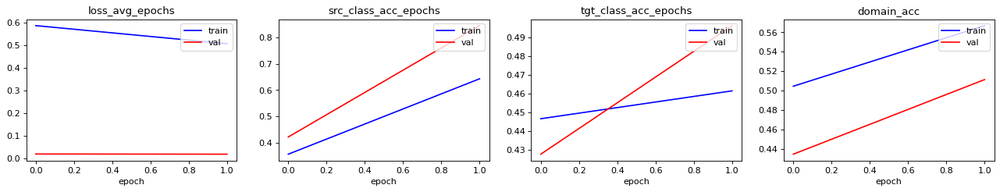

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/dann/
acc performance: 0.7708333333333334 0.6845238095238095 0.6369047619047619 0.5684523809523809
acc performance: 0.8444444444444444 0.7222222222222222 0.7222222222222222 0.5333333333333333


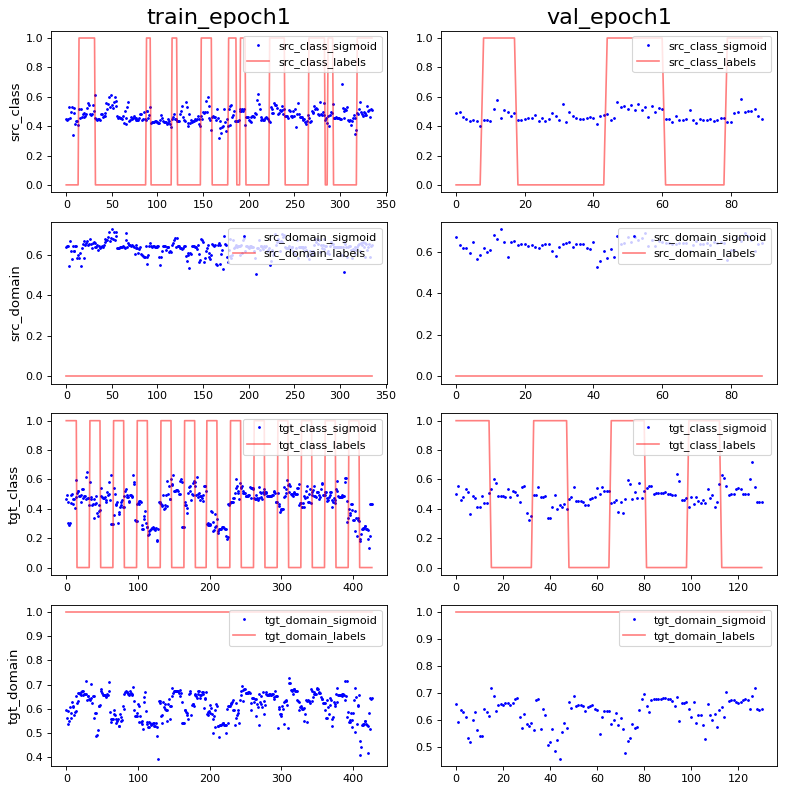

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/dann/
show standardize mean and std: 1.3887786e-09 0.98952854
PCA var: [27.3      42.399998 50.6      54.399998 58.199997 60.899998 63.499996
 65.299995 67.1      68.7     ]
show standardize mean and std: 4.794743e-10 0.9860133
PCA var: [22.400002 34.9      44.9      50.100002 54.800003 58.800003 61.600002
 64.       66.3      68.3     ]


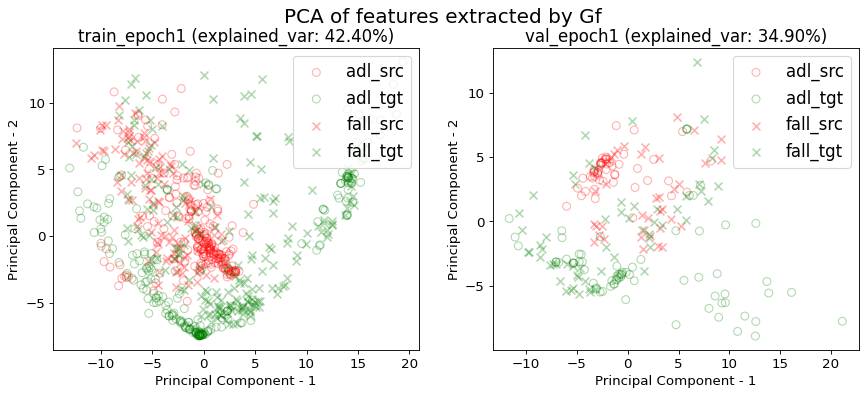

---------------Exporting model performance---------------
show df_performance


,i_CV,train_src_class_loss,train_tgt_class_loss,train_src_domain_loss,train_tgt_domain_loss,train_src_class_acc,train_tgt_class_acc,train_domain_acc,val_src_class_loss,val_tgt_class_loss,val_src_domain_loss,val_tgt_domain_loss,val_src_class_acc,val_tgt_class_acc,val_domain_acc
0,0.000000,0.168789,0.192835,0.074169,0.328708,0.582237,0.523026,0.513158,0.004404,0.005482,0.003033,0.007792,0.754098,0.515152,0.527559
1,1.000000,0.165269,0.179245,0.147676,0.194630,0.642857,0.461310,0.566964,0.006883,0.005721,0.007185,0.005573,0.844444,0.496183,0.511312
mean,0.500000,0.167029,0.186040,0.110923,0.261669,0.612547,0.492168,0.540061,0.005644,0.005601,0.005109,0.006682,0.799271,0.505667,0.519436
std,0.707107,0.002489,0.009610,0.051977,0.094807,0.042865,0.043640,0.038047,0.001753,0.000169,0.002936,0.001569,0.063884,0.013413,0.011488


val_src_class_acc: 0.7993±0.0639
val_tgt_class_acc: 0.5057±0.0134
val_domain_acc: 0.5194±0.0115
--------------Exporting notebook parameters--------------
{'CV_n': 2, 'samples_n': 426, 'classes_n': 2, 'model_name': 'DannModel', 'src_dataset_name': 'UMAFall', 'tgt_dataset_name': 'UPFall', 'src_sensor_loc': 'ankle', 'tgt_sensor_loc': 'ankle', 'date': '2020/04/11 21:59:56', 'num_epochs': 2, 'channel_n': 4, 'batch_size': 4, 'learning_rate': 0.0001, 'input_dim': (4, 3, 66), 'output_dim': 2, 'label_dim': (4,)}
val_tgt_class_acc: 0.5057±0.0134
val_domain_acc: 0.5194±0.0115
time elapsed: 00:00:55

======================  train on source, val on target(source=UMAFall_ankle to target=UPFall_ankle)  ======================

------------------------------Working on i_CV 0------------------------------
Working on get_UMAFall_loader...
train_data shape: (304, 3, 66)
val_data shape: (122, 3, 66)
Working on get_UPFall_loader...
train_data shape: (426, 3, 66)
val_data shape: (132, 3, 66)
FeatureExtractor

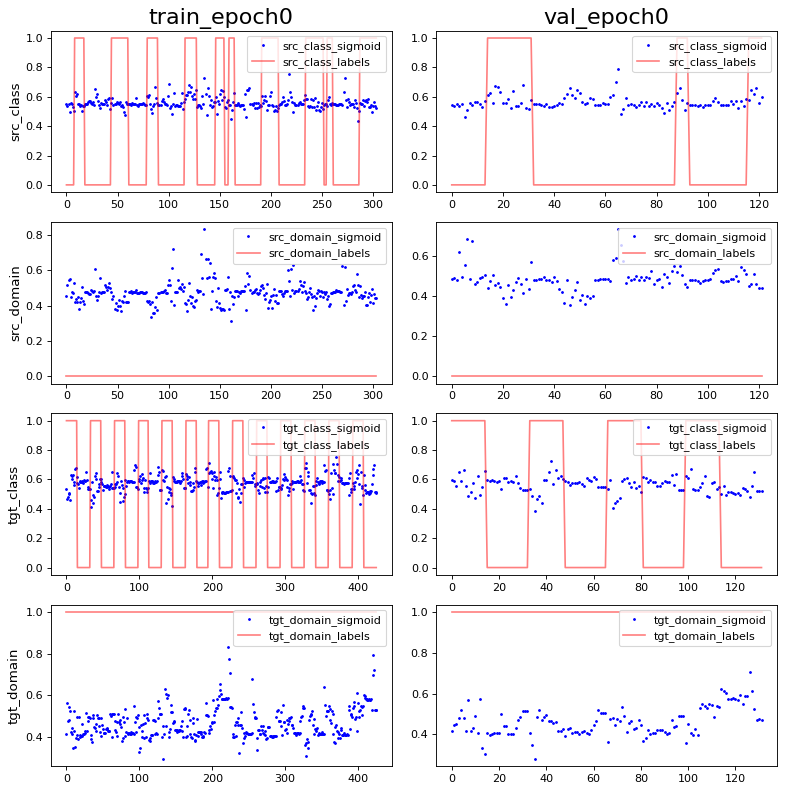

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/source/
show standardize mean and std: 1.1612473e-09 0.98952854
PCA var: [23.4 40.3 49.1 54.  57.7 60.5 63.  65.  66.9 68.5]
show standardize mean and std: 3.337443e-09 0.98952854
PCA var: [23.3      36.6      46.5      52.3      56.7      60.600002 63.800003
 66.3      68.4      70.3     ]


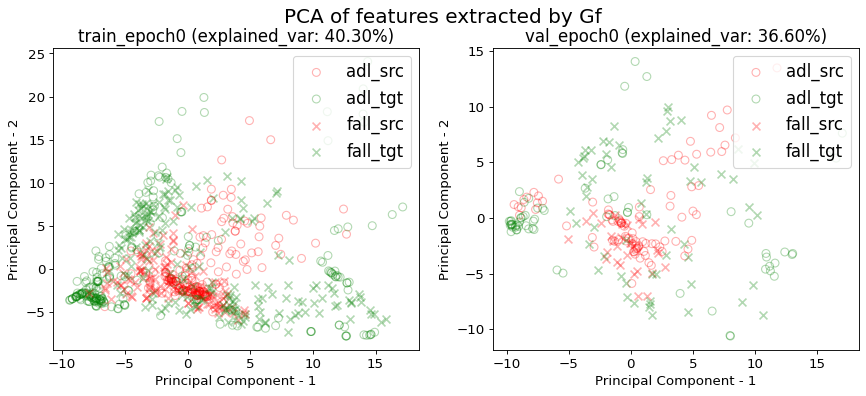

outputdir for baseline_learning_diagnosis output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/source/


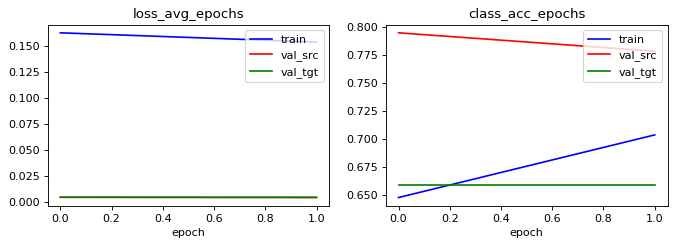

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/source/
acc performance: 0.7236842105263158 0.3848684210526316 1.0296052631578947 0.5921052631578947
acc performance: 0.7786885245901639 0.4180327868852459 0.7131147540983607 0.4180327868852459


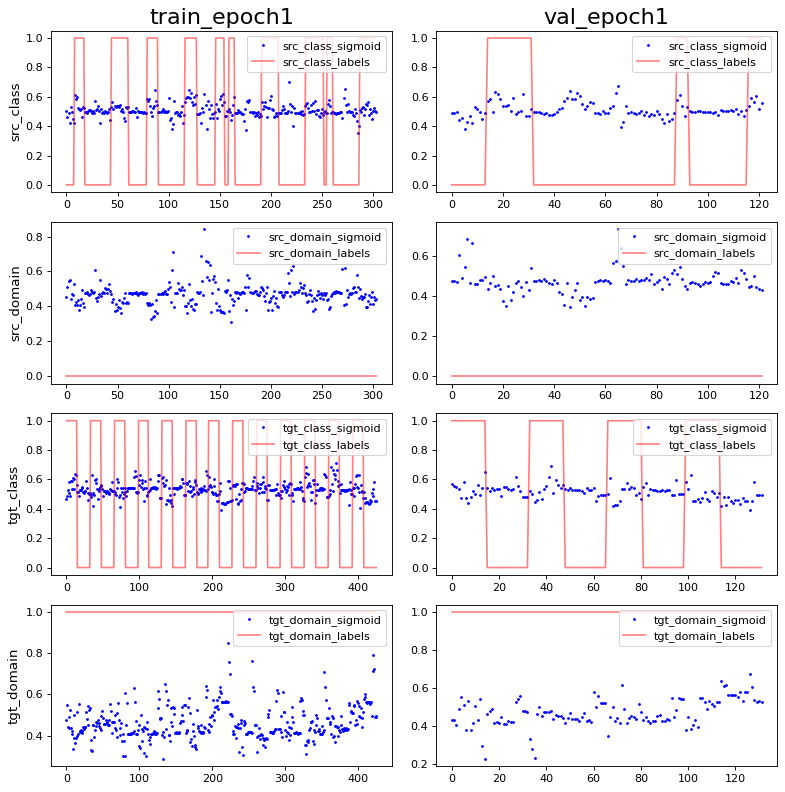

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/source/
show standardize mean and std: 2.3224946e-09 0.98952854
PCA var: [23.6      42.1      47.6      52.399998 55.6      58.3      60.8
 62.8      64.5      66.1     ]
show standardize mean and std: 0.0 0.9895285
PCA var: [23.800001 40.4      47.800003 52.800003 56.600002 59.800003 62.500004
 64.700005 66.8      68.600006]


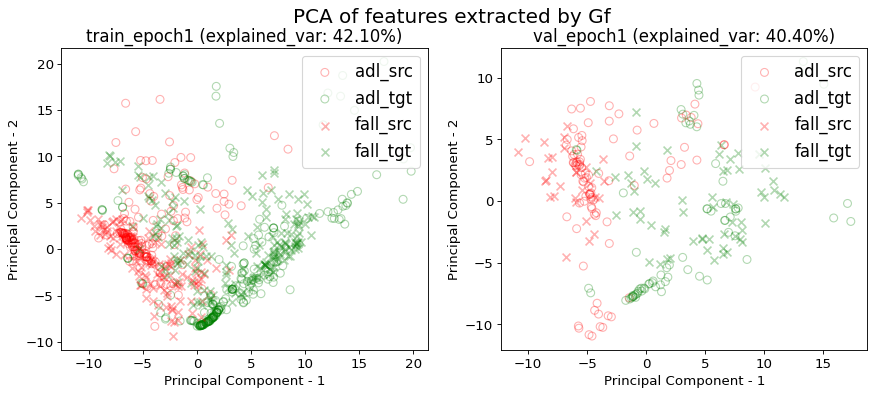

------------------------------Working on i_CV 1------------------------------
Working on get_UMAFall_loader...
train_data shape: (336, 3, 66)
val_data shape: (90, 3, 66)
Working on get_UPFall_loader...
train_data shape: (427, 3, 66)
val_data shape: (131, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/source/
acc performance: 0.25297619047619047 0.5714285714285714 0.39880952380952384 0.8541666666666666
acc performance: 0.2111111111111111 0.5444444444444444 0.5 0.8


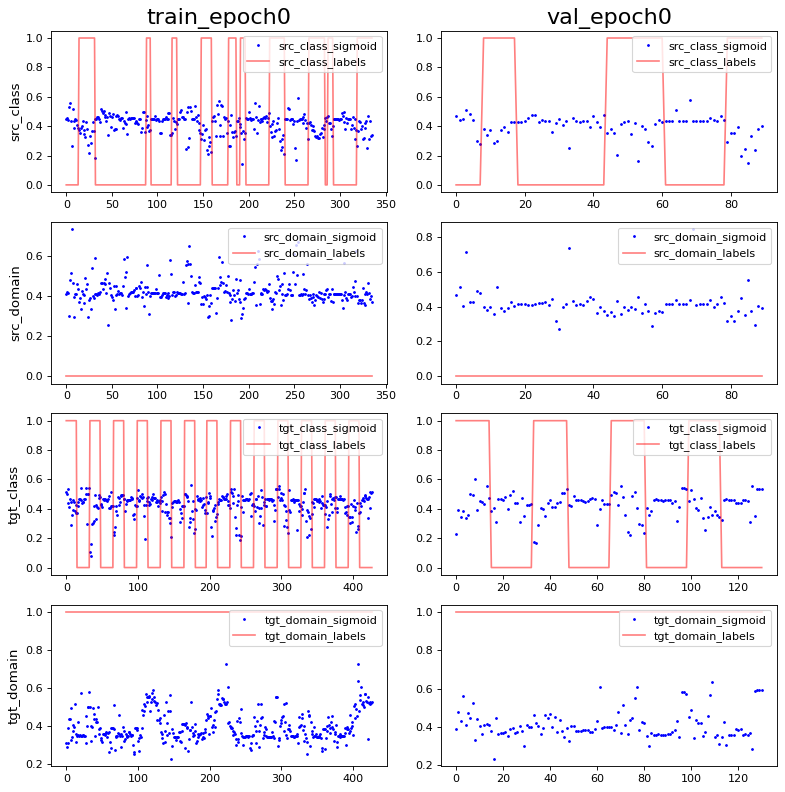

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/source/
show standardize mean and std: 5.5551147e-10 0.9965217
PCA var: [18.7      32.100002 38.600002 42.9      46.800003 50.100002 52.4
 54.5      56.5      58.3     ]
show standardize mean and std: -2.3973714e-09 0.9965218
PCA var: [21.5      30.7      38.9      45.       49.8      53.6      56.6
 59.3      61.899998 64.299995]


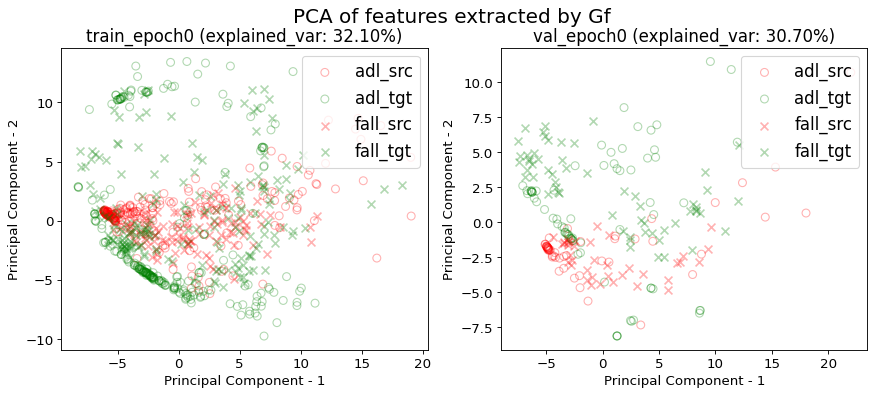

outputdir for baseline_learning_diagnosis output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/source/


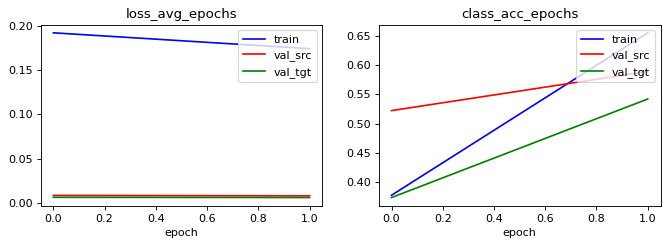

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/source/
acc performance: 0.6636904761904762 0.8154761904761905 0.6845238095238095 0.9613095238095238
acc performance: 0.5888888888888889 0.6111111111111112 0.7888888888888889 0.9222222222222223


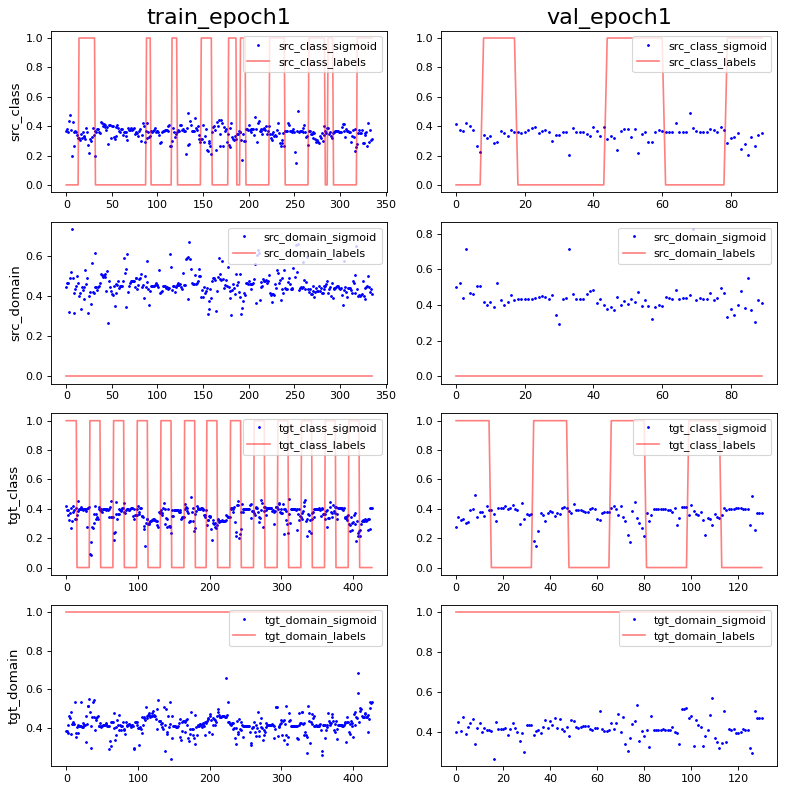

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/source/
show standardize mean and std: 1.1110229e-09 0.9965217
PCA var: [20.3      28.5      36.5      41.2      45.       48.       50.6
 52.899998 54.899998 56.699997]
show standardize mean and std: -2.3973714e-09 0.9965218
PCA var: [20.800001 30.600002 38.000004 44.100002 48.100002 51.9      55.100002
 58.2      61.100002 63.800003]


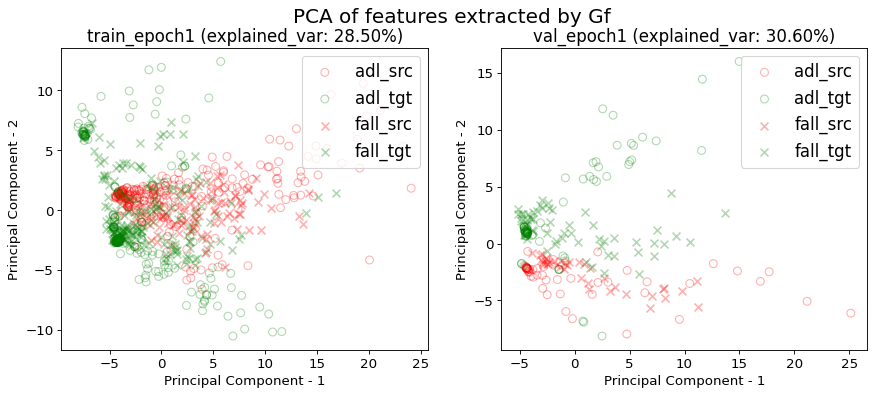

---------------Exporting model performance---------------
show df_performance


,i_CV,train_loss,train_acc,val_loss,val_acc,tgt_val_loss,tgt_val_acc
0,0.000000,0.153489,0.703947,0.004564,0.778689,0.004841,0.659091
1,1.000000,0.173901,0.654762,0.007988,0.588889,0.006076,0.541985
mean,0.500000,0.163695,0.679355,0.006276,0.683789,0.005458,0.600538
std,0.707107,0.014433,0.034779,0.002421,0.134209,0.000873,0.082807


src val loss: 0.0063±0.0024
src val acc: 0.6838±0.1342
tgt val loss: 0.0055±0.0009
tgt val acc: 0.6005±0.0828
--------------Exporting notebook parameters--------------
{'CV_n': 2, 'samples_n': 426, 'classes_n': 2, 'model_name': 'DannModel', 'dataset_name': 'UMAFall', 'num_epochs': 2, 'channel_n': 4, 'batch_size': 4, 'learning_rate': 0.0001, 'sensor_loc': 'ankle', 'date': '2020/04/11 22:00:11', 'input_dim': (4, 3, 66), 'output_dim': (4,)}

======================  train on target, val on target(source=UMAFall_ankle to target=UPFall_ankle)  ======================

------------------------------Working on i_CV 0------------------------------
Working on get_UPFall_loader...
train_data shape: (426, 3, 66)
val_data shape: (132, 3, 66)
Working on get_UMAFall_loader...
train_data shape: (304, 3, 66)
val_data shape: (122, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modelo

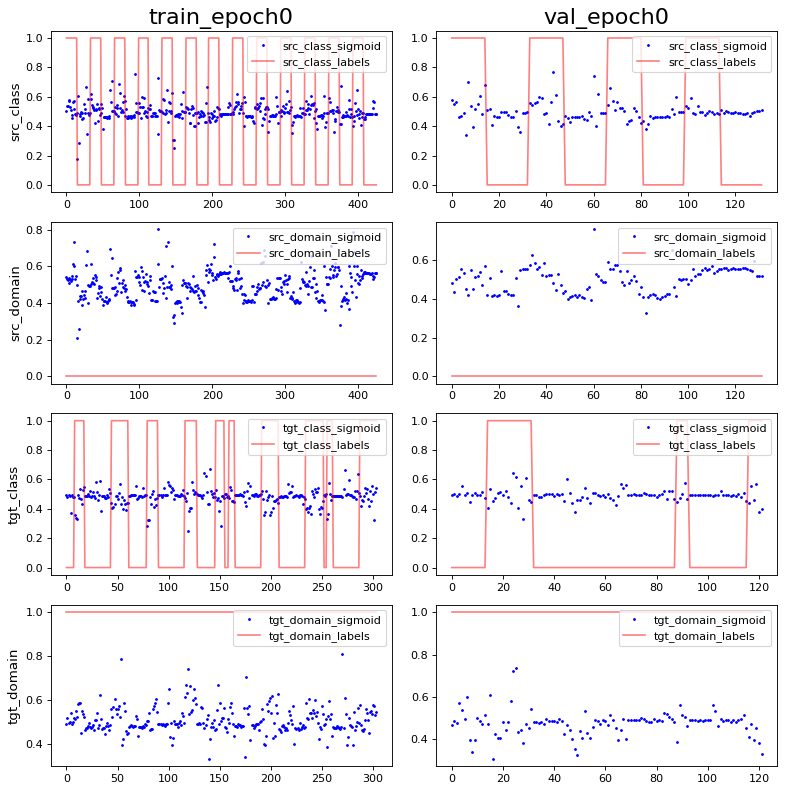

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/target/
show standardize mean and std: -2.7579623e-09 1.0
PCA var: [28.600002 39.300003 47.300003 52.200005 56.100006 59.500008 62.300007
 64.8      67.       68.9     ]
show standardize mean and std: 0.0 1.0
PCA var: [36.399998 46.299995 53.299995 58.199997 62.1      65.2      68.299995
 70.99999  73.399994 75.7     ]


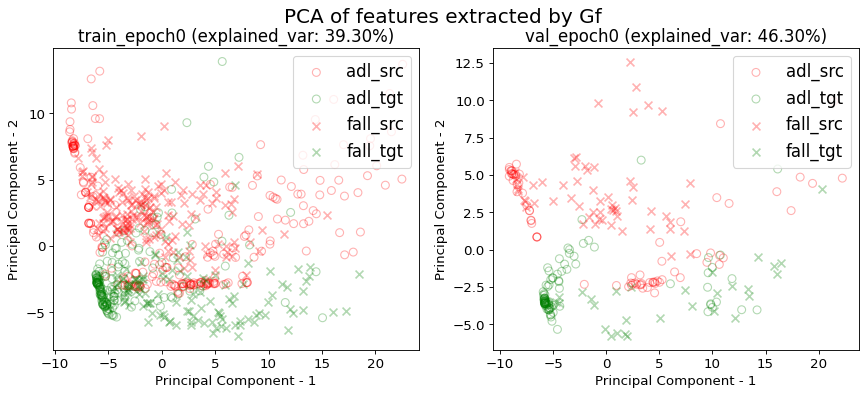

outputdir for baseline_learning_diagnosis output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/target/


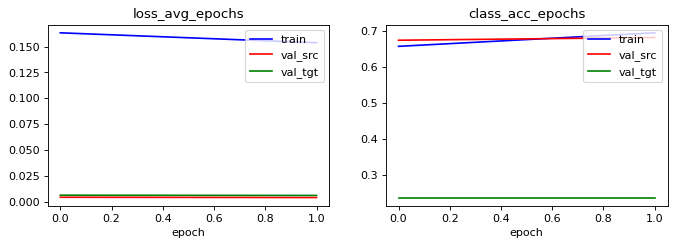

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/target/
acc performance: 0.7652582159624414 0.5492957746478874 0.21830985915492956 0.09624413145539906
acc performance: 0.6818181818181818 0.5909090909090909 0.2196969696969697 0.13636363636363635


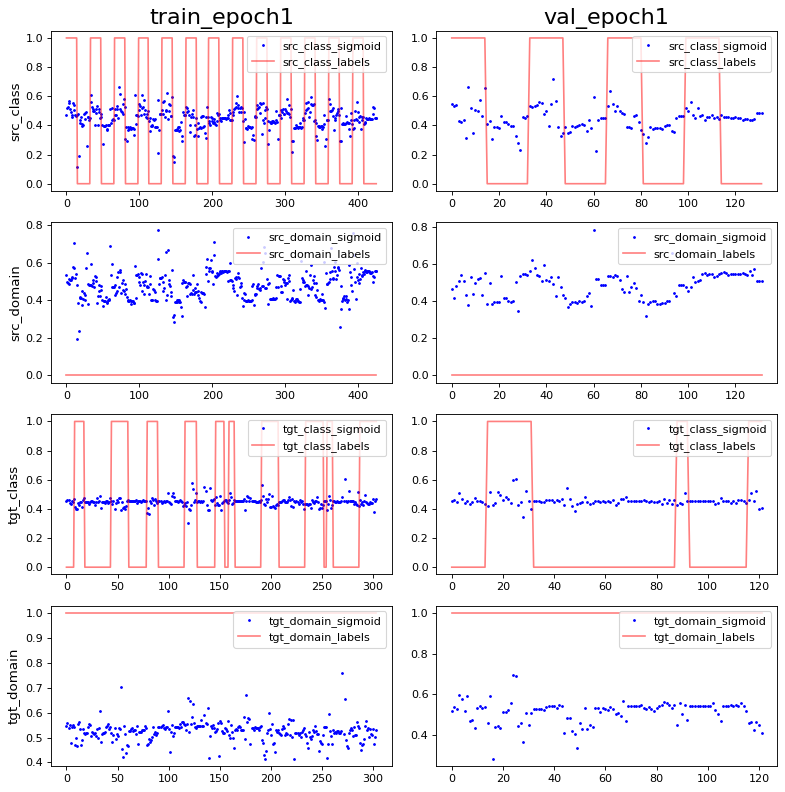

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/target/
show standardize mean and std: 3.4837417e-09 0.9965218
PCA var: [39.5      48.6      54.8      58.8      62.       64.7      66.899994
 68.99999  70.799995 72.49999 ]
show standardize mean and std: 0.0 0.9965218
PCA var: [38.9      47.7      54.800003 59.700005 63.000004 66.200005 69.3
 72.200005 74.600006 76.8     ]


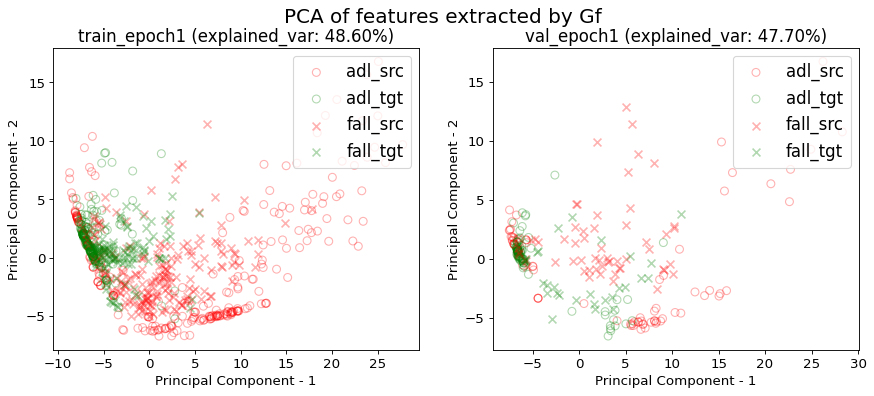

------------------------------Working on i_CV 1------------------------------
Working on get_UPFall_loader...
train_data shape: (427, 3, 66)
val_data shape: (131, 3, 66)
Working on get_UMAFall_loader...
train_data shape: (336, 3, 66)
val_data shape: (90, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/target/
acc performance: 0.6814988290398126 0.7517564402810304 0.550351288056206 0.03278688524590164
acc performance: 0.6717557251908397 0.8091603053435115 0.42748091603053434 0.015267175572519083


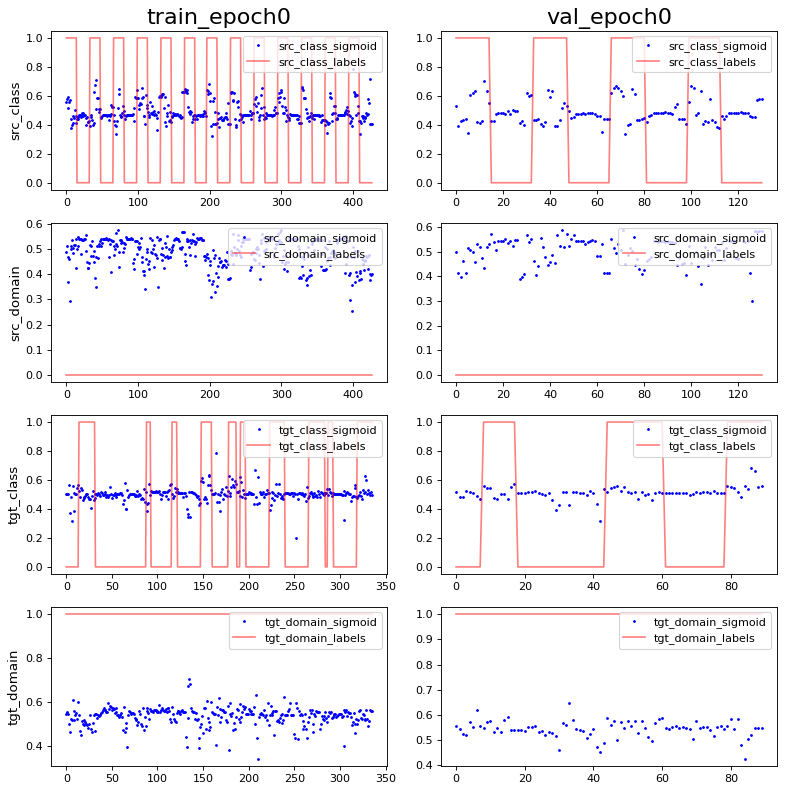

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/target/
show standardize mean and std: 1.1110229e-09 0.9965217
PCA var: [32.       43.7      54.4      58.9      62.7      65.8      68.
 69.7      71.399994 72.99999 ]
show standardize mean and std: 0.0 0.99303126
PCA var: [25.5      42.       54.2      61.       65.       68.7      71.799995
 73.99999  75.799995 77.49999 ]


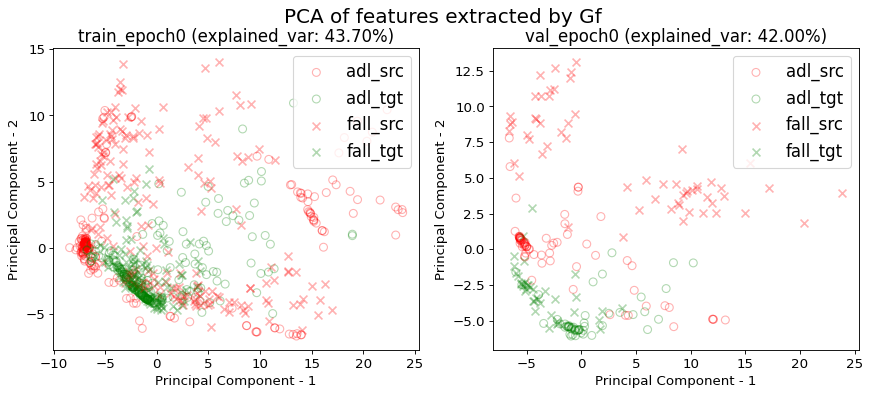

outputdir for baseline_learning_diagnosis output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/target/


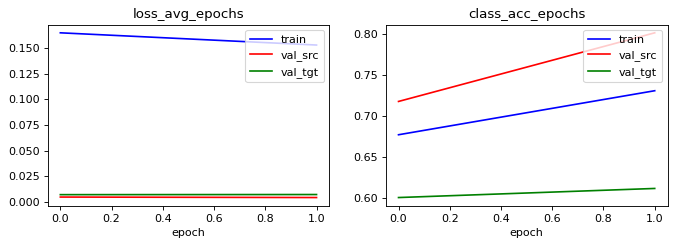

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/target/
acc performance: 0.7704918032786885 0.7845433255269321 0.5526932084309133 0.08430913348946135
acc performance: 0.8015267175572519 0.7557251908396947 0.4198473282442748 0.07633587786259542


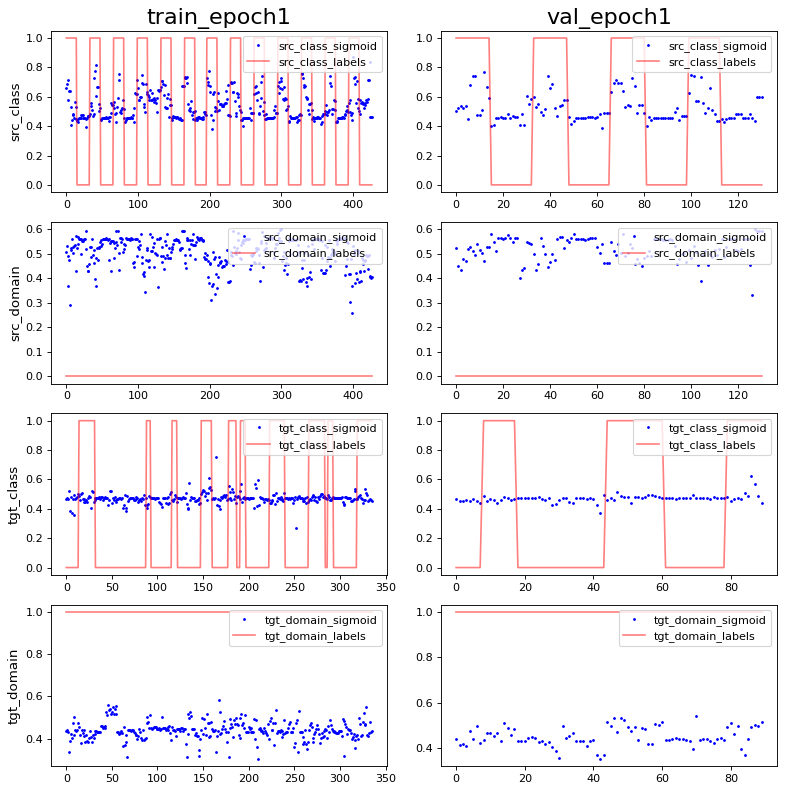

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/target/
show standardize mean and std: 4.0274584e-09 0.99303126
PCA var: [40.9 58.2 64.5 68.8 71.9 74.3 75.9 77.4 78.8 80. ]
show standardize mean and std: 0.0 0.99303126
PCA var: [40.6      55.3      64.8      69.600006 73.40001  77.00001  79.200005
 80.8      82.200005 83.4     ]


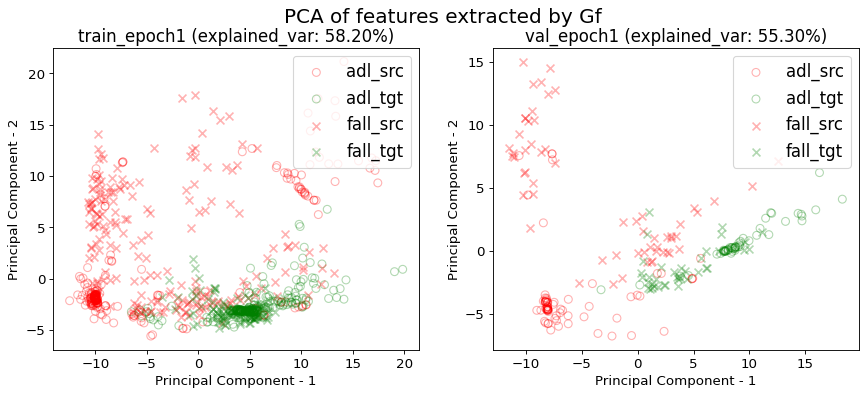

---------------Exporting model performance---------------
show df_performance


,i_CV,train_loss,train_acc,val_loss,val_acc,tgt_val_loss,tgt_val_acc
0,0.000000,0.153665,0.694836,0.004427,0.681818,0.006454,0.237705
1,1.000000,0.152905,0.730679,0.004159,0.801527,0.007097,0.611111
mean,0.500000,0.153285,0.712757,0.004293,0.741672,0.006776,0.424408
std,0.707107,0.000537,0.025345,0.000190,0.084647,0.000454,0.264038


src val loss: 0.0043±0.0002
src val acc: 0.7417±0.0846
tgt val loss: 0.0068±0.0005
tgt val acc: 0.4244±0.2640
--------------Exporting notebook parameters--------------
{'CV_n': 2, 'samples_n': 558, 'classes_n': 2, 'model_name': 'DannModel', 'dataset_name': 'UPFall', 'num_epochs': 2, 'channel_n': 4, 'batch_size': 4, 'learning_rate': 0.0001, 'sensor_loc': 'ankle', 'date': '2020/04/11 22:00:27', 'input_dim': (4, 3, 66), 'output_dim': (4,)}

======================  DANN training transferring knowledge(source=UMAFall_ankle to target=UPFall_ankle)  ======================

------------------------------Working on i_CV 0------------------------------
Working on get_UMAFall_loader...
train_data shape: (304, 3, 66)
val_data shape: (122, 3, 66)
Working on get_UPFall_loader...
train_data shape: (426, 3, 66)
val_data shape: (132, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_m

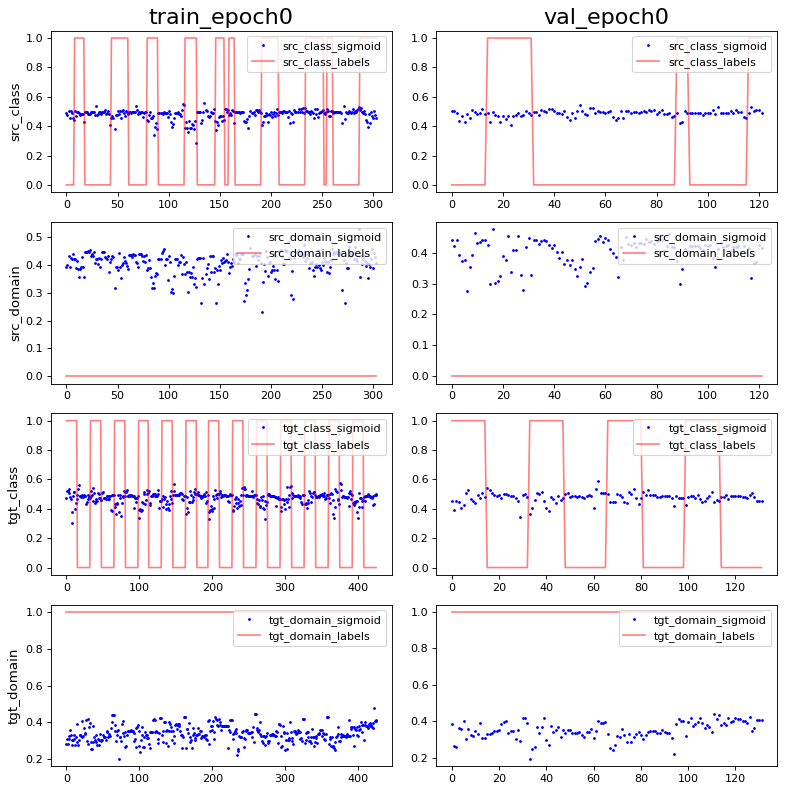

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/dann/
show standardize mean and std: 0.0 0.9965218
PCA var: [22.1      34.2      41.9      47.800003 51.700005 54.500004 56.700005
 58.800003 60.700005 62.300003]
show standardize mean and std: 0.0 0.9965218
PCA var: [19.400002 30.900002 40.4      46.2      51.100002 54.000004 56.700005
 59.200005 61.300003 63.300003]


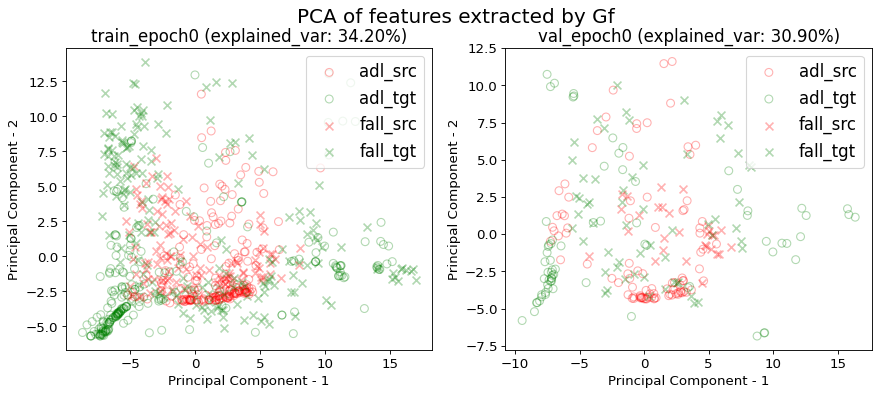

outputdir for dann_learning_diagnosis output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/dann/


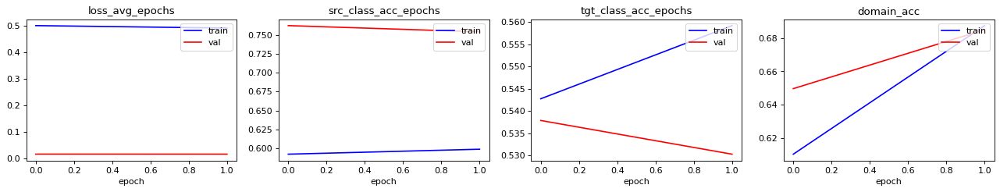

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/dann/
acc performance: 0.5888157894736842 0.7039473684210527 0.7368421052631579 1.111842105263158
acc performance: 0.7540983606557377 0.7049180327868853 0.5737704918032787 0.7213114754098361


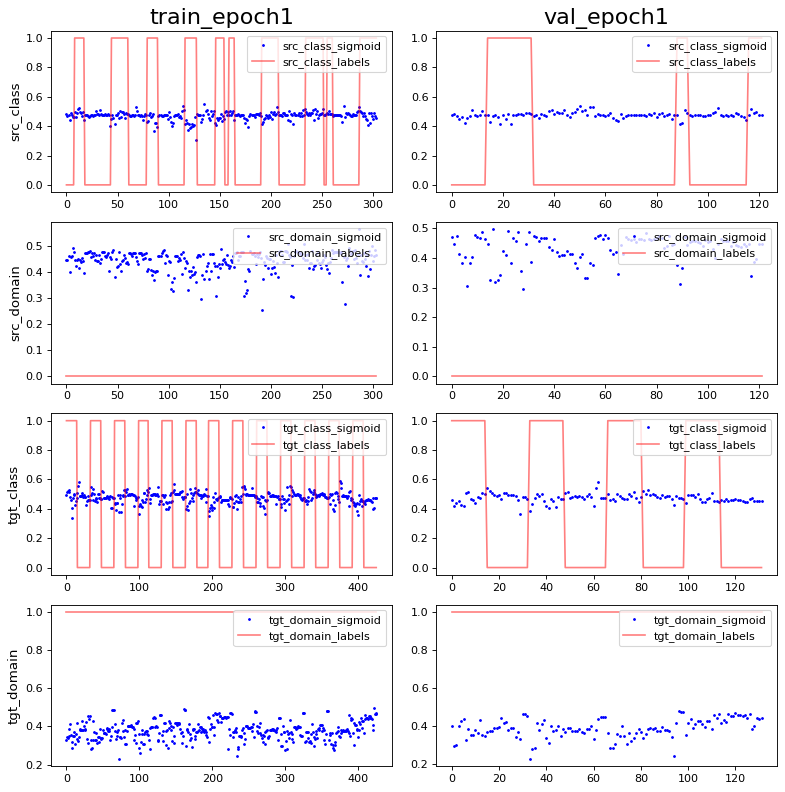

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/dann/
show standardize mean and std: -5.8062366e-10 0.9965218
PCA var: [24.3      36.9      44.       49.5      53.       55.6      58.
 60.1      61.899998 63.399998]
show standardize mean and std: -1.9816067e-09 0.9965218
PCA var: [21.6      35.       43.2      49.600002 53.600002 56.4      58.9
 61.300003 63.500004 65.4     ]


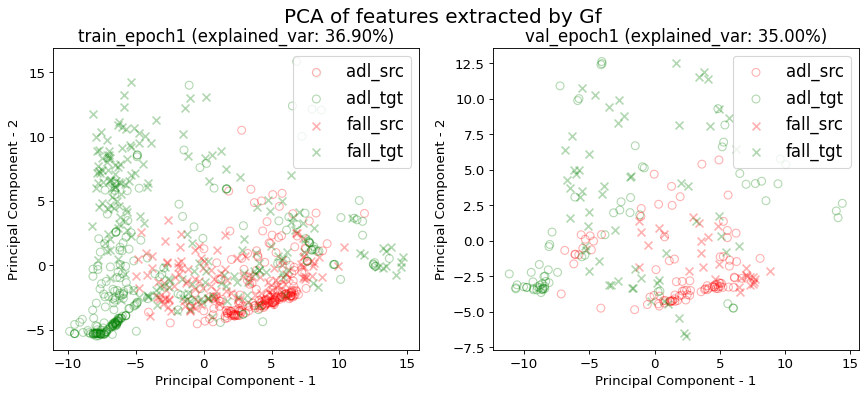

------------------------------Working on i_CV 1------------------------------
Working on get_UMAFall_loader...
train_data shape: (336, 3, 66)
val_data shape: (90, 3, 66)
Working on get_UPFall_loader...
train_data shape: (427, 3, 66)
val_data shape: (131, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/dann/
acc performance: 0.6904761904761905 0.9851190476190477 0.4255952380952381 0.005952380952380952
acc performance: 0.6555555555555556 0.9888888888888889 0.6333333333333333 0.022222222222222223


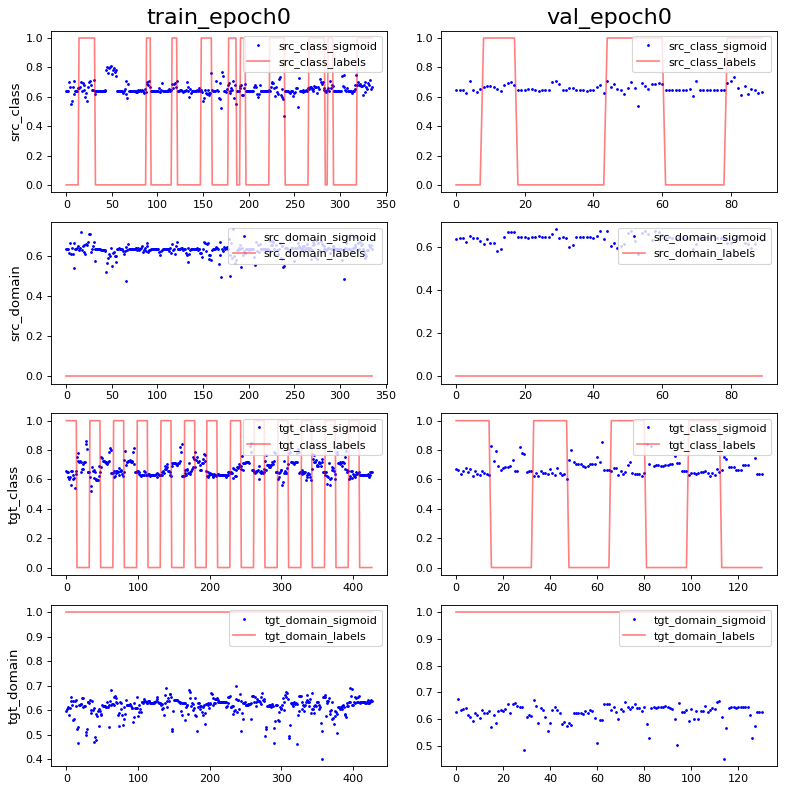

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/dann/
show standardize mean and std: 2.2220459e-09 0.99303126
PCA var: [32.300003 42.200005 48.600006 53.300007 56.800007 59.900005 62.300007
 64.40001  66.20001  67.80001 ]
show standardize mean and std: 0.0 0.98952854
PCA var: [32.5      43.6      51.199997 55.299995 59.099995 62.399994 65.299995
 67.99999  70.399994 72.399994]


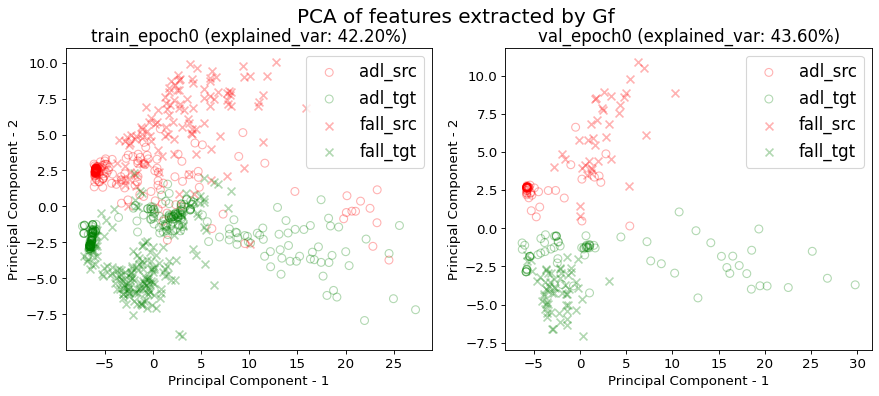

outputdir for dann_learning_diagnosis output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/dann/


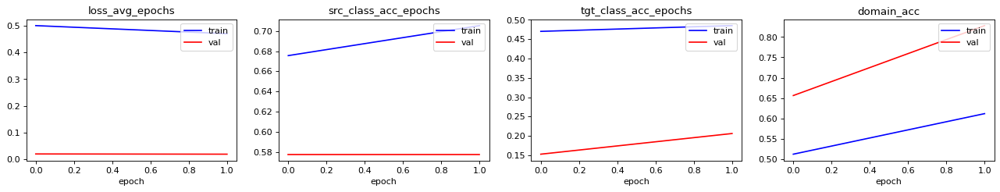

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/dann/
acc performance: 0.6785714285714286 0.9107142857142857 0.3333333333333333 0.7886904761904762
acc performance: 0.5777777777777777 0.9111111111111111 0.3 1.1222222222222222


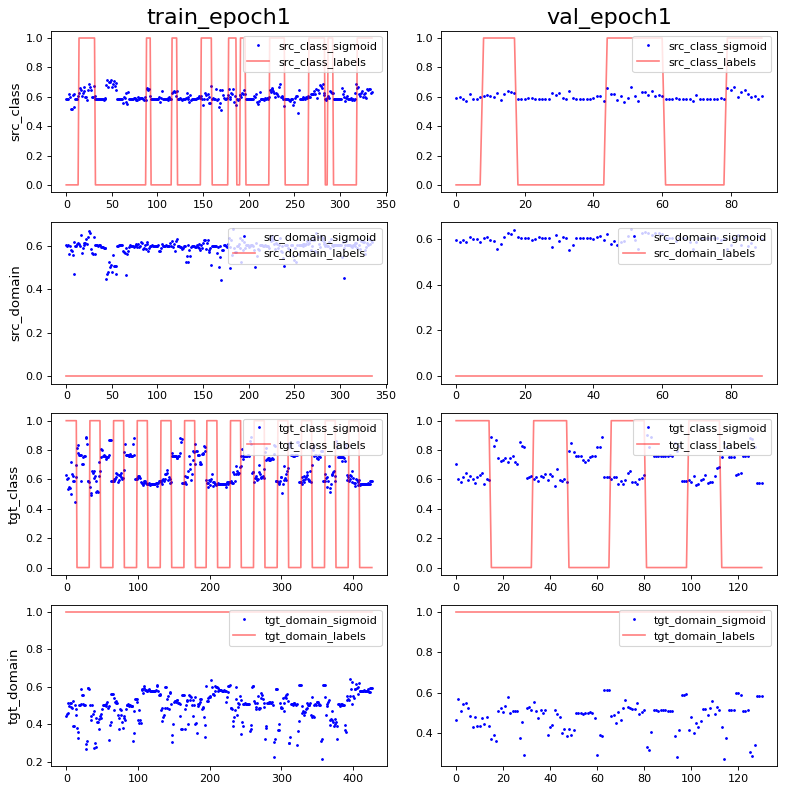

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/dann/
show standardize mean and std: -2.2220459e-09 0.9860133
PCA var: [42.699997 54.299995 59.299995 64.2      66.799995 68.899994 70.7
 72.399994 73.799995 75.2     ]
show standardize mean and std: 7.671589e-09 0.98601323
PCA var: [43.9      54.600002 60.7      66.2      69.299995 71.7      73.799995
 75.7      77.6      79.2     ]


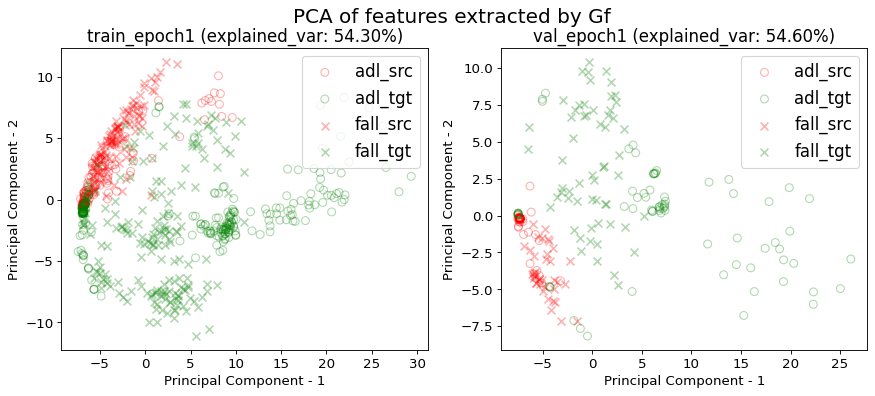

---------------Exporting model performance---------------
show df_performance


,i_CV,train_src_class_loss,train_tgt_class_loss,train_src_domain_loss,train_tgt_domain_loss,train_src_class_acc,train_tgt_class_acc,train_domain_acc,val_src_class_loss,val_tgt_class_loss,val_src_domain_loss,val_tgt_domain_loss,val_src_class_acc,val_tgt_class_acc,val_domain_acc
0,0.000000,0.173360,0.189043,0.169738,0.146861,0.598684,0.559211,0.687500,0.005297,0.005618,0.005548,0.004639,0.754098,0.530303,0.685039
1,1.000000,0.139890,0.195854,0.153893,0.176802,0.705357,0.485119,0.611607,0.006938,0.007416,0.006820,0.004693,0.577778,0.206107,0.828054
mean,0.500000,0.156625,0.192448,0.161816,0.161832,0.652021,0.522165,0.649554,0.006117,0.006517,0.006184,0.004666,0.665938,0.368205,0.756547
std,0.707107,0.023666,0.004816,0.011204,0.021172,0.075429,0.052391,0.053664,0.001160,0.001271,0.000899,0.000038,0.124677,0.229241,0.101127


val_src_class_acc: 0.6659±0.1247
val_tgt_class_acc: 0.3682±0.2292
val_domain_acc: 0.7565±0.1011
--------------Exporting notebook parameters--------------
{'CV_n': 2, 'samples_n': 426, 'classes_n': 2, 'model_name': 'DannModel', 'src_dataset_name': 'UMAFall', 'tgt_dataset_name': 'UPFall', 'src_sensor_loc': 'ankle', 'tgt_sensor_loc': 'ankle', 'date': '2020/04/11 22:00:48', 'num_epochs': 2, 'channel_n': 4, 'batch_size': 4, 'learning_rate': 0.0001, 'input_dim': (4, 3, 66), 'output_dim': 2, 'label_dim': (4,)}
val_tgt_class_acc: 0.3682±0.2292
val_domain_acc: 0.7565±0.1011
time elapsed: 00:00:52
df_performance_table_rep_agg saved at /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UMAFall_ankle_UPFall_ankle/repetitive_results/


,rep_i0,rep_i1,rep_avg
channel_n,4,4,4
batch_size,4,4,4
learning_rate,0.0001,0.0001,0.0001
source,0.677±0.061,0.601±0.083,0.639±0.054
DANN,0.506±0.013,0.368±0.229,0.437±0.098
target,0.651±0.267,0.742±0.085,0.697±0.064
domain,0.519±0.011,0.757±0.101,0.638±0.168
time_elapsed,55.6985,52.5968,54.1476
num_params,748,748,748


outputdir for stage2 output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/

======================  train on source, val on target(source=UPFall_rightpocket to target=UMAFall_leg)  ======================

------------------------------Working on i_CV 0------------------------------
Working on get_UPFall_loader...
train_data shape: (395, 3, 66)
val_data shape: (97, 3, 66)
Working on get_UMAFall_loader...
train_data shape: (305, 3, 66)
val_data shape: (182, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/source/
acc performance: 0.43544303797468353 0.9898734177215189 0.2759493670886076 0.005063291139240506
acc performance: 0.4639175257731959 0.9896907216494846 0.7422680412371134 0.0


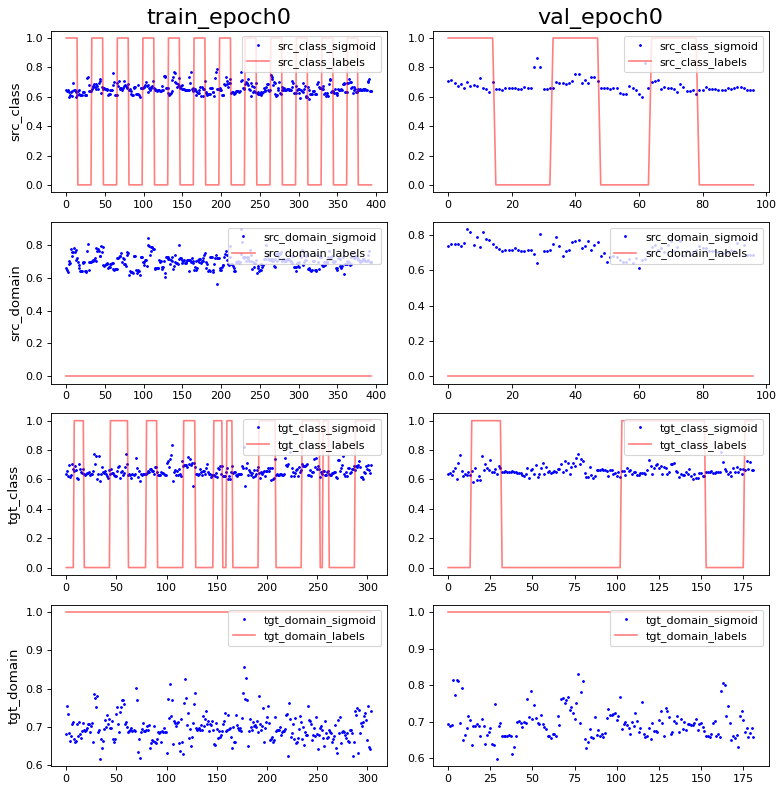

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/source/
show standardize mean and std: -3.784422e-10 0.98952854
PCA var: [24.3      39.2      47.100002 53.7      58.5      61.3      63.899998
 66.299995 68.399994 69.99999 ]
show standardize mean and std: 0.0 0.98952854
PCA var: [28.5      42.7      50.7      56.100002 60.100002 63.9      66.9
 69.5      71.6      73.5     ]


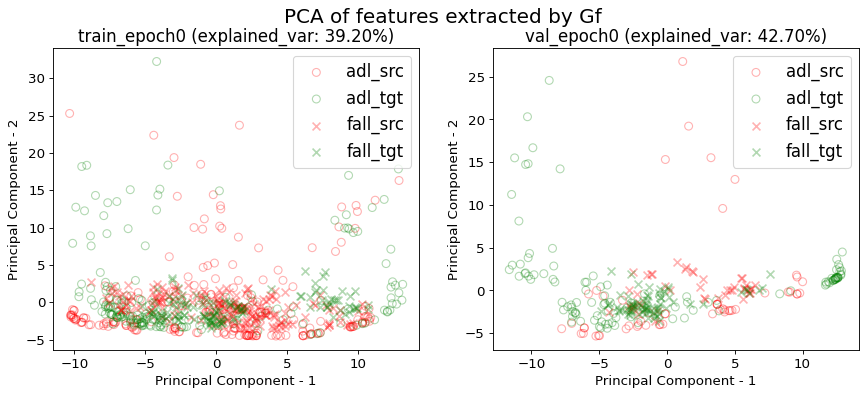

outputdir for baseline_learning_diagnosis output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/source/


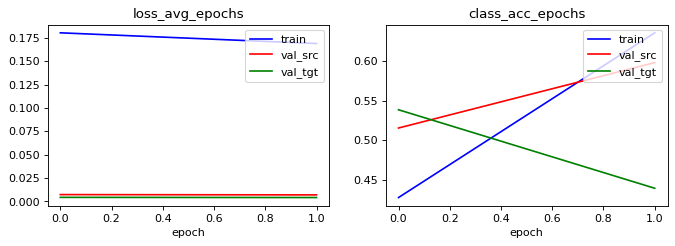

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/source/
acc performance: 0.660759493670886 0.9924050632911392 0.3341772151898734 0.0
acc performance: 0.5979381443298969 0.9896907216494846 0.8247422680412371 0.0


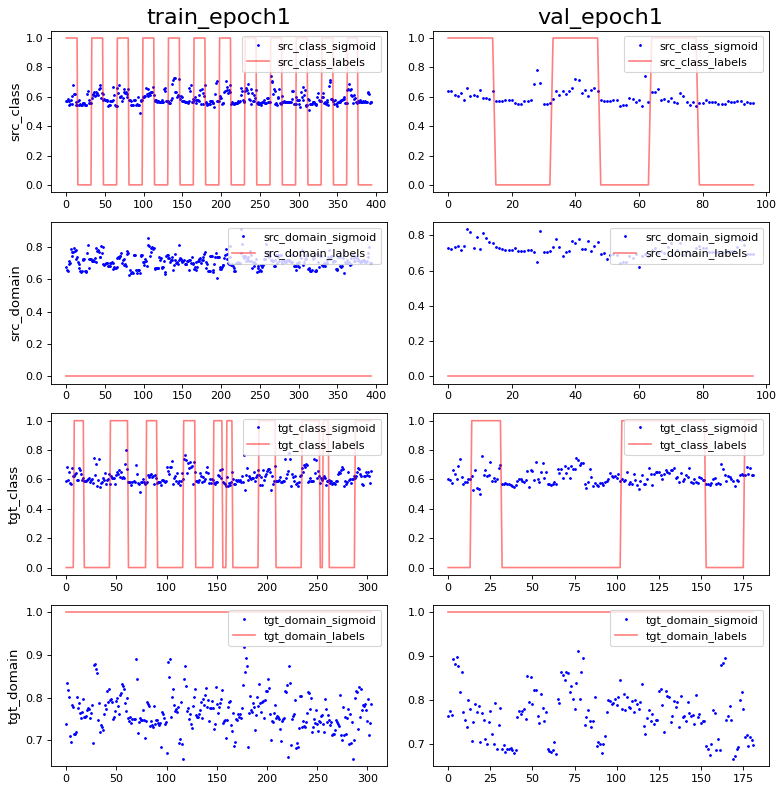

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/source/
show standardize mean and std: -8.628482e-09 0.98952854
PCA var: [28.8      42.699997 50.1      56.699997 60.6      63.399998 65.799995
 67.99999  69.99999  71.59999 ]
show standardize mean and std: -4.177785e-09 0.9895285
PCA var: [40.  53.6 58.8 63.8 66.9 69.8 72.3 74.3 76.  77.6]


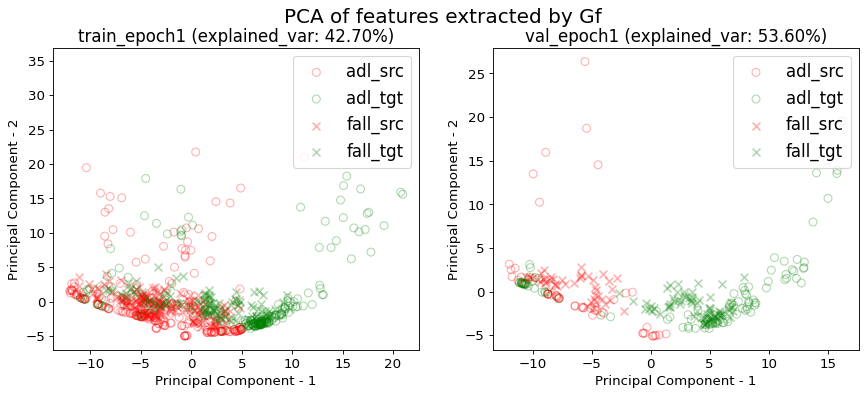

------------------------------Working on i_CV 1------------------------------
Working on get_UPFall_loader...
train_data shape: (393, 3, 66)
val_data shape: (99, 3, 66)
Working on get_UMAFall_loader...
train_data shape: (396, 3, 66)
val_data shape: (91, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/source/
acc performance: 0.3994910941475827 0.12468193384223919 0.33078880407124683 0.7684478371501272
acc performance: 0.40404040404040403 0.1111111111111111 0.3333333333333333 0.6767676767676768


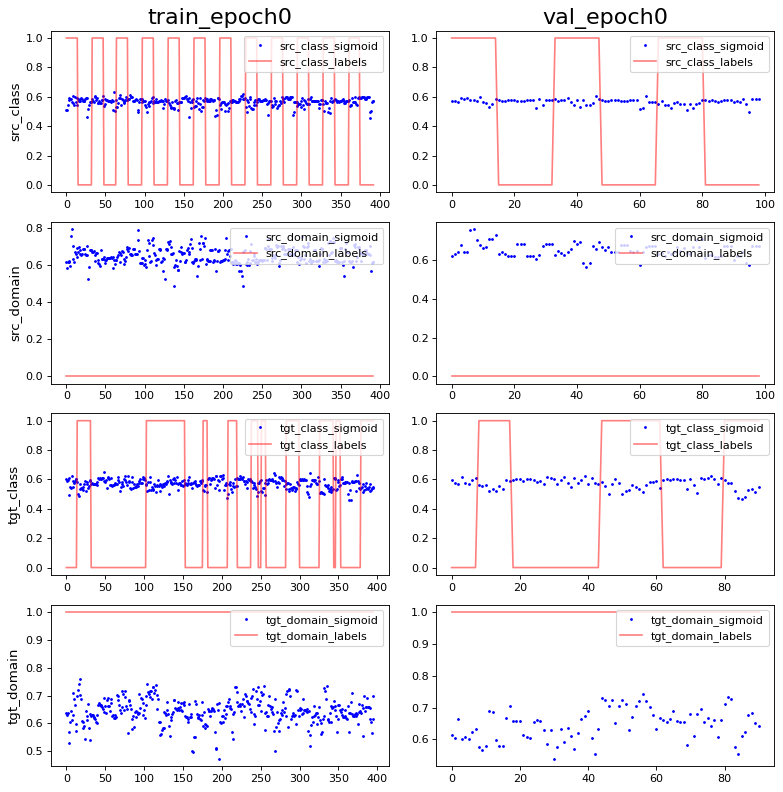

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/source/
show standardize mean and std: -1.0744113e-09 0.9965218
PCA var: [25.3 36.3 43.3 48.5 52.3 54.8 57.  59.1 61.  62.7]
show standardize mean and std: 0.0 0.98952854
PCA var: [23.       35.4      46.5      54.6      59.1      62.8      65.8
 68.4      70.700005 72.700005]


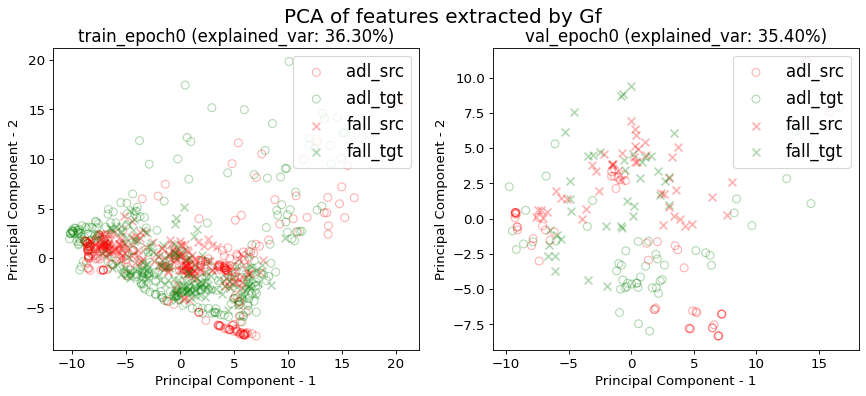

outputdir for baseline_learning_diagnosis output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/source/


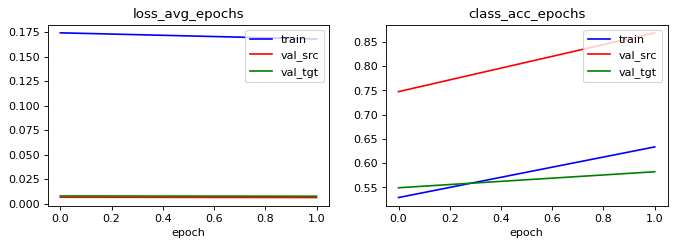

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/source/
acc performance: 0.7684478371501272 0.13231552162849872 0.5928753180661578 0.8651399491094147
acc performance: 0.8686868686868687 0.15151515151515152 0.5353535353535354 0.8080808080808081


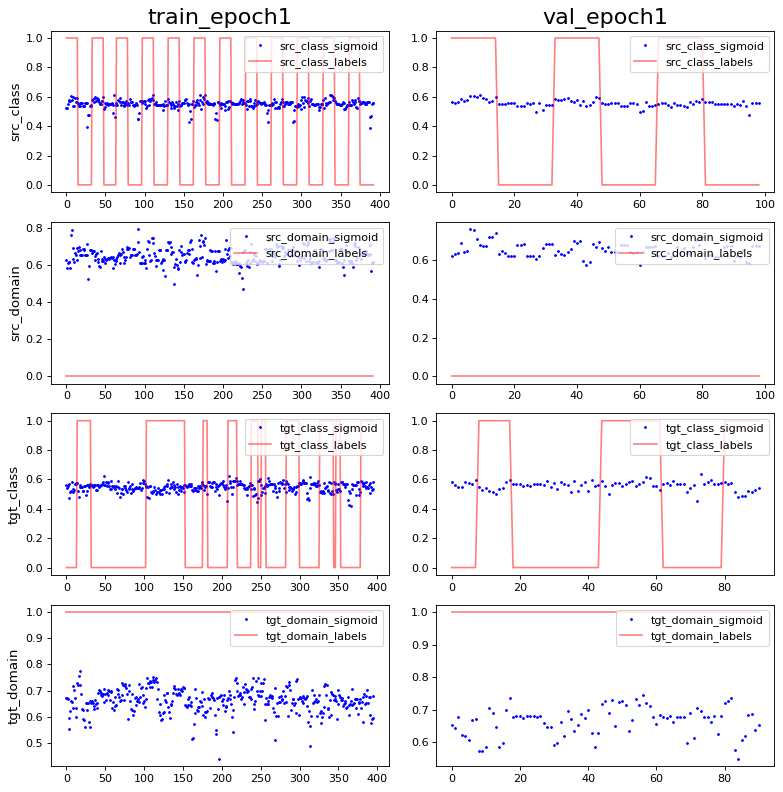

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/source/
show standardize mean and std: -8.058085e-10 0.9895285
PCA var: [28.7      42.2      49.600002 55.7      59.       61.8      64.1
 66.2      67.899994 69.399994]
show standardize mean and std: -1.6731129e-09 0.98952854
PCA var: [32.8 45.  54.2 61.  65.8 68.9 71.6 73.6 75.5 77.3]


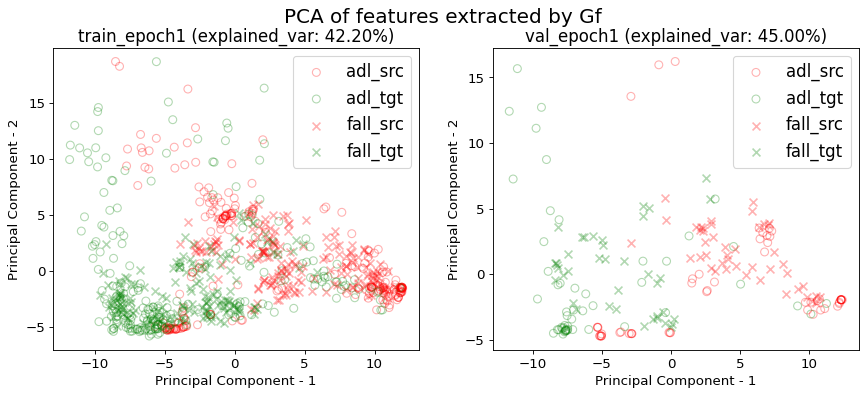

---------------Exporting model performance---------------
show df_performance


,i_CV,train_loss,train_acc,val_loss,val_acc,tgt_val_loss,tgt_val_acc
0,0.000000,0.168801,0.635443,0.007003,0.597938,0.004160,0.439560
1,1.000000,0.168002,0.633588,0.006426,0.868687,0.007766,0.582418
mean,0.500000,0.168401,0.634515,0.006715,0.733313,0.005963,0.510989
std,0.707107,0.000565,0.001312,0.000408,0.191448,0.002550,0.101015


src val loss: 0.0067±0.0004
src val acc: 0.7333±0.1914
tgt val loss: 0.0060±0.0025
tgt val acc: 0.5110±0.1010
--------------Exporting notebook parameters--------------
{'CV_n': 2, 'samples_n': 492, 'classes_n': 2, 'model_name': 'DannModel', 'dataset_name': 'UPFall', 'num_epochs': 2, 'channel_n': 4, 'batch_size': 4, 'learning_rate': 0.0001, 'sensor_loc': 'rightpocket', 'date': '2020/04/11 22:01:04', 'input_dim': (4, 3, 66), 'output_dim': (4,)}

======================  train on target, val on target(source=UPFall_rightpocket to target=UMAFall_leg)  ======================

------------------------------Working on i_CV 0------------------------------
Working on get_UMAFall_loader...
train_data shape: (305, 3, 66)
val_data shape: (182, 3, 66)
Working on get_UPFall_loader...
train_data shape: (395, 3, 66)
val_data shape: (97, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage

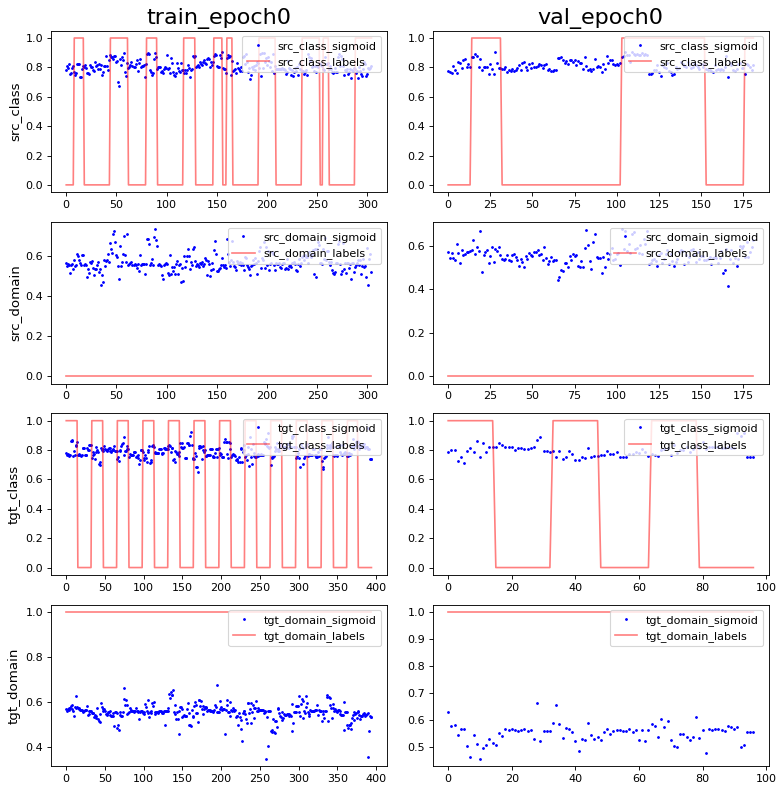

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/target/
show standardize mean and std: 1.211015e-09 0.98952854
PCA var: [23.5      38.       47.       54.5      59.3      63.5      66.2
 68.2      69.899994 71.299995]
show standardize mean and std: 0.0 0.98952854
PCA var: [17.5      30.900002 40.9      47.4      52.5      56.1      59.3
 61.899998 64.399994 66.59999 ]


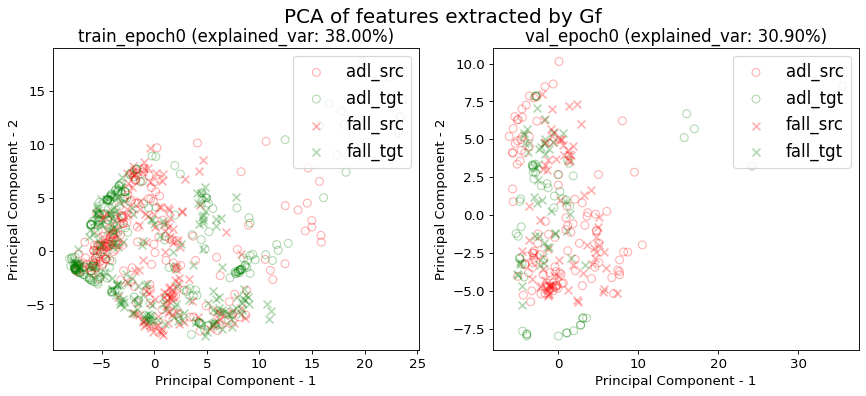

outputdir for baseline_learning_diagnosis output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/target/


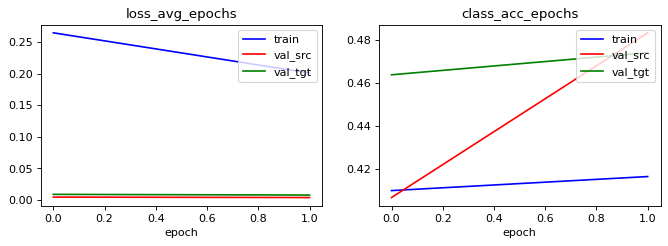

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/target/
acc performance: 0.43934426229508194 0.6852459016393443 0.5901639344262295 0.639344262295082
acc performance: 0.4835164835164835 0.6978021978021978 0.25274725274725274 0.43956043956043955


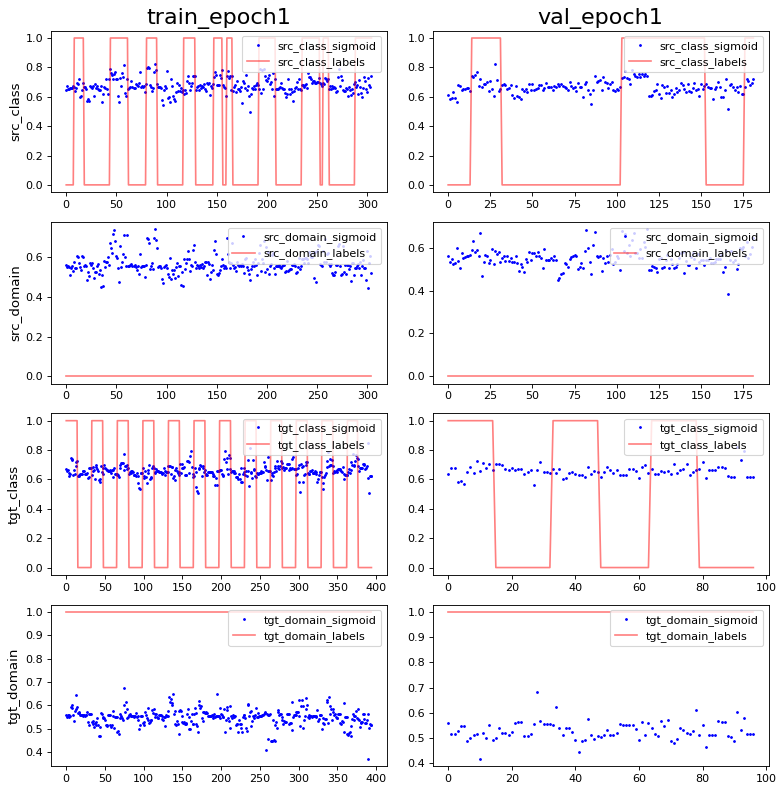

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/target/
show standardize mean and std: 3.784422e-09 0.9860133
PCA var: [25.5      39.9      48.800003 56.200005 61.600006 65.100006 67.90001
 69.80001  71.40001  72.80001 ]
show standardize mean and std: 3.0383889e-09 0.98952854
PCA var: [24.699999 40.5      48.4      54.4      59.300003 62.700005 65.600006
 67.90001  70.00001  71.80001 ]


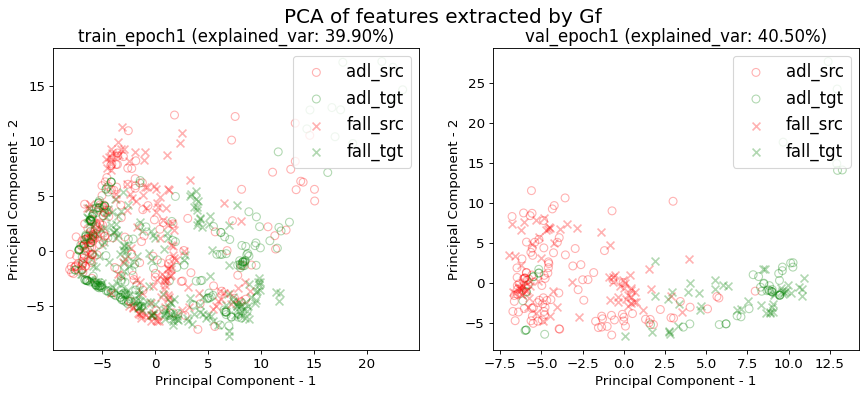

------------------------------Working on i_CV 1------------------------------
Working on get_UMAFall_loader...
train_data shape: (396, 3, 66)
val_data shape: (91, 3, 66)
Working on get_UPFall_loader...
train_data shape: (393, 3, 66)
val_data shape: (99, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/target/
acc performance: 0.3888888888888889 0.5303030303030303 0.3888888888888889 0.5
acc performance: 0.24175824175824176 0.4945054945054945 0.43956043956043955 0.4065934065934066


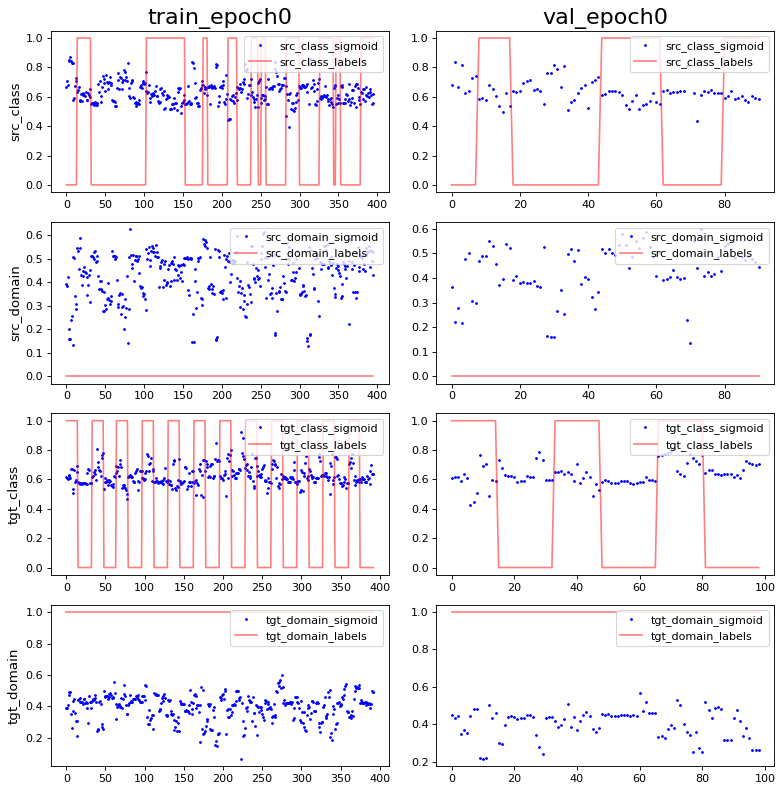

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/target/
show standardize mean and std: 2.6860283e-10 0.9965218
PCA var: [33.399998 45.199997 55.699997 61.399998 66.1      69.       71.2
 72.899994 74.49999  75.99999 ]
show standardize mean and std: -5.577043e-09 0.9965218
PCA var: [34.       47.8      59.1      65.       69.9      72.700005 75.100006
 77.200005 79.100006 80.50001 ]


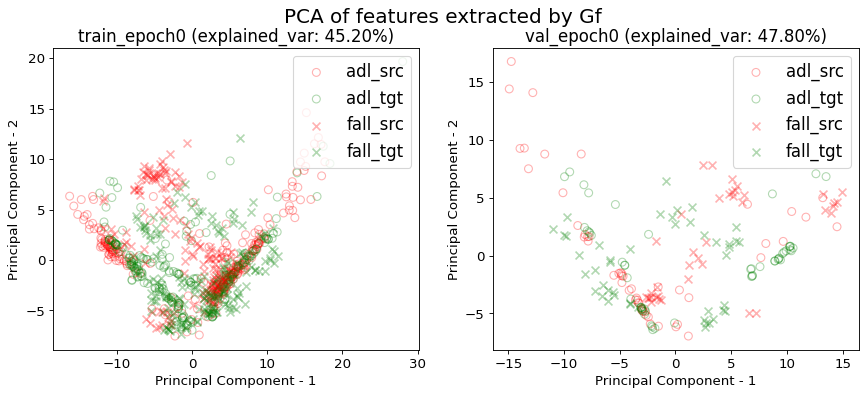

outputdir for baseline_learning_diagnosis output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/target/


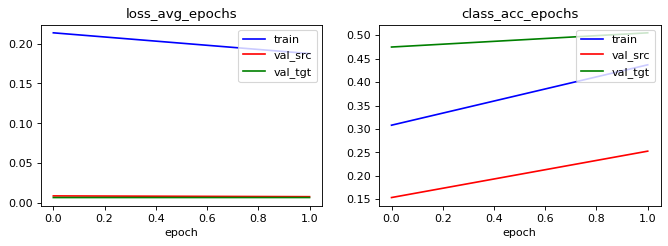

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/target/
acc performance: 0.48484848484848486 0.45454545454545453 0.4595959595959596 0.2828282828282828
acc performance: 0.25274725274725274 0.42857142857142855 0.5494505494505495 0.27472527472527475


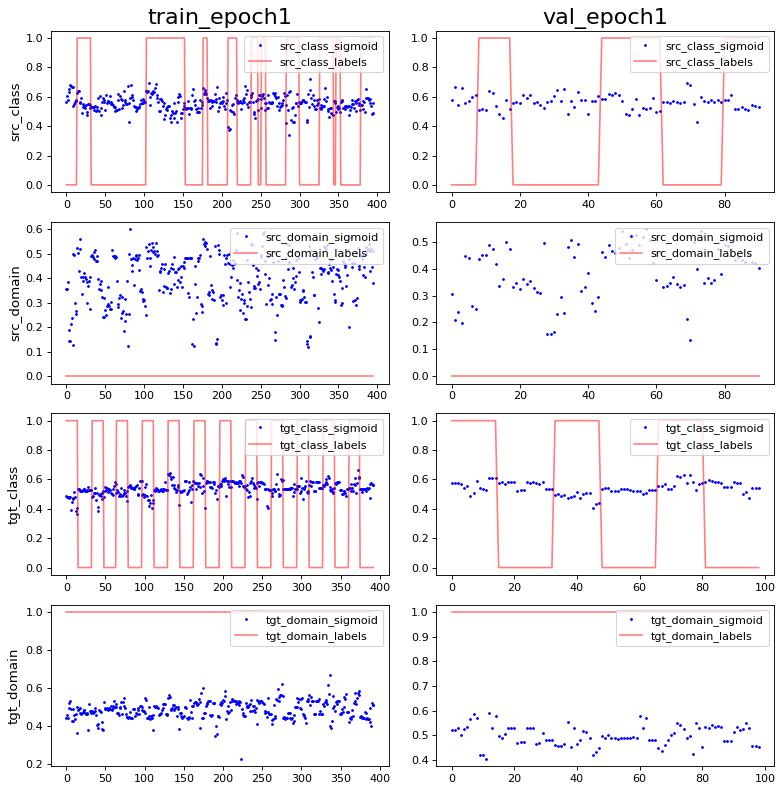

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/target/
show standardize mean and std: 4.2976454e-09 1.0
PCA var: [37.2      51.7      61.2      66.2      68.899994 71.09999  72.99999
 74.799995 76.399994 77.99999 ]
show standardize mean and std: 0.0 0.9965218
PCA var: [39.5      56.199997 66.       71.5      75.2      77.899994 79.899994
 81.7      83.399994 84.799995]


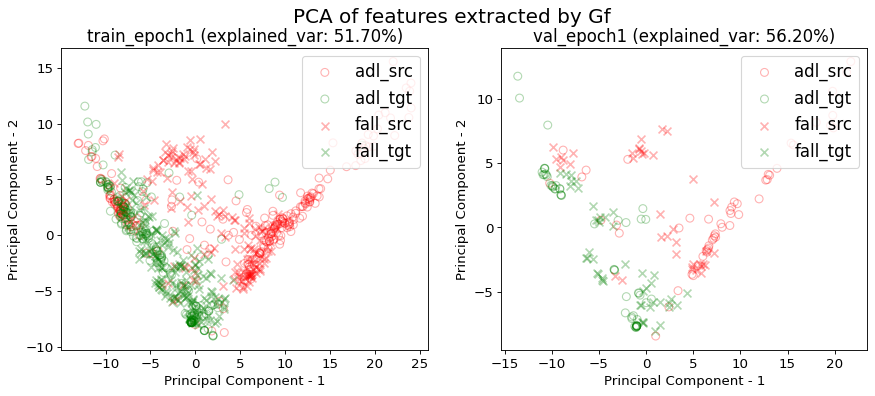

---------------Exporting model performance---------------
show df_performance


,i_CV,train_loss,train_acc,val_loss,val_acc,tgt_val_loss,tgt_val_acc
0,0.000000,0.201125,0.416393,0.003926,0.483516,0.007866,0.474227
1,1.000000,0.187445,0.436869,0.008244,0.252747,0.007190,0.505051
mean,0.500000,0.194285,0.426631,0.006085,0.368132,0.007528,0.489639
std,0.707107,0.009673,0.014478,0.003053,0.163178,0.000478,0.021796


src val loss: 0.0061±0.0031
src val acc: 0.3681±0.1632
tgt val loss: 0.0075±0.0005
tgt val acc: 0.4896±0.0218
--------------Exporting notebook parameters--------------
{'CV_n': 2, 'samples_n': 487, 'classes_n': 2, 'model_name': 'DannModel', 'dataset_name': 'UMAFall', 'num_epochs': 2, 'channel_n': 4, 'batch_size': 4, 'learning_rate': 0.0001, 'sensor_loc': 'leg', 'date': '2020/04/11 22:01:21', 'input_dim': (4, 3, 66), 'output_dim': (4,)}

======================  DANN training transferring knowledge(source=UPFall_rightpocket to target=UMAFall_leg)  ======================

------------------------------Working on i_CV 0------------------------------
Working on get_UPFall_loader...
train_data shape: (395, 3, 66)
val_data shape: (97, 3, 66)
Working on get_UMAFall_loader...
train_data shape: (305, 3, 66)
val_data shape: (182, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2

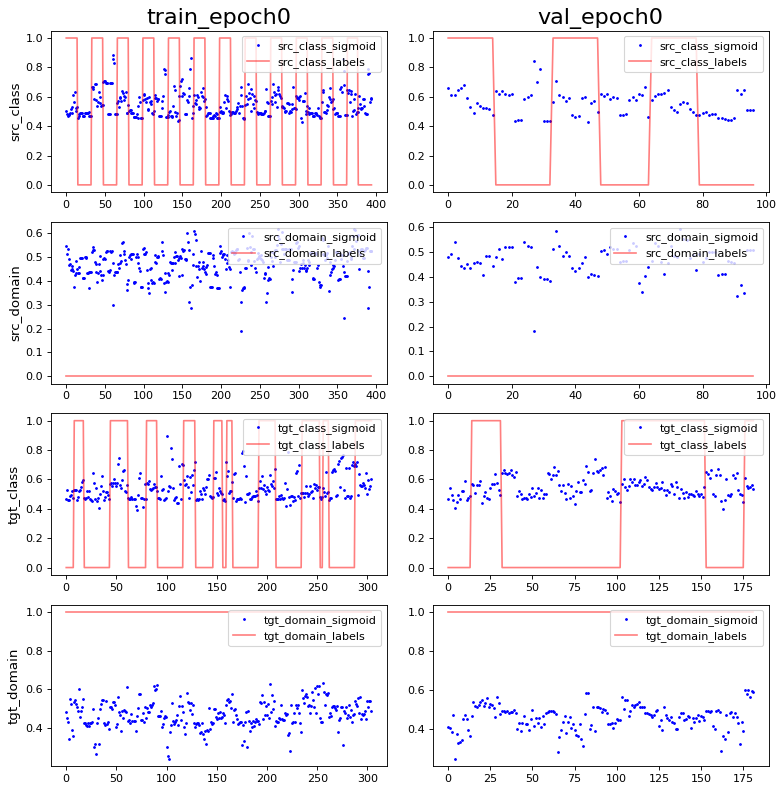

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/dann/
show standardize mean and std: -1.211015e-09 0.9965218
PCA var: [23.1      37.6      46.899998 53.6      58.899998 63.3      66.
 68.2      70.2      71.899994]
show standardize mean and std: 1.898993e-09 0.9965218
PCA var: [22.1      36.1      45.8      54.199997 59.299995 62.699997 65.399994
 67.799995 69.899994 71.899994]


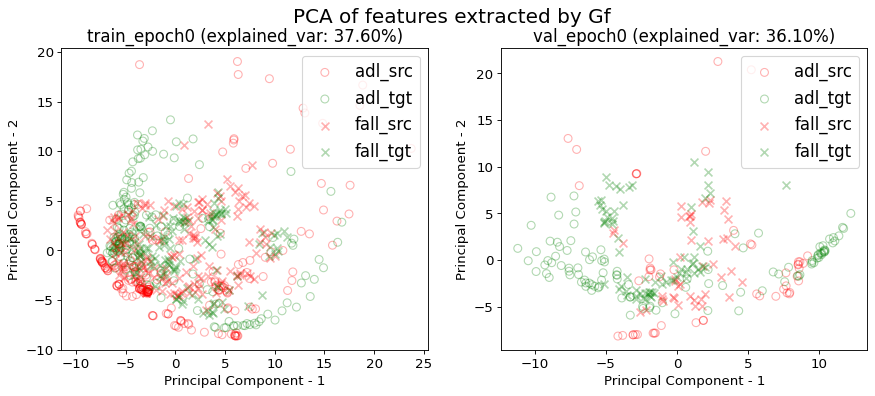

outputdir for dann_learning_diagnosis output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/dann/


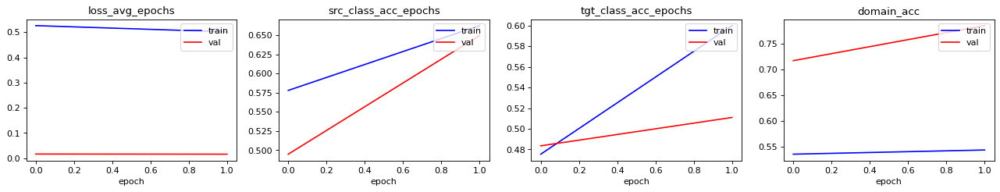

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/dann/
acc performance: 0.759493670886076 0.7417721518987341 0.5645569620253165 0.5594936708860759
acc performance: 0.6494845360824743 0.7731958762886598 0.9587628865979382 1.4845360824742269


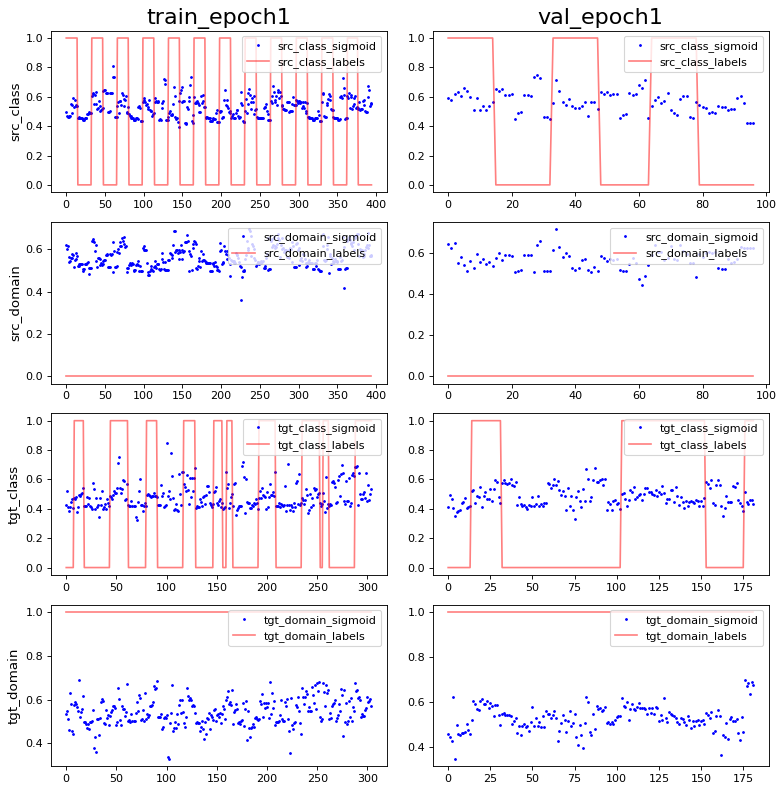

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/dann/
show standardize mean and std: 8.477105e-09 0.9965218
PCA var: [27.4      43.6      53.6      59.899998 65.1      68.9      71.200005
 73.100006 74.8      76.3     ]
show standardize mean and std: 4.557583e-09 0.99303126
PCA var: [35.5      49.4      57.300003 62.800003 66.5      70.       72.3
 74.5      76.2      77.899994]


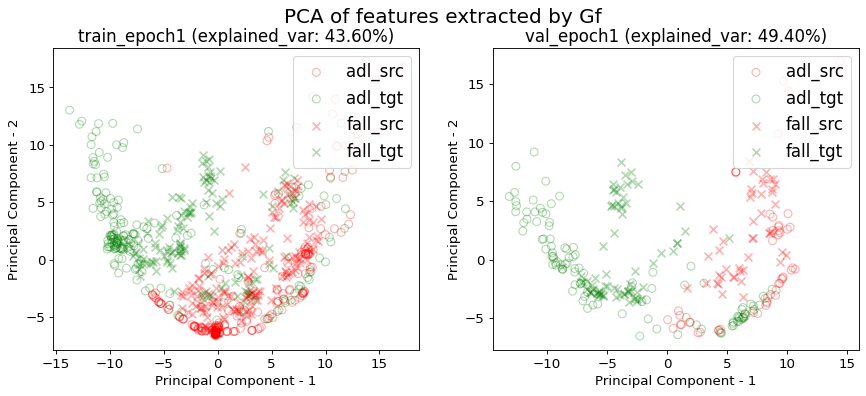

------------------------------Working on i_CV 1------------------------------
Working on get_UPFall_loader...
train_data shape: (393, 3, 66)
val_data shape: (99, 3, 66)
Working on get_UMAFall_loader...
train_data shape: (396, 3, 66)
val_data shape: (91, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/dann/
acc performance: 0.5826972010178118 0.0 0.4529262086513995 1.005089058524173
acc performance: 0.4444444444444444 0.0 0.3838383838383838 0.9191919191919192


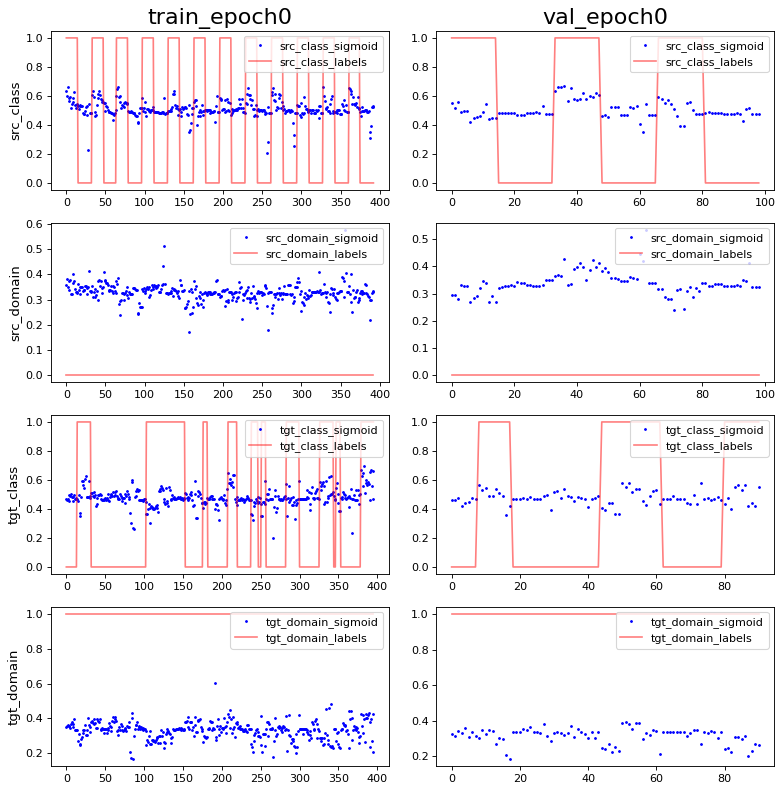

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/dann/
show standardize mean and std: -4.2976454e-09 0.9965217
PCA var: [34.       47.1      54.199997 59.1      62.8      65.8      68.3
 70.700005 73.00001  74.90001 ]
show standardize mean and std: 3.3462257e-09 0.9930313
PCA var: [36.       51.9      62.800003 69.4      73.9      77.4      79.5
 81.6      83.299995 84.7     ]


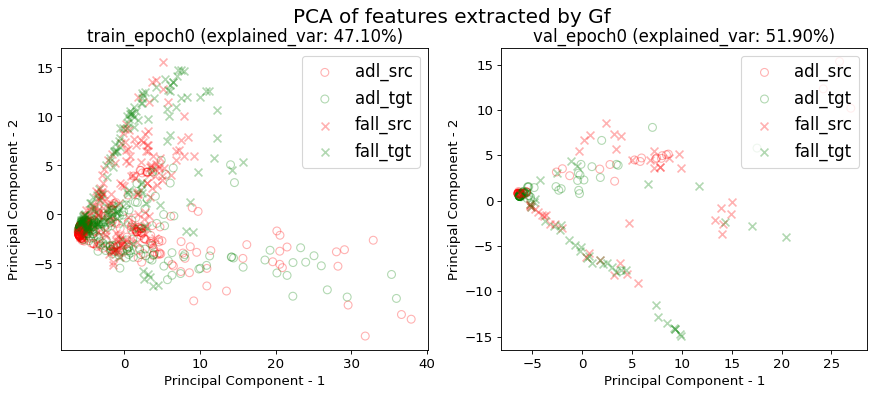

outputdir for dann_learning_diagnosis output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/dann/


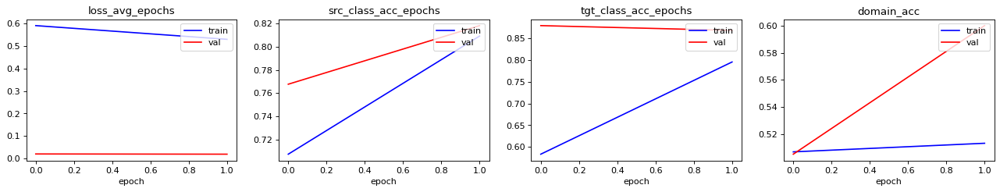

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/dann/
acc performance: 0.8575063613231552 0.43765903307888043 0.811704834605598 0.8676844783715013
acc performance: 0.8181818181818182 0.31313131313131315 0.797979797979798 0.8383838383838383


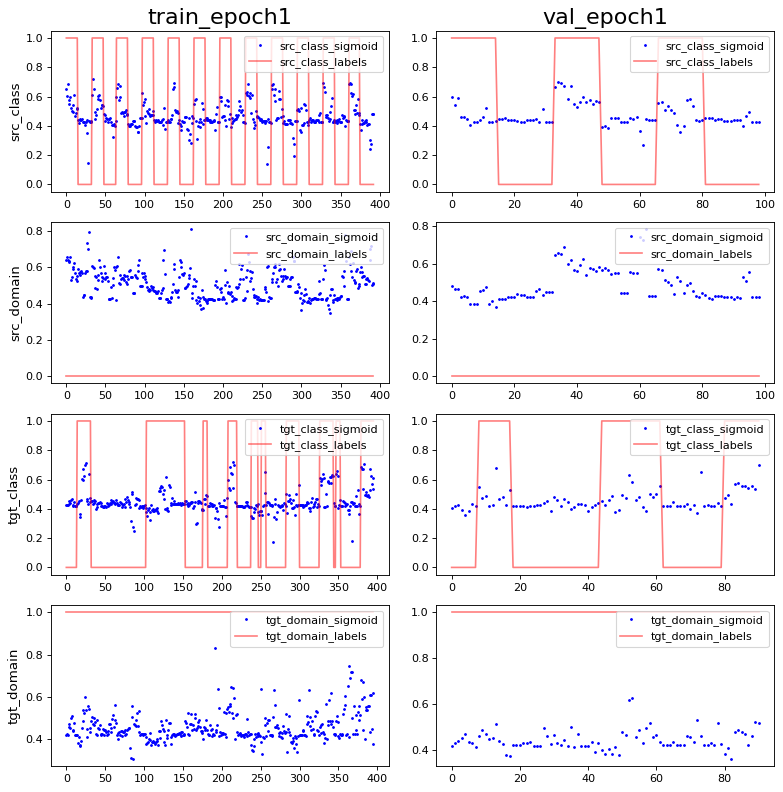

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/dann/
show standardize mean and std: -8.595291e-09 0.9965218
PCA var: [38.4      50.600002 57.600002 62.100002 66.100006 68.8      71.100006
 73.3      75.200005 76.600006]
show standardize mean and std: 3.3462257e-09 0.9965218
PCA var: [35.2      50.5      60.6      67.299995 71.899994 75.49999  77.69999
 79.69999  81.49999  83.19999 ]


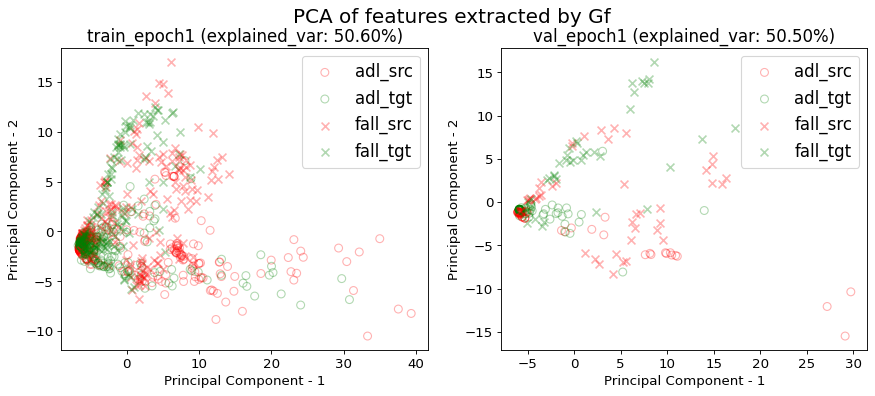

---------------Exporting model performance---------------
show df_performance


,i_CV,train_src_class_loss,train_tgt_class_loss,train_src_domain_loss,train_tgt_domain_loss,train_src_class_acc,train_tgt_class_acc,train_domain_acc,val_src_class_loss,val_tgt_class_loss,val_src_domain_loss,val_tgt_domain_loss,val_src_class_acc,val_tgt_class_acc,val_domain_acc
0,0.000000,0.151159,0.163340,0.198365,0.152152,0.662338,0.600000,0.543230,0.006498,0.003893,0.006468,0.003034,0.649485,0.510989,0.784946
1,1.000000,0.150779,0.149076,0.250803,0.127571,0.809160,0.795455,0.513308,0.005932,0.006194,0.008349,0.005437,0.818182,0.868132,0.600000
mean,0.500000,0.150969,0.156208,0.224584,0.139862,0.735749,0.697727,0.528269,0.006215,0.005043,0.007409,0.004236,0.733833,0.689560,0.692473
std,0.707107,0.000269,0.010086,0.037079,0.017381,0.103819,0.138207,0.021158,0.000400,0.001627,0.001330,0.001699,0.119287,0.252538,0.130777


val_src_class_acc: 0.7338±0.1193
val_tgt_class_acc: 0.6896±0.2525
val_domain_acc: 0.6925±0.1308
--------------Exporting notebook parameters--------------
{'CV_n': 2, 'samples_n': 492, 'classes_n': 2, 'model_name': 'DannModel', 'src_dataset_name': 'UPFall', 'tgt_dataset_name': 'UMAFall', 'src_sensor_loc': 'rightpocket', 'tgt_sensor_loc': 'leg', 'date': '2020/04/11 22:01:43', 'num_epochs': 2, 'channel_n': 4, 'batch_size': 4, 'learning_rate': 0.0001, 'input_dim': (4, 3, 66), 'output_dim': 2, 'label_dim': (4,)}
val_tgt_class_acc: 0.6896±0.2525
val_domain_acc: 0.6925±0.1308
time elapsed: 00:00:55

======================  train on source, val on target(source=UPFall_rightpocket to target=UMAFall_leg)  ======================

------------------------------Working on i_CV 0------------------------------
Working on get_UPFall_loader...
train_data shape: (395, 3, 66)
val_data shape: (97, 3, 66)
Working on get_UMAFall_loader...
train_data shape: (305, 3, 66)
val_data shape: (182, 3, 66)
FeatureEx

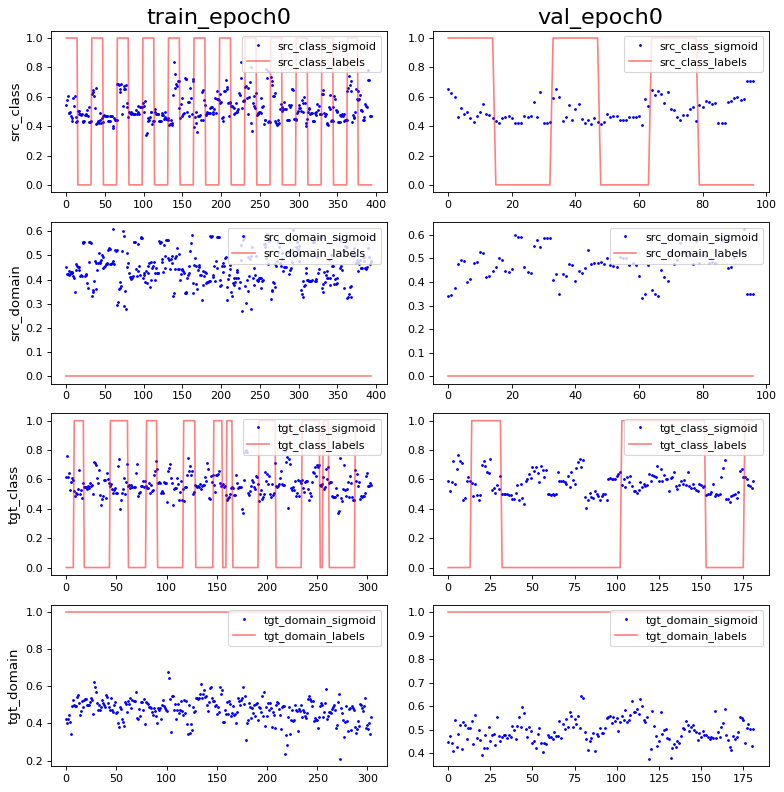

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/source/
show standardize mean and std: -1.4380803e-09 1.0
PCA var: [19.699999 31.5      41.6      49.       54.4      58.600002 61.800003
 64.8      67.5      69.8     ]
show standardize mean and std: 1.5191944e-09 1.0
PCA var: [24.8      37.1      47.3      54.899998 59.3      62.899998 65.799995
 68.299995 70.6      72.5     ]


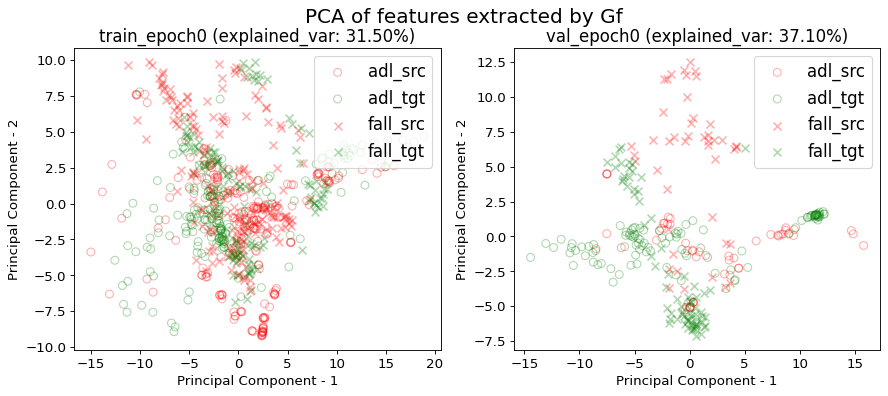

outputdir for baseline_learning_diagnosis output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/source/


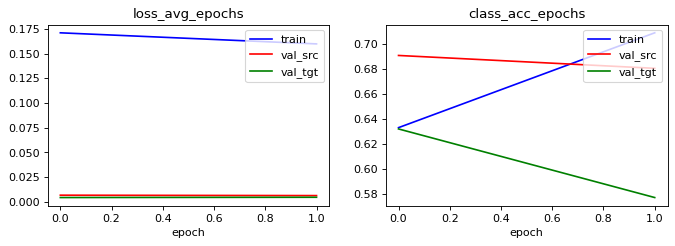

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/source/
acc performance: 0.7012658227848101 0.1291139240506329 0.37468354430379747 0.23291139240506328
acc performance: 0.6804123711340206 0.08247422680412371 1.0824742268041236 0.3917525773195876


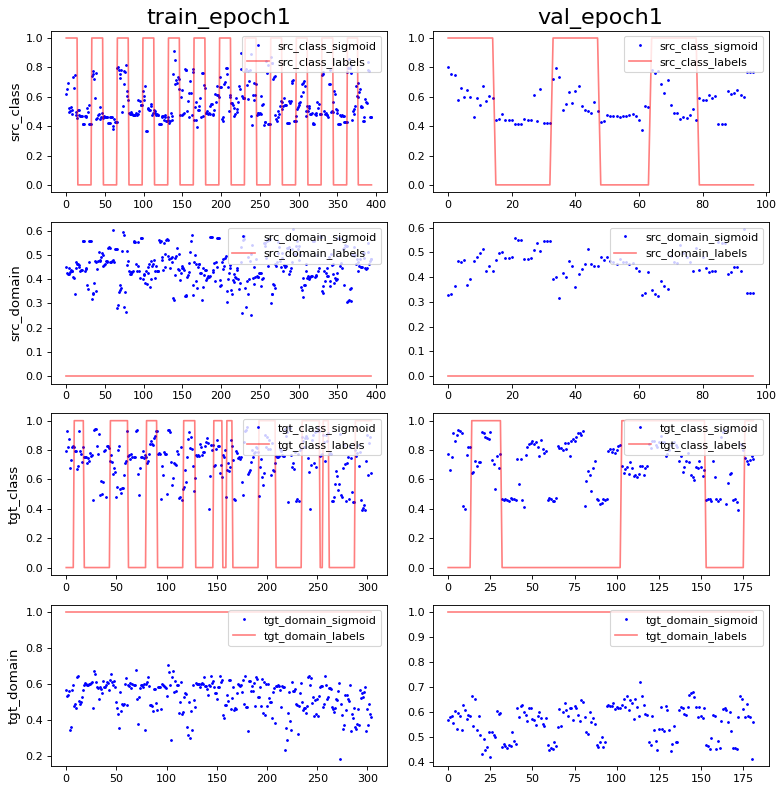

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/source/
show standardize mean and std: 1.8165225e-09 1.0
PCA var: [30.199999 42.199997 51.299995 57.499996 61.999996 65.7      69.2
 71.399994 73.2      74.799995]
show standardize mean and std: -1.5191944e-09 1.0
PCA var: [35.3      47.4      55.600002 61.500004 66.100006 70.50001  73.40001
 75.80001  77.40001  79.00001 ]


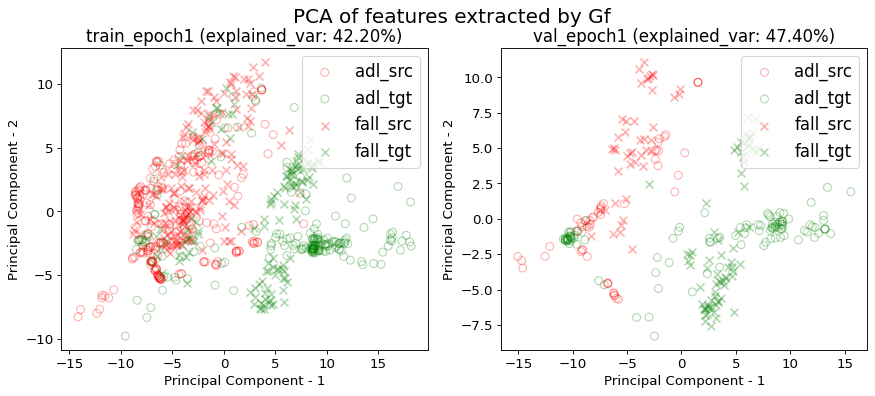

------------------------------Working on i_CV 1------------------------------
Working on get_UPFall_loader...
train_data shape: (393, 3, 66)
val_data shape: (99, 3, 66)
Working on get_UMAFall_loader...
train_data shape: (396, 3, 66)
val_data shape: (91, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/source/
acc performance: 0.6666666666666666 0.7404580152671756 0.8015267175572519 0.21882951653944022
acc performance: 0.5959595959595959 0.6464646464646465 0.7474747474747475 0.1414141414141414


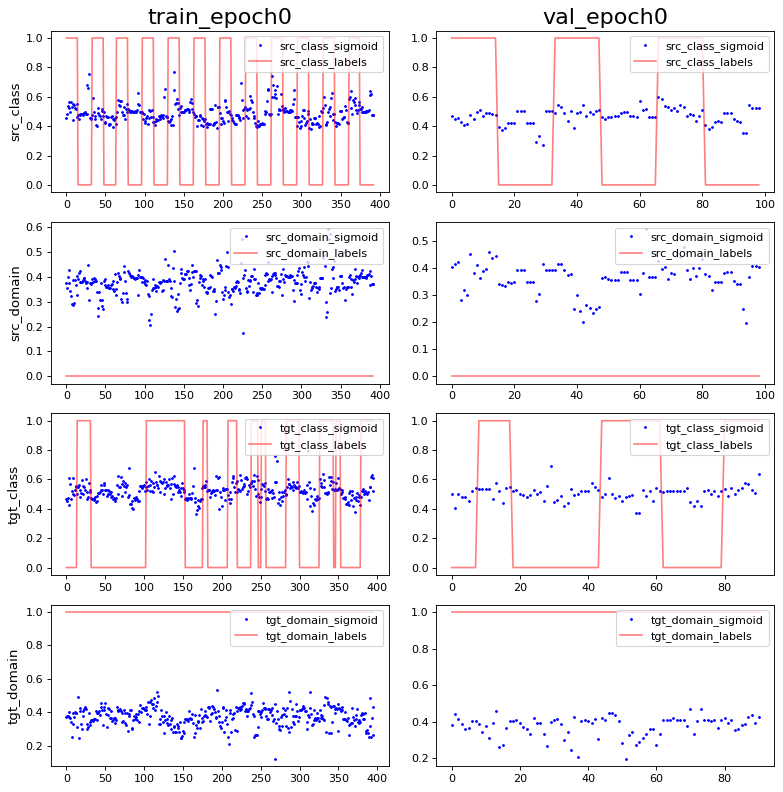

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/source/
show standardize mean and std: -1.3430141e-09 0.9895285
PCA var: [22.1 37.3 45.8 52.9 57.5 60.7 63.4 65.5 67.6 69.2]
show standardize mean and std: 0.0 0.98952854
PCA var: [25.5      40.1      48.899998 54.3      58.8      62.7      66.4
 69.700005 72.00001  74.00001 ]


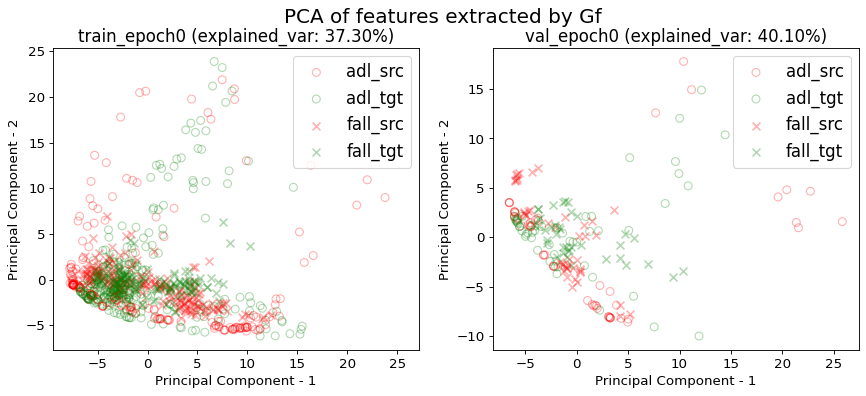

outputdir for baseline_learning_diagnosis output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/source/


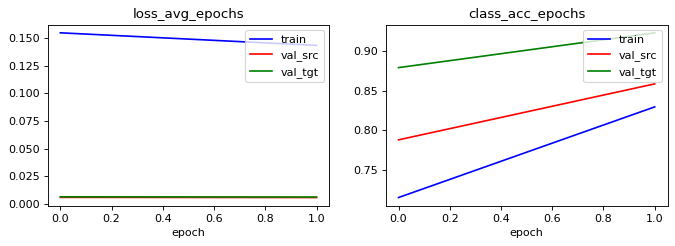

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/source/
acc performance: 0.8295165394402035 0.7022900763358778 0.8676844783715013 0.26463104325699743
acc performance: 0.8585858585858586 0.6767676767676768 0.8484848484848485 0.1717171717171717


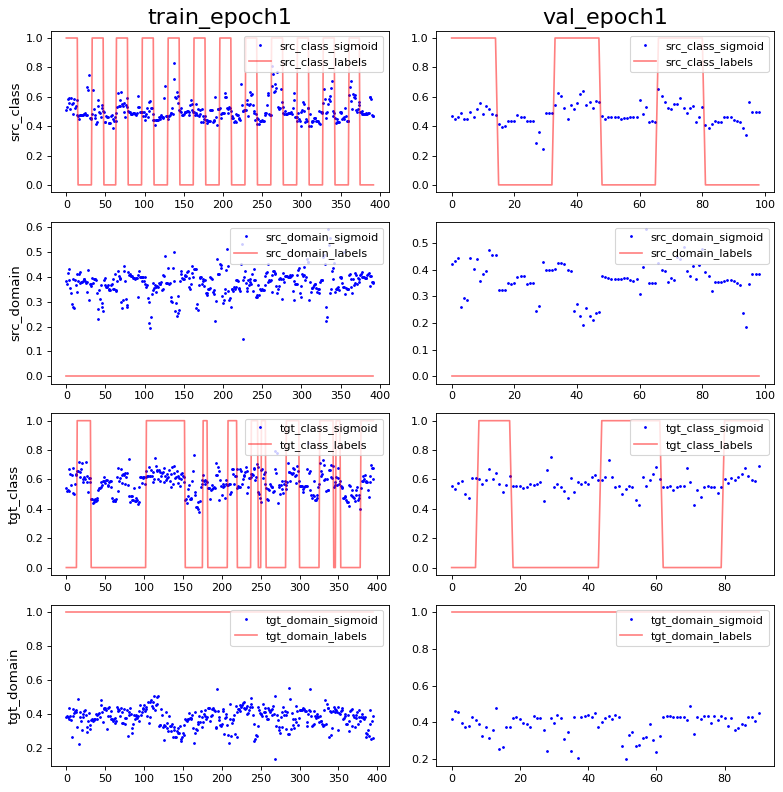

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/source/
show standardize mean and std: -1.0744113e-09 0.9965217
PCA var: [23.199999 38.9      47.9      55.9      60.       62.6      64.9
 67.       68.9      70.6     ]
show standardize mean and std: 2.230817e-09 0.98952854
PCA var: [28.400002 46.5      55.7      62.5      66.4      69.700005 72.700005
 75.4      77.4      79.200005]


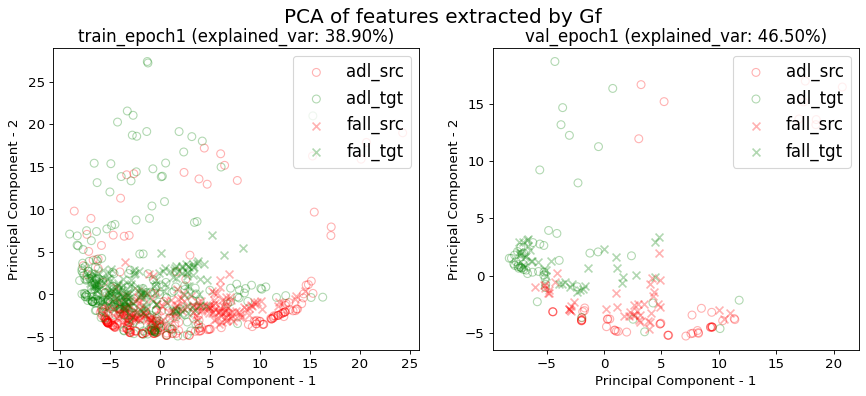

---------------Exporting model performance---------------
show df_performance


,i_CV,train_loss,train_acc,val_loss,val_acc,tgt_val_loss,tgt_val_acc
0,0.000000,0.159879,0.708861,0.006316,0.680412,0.004619,0.576923
1,1.000000,0.143433,0.829517,0.005640,0.858586,0.006089,0.923077
mean,0.500000,0.151656,0.769189,0.005978,0.769499,0.005354,0.750000
std,0.707107,0.011629,0.085317,0.000478,0.125988,0.001040,0.244768


src val loss: 0.0060±0.0005
src val acc: 0.7695±0.1260
tgt val loss: 0.0054±0.0010
tgt val acc: 0.7500±0.2448
--------------Exporting notebook parameters--------------
{'CV_n': 2, 'samples_n': 492, 'classes_n': 2, 'model_name': 'DannModel', 'dataset_name': 'UPFall', 'num_epochs': 2, 'channel_n': 4, 'batch_size': 4, 'learning_rate': 0.0001, 'sensor_loc': 'rightpocket', 'date': '2020/04/11 22:01:59', 'input_dim': (4, 3, 66), 'output_dim': (4,)}

======================  train on target, val on target(source=UPFall_rightpocket to target=UMAFall_leg)  ======================

------------------------------Working on i_CV 0------------------------------
Working on get_UMAFall_loader...
train_data shape: (305, 3, 66)
val_data shape: (182, 3, 66)
Working on get_UPFall_loader...
train_data shape: (395, 3, 66)
val_data shape: (97, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage

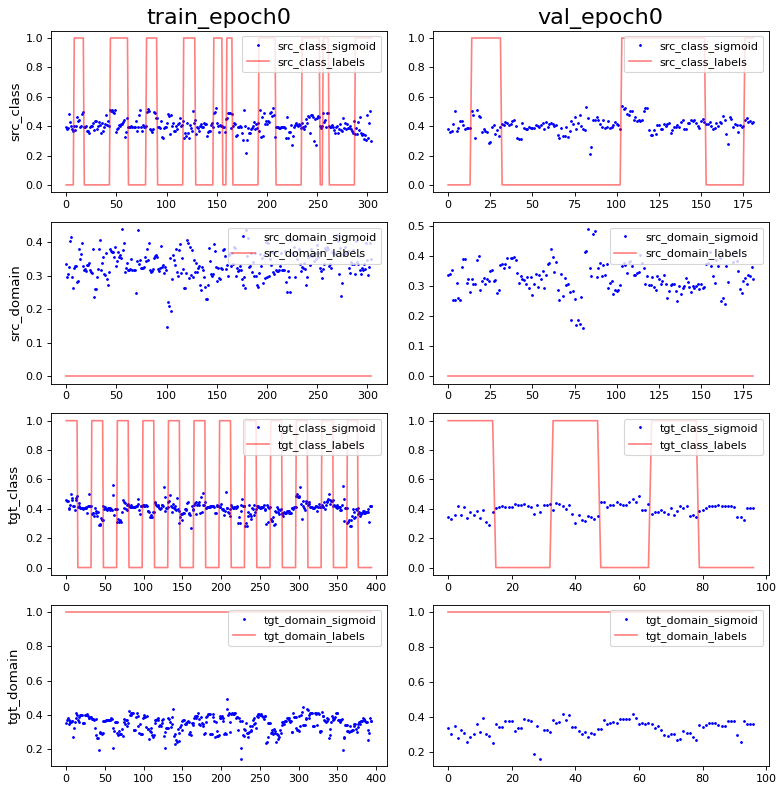

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/target/
show standardize mean and std: 2.7247837e-09 0.9930313
PCA var: [27.5      44.4      52.600002 59.9      65.1      68.       70.4
 72.1      73.7      75.1     ]
show standardize mean and std: 1.5191944e-09 0.99303126
PCA var: [21.199999 40.899998 49.8      56.       60.9      64.200005 67.00001
 69.40001  71.50001  73.600006]


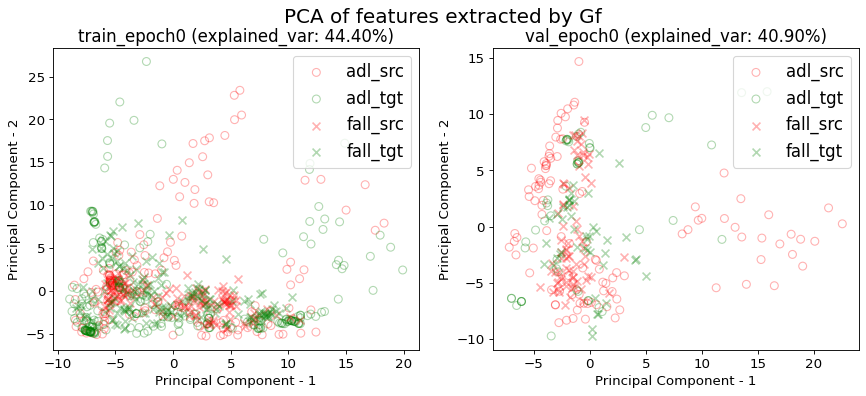

outputdir for baseline_learning_diagnosis output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/target/


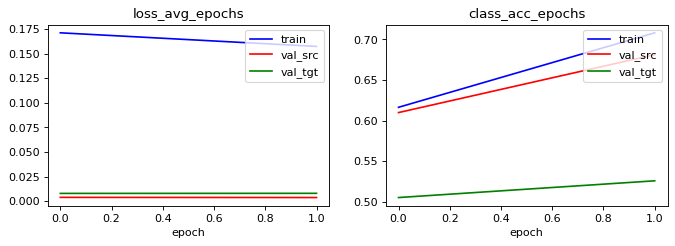

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/target/
acc performance: 0.7245901639344262 0.19672131147540983 0.7540983606557377 0.8131147540983606
acc performance: 0.6813186813186813 0.17582417582417584 0.2802197802197802 0.38461538461538464


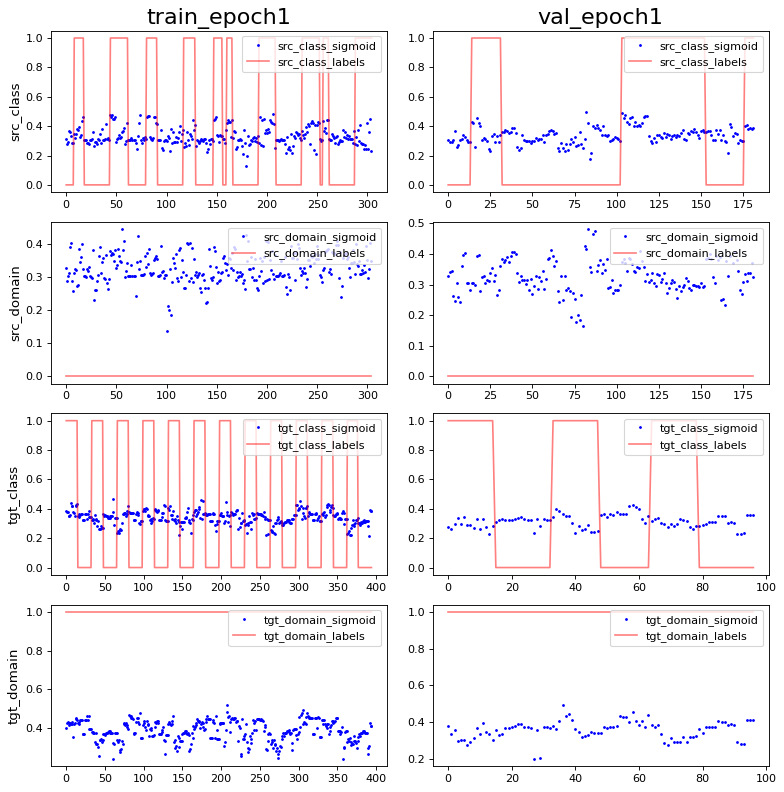

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/target/
show standardize mean and std: -9.082613e-09 0.9965218
PCA var: [26.300001 46.2      55.7      63.3      66.8      69.100006 71.3
 72.9      74.3      75.600006]
show standardize mean and std: -3.0383889e-09 0.9930312
PCA var: [29.800001 48.9      57.300003 62.500004 66.5      69.3      71.4
 73.4      75.200005 76.600006]


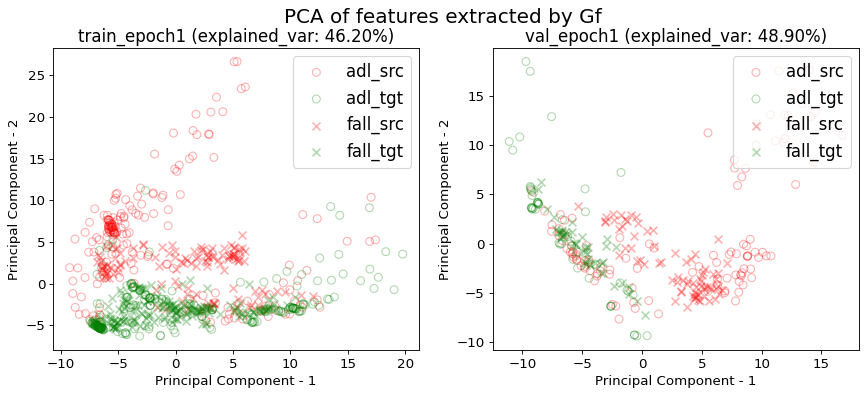

------------------------------Working on i_CV 1------------------------------
Working on get_UMAFall_loader...
train_data shape: (396, 3, 66)
val_data shape: (91, 3, 66)
Working on get_UPFall_loader...
train_data shape: (393, 3, 66)
val_data shape: (99, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/target/
acc performance: 0.5984848484848485 0.5050505050505051 0.5404040404040404 0.3282828282828283
acc performance: 0.5604395604395604 0.43956043956043955 0.5934065934065934 0.34065934065934067


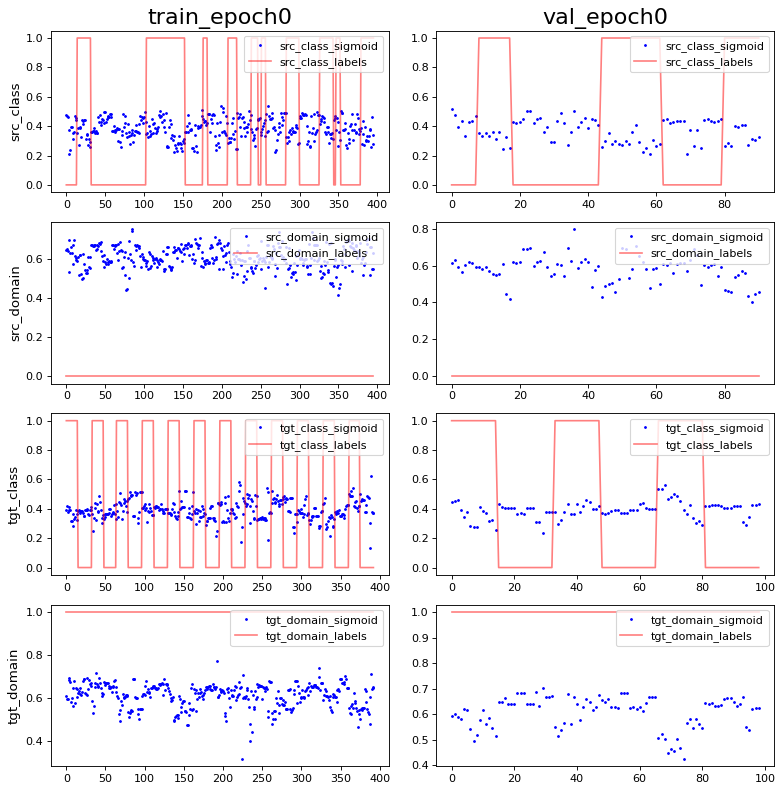

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/target/
show standardize mean and std: 1.611617e-09 0.9965218
PCA var: [21.199999 38.1      46.5      53.6      58.6      62.3      65.4
 68.       70.1      72.      ]
show standardize mean and std: -2.230817e-09 0.9965218
PCA var: [22.8      39.9      48.9      56.4      63.300003 68.3      72.3
 74.9      77.1      79.2     ]


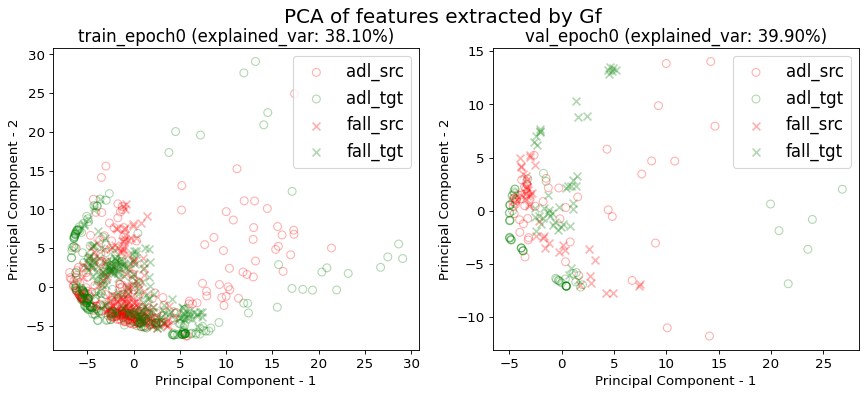

outputdir for baseline_learning_diagnosis output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/target/


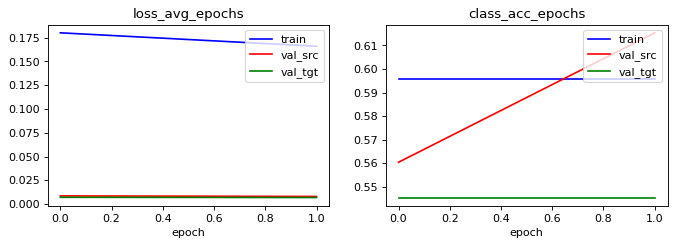

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/target/
acc performance: 0.648989898989899 0.4393939393939394 0.5580808080808081 0.29545454545454547
acc performance: 0.6153846153846154 0.2087912087912088 0.5934065934065934 0.18681318681318682


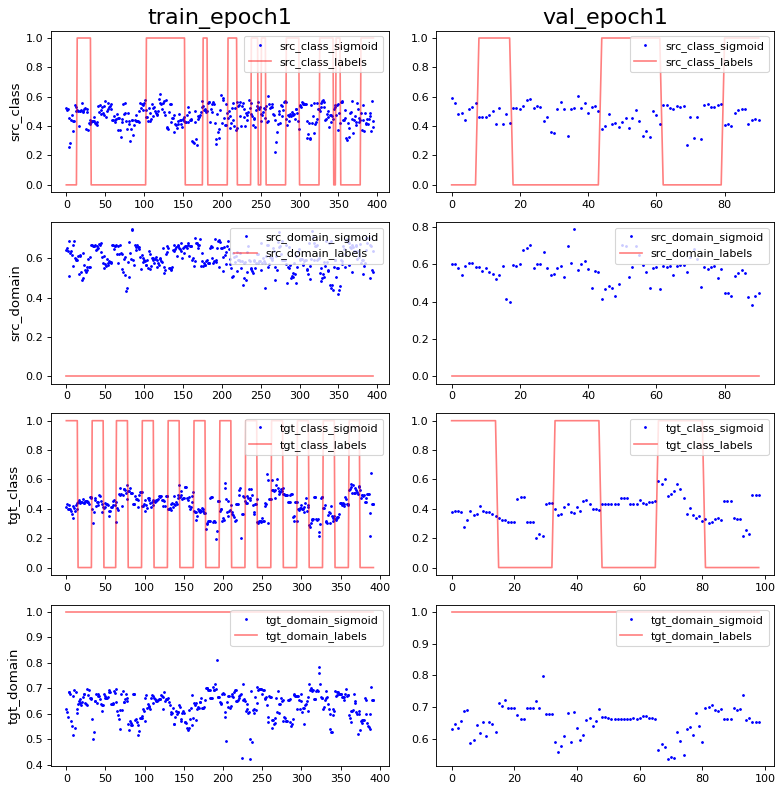

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/target/
show standardize mean and std: 1.3430141e-09 0.9965218
PCA var: [22.300001 42.6      51.1      58.6      62.6      65.7      68.6
 71.2      73.2      74.899994]
show standardize mean and std: -3.3462257e-09 0.9965218
PCA var: [29.300001 47.5      56.       64.       69.3      73.5      76.8
 79.200005 81.00001  82.600006]


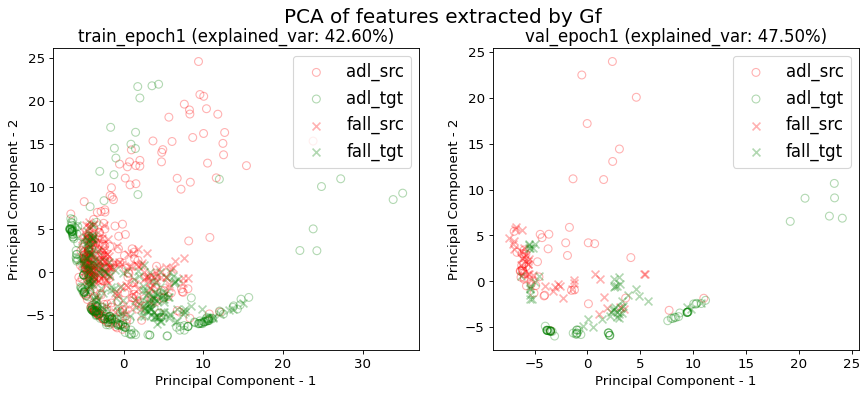

---------------Exporting model performance---------------
show df_performance


,i_CV,train_loss,train_acc,val_loss,val_acc,tgt_val_loss,tgt_val_acc
0,0.000000,0.157530,0.708197,0.003567,0.681319,0.007862,0.525773
1,1.000000,0.166000,0.595960,0.008030,0.615385,0.006880,0.545455
mean,0.500000,0.161765,0.652078,0.005799,0.648352,0.007371,0.535614
std,0.707107,0.005989,0.079364,0.003156,0.046622,0.000694,0.013917


src val loss: 0.0058±0.0032
src val acc: 0.6484±0.0466
tgt val loss: 0.0074±0.0007
tgt val acc: 0.5356±0.0139
--------------Exporting notebook parameters--------------
{'CV_n': 2, 'samples_n': 487, 'classes_n': 2, 'model_name': 'DannModel', 'dataset_name': 'UMAFall', 'num_epochs': 2, 'channel_n': 4, 'batch_size': 4, 'learning_rate': 0.0001, 'sensor_loc': 'leg', 'date': '2020/04/11 22:02:15', 'input_dim': (4, 3, 66), 'output_dim': (4,)}

======================  DANN training transferring knowledge(source=UPFall_rightpocket to target=UMAFall_leg)  ======================

------------------------------Working on i_CV 0------------------------------
Working on get_UPFall_loader...
train_data shape: (395, 3, 66)
val_data shape: (97, 3, 66)
Working on get_UMAFall_loader...
train_data shape: (305, 3, 66)
val_data shape: (182, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2

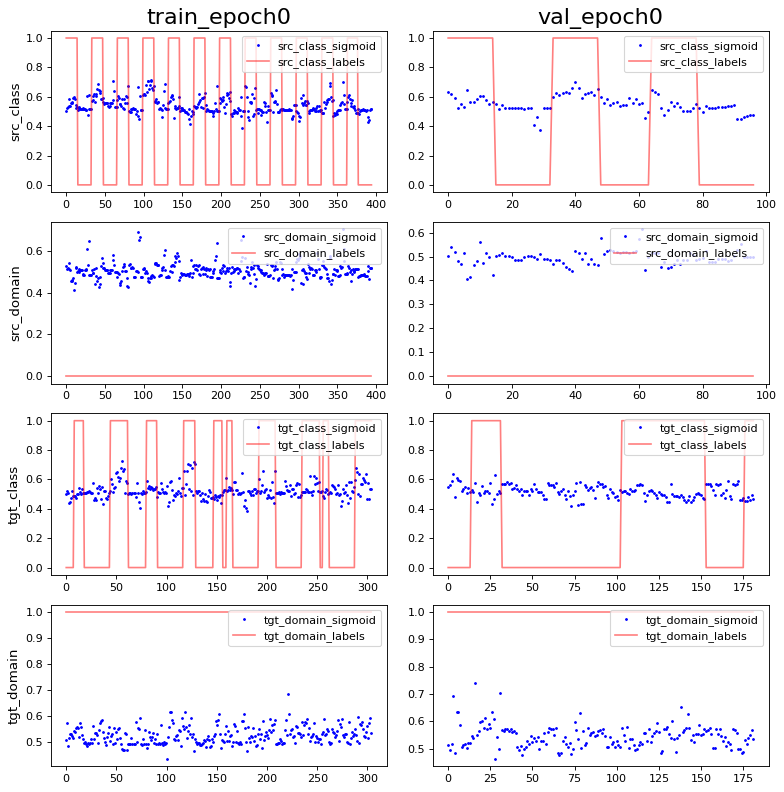

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/dann/
show standardize mean and std: -2.1192763e-09 0.99999994
PCA var: [18.199999 34.899998 41.699997 47.299995 51.599995 54.599995 57.499996
 60.199997 62.6      64.5     ]
show standardize mean and std: -1.5191944e-09 1.0
PCA var: [25.9      40.1      48.       54.3      58.2      61.600002 64.4
 66.9      68.9      70.700005]


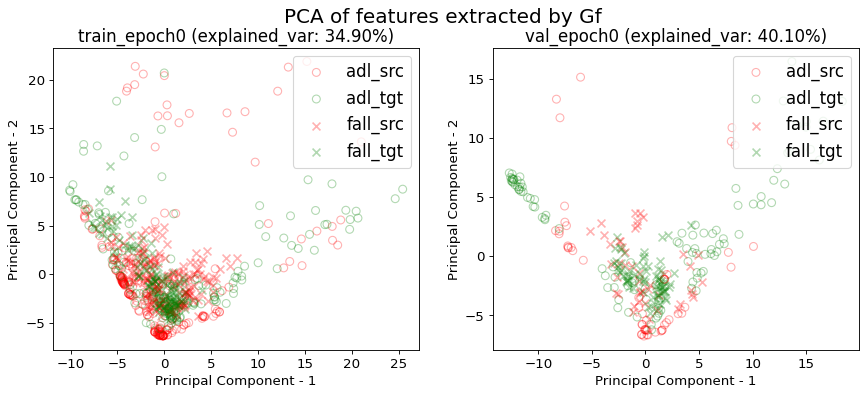

outputdir for dann_learning_diagnosis output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/dann/


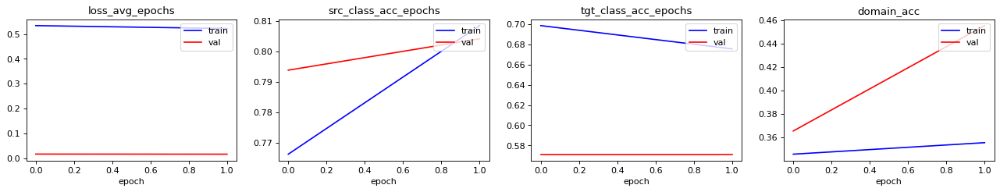

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/dann/
acc performance: 0.7873417721518987 0.529113924050633 0.5240506329113924 0.46582278481012657
acc performance: 0.8041237113402062 0.29896907216494845 1.0721649484536082 1.0103092783505154


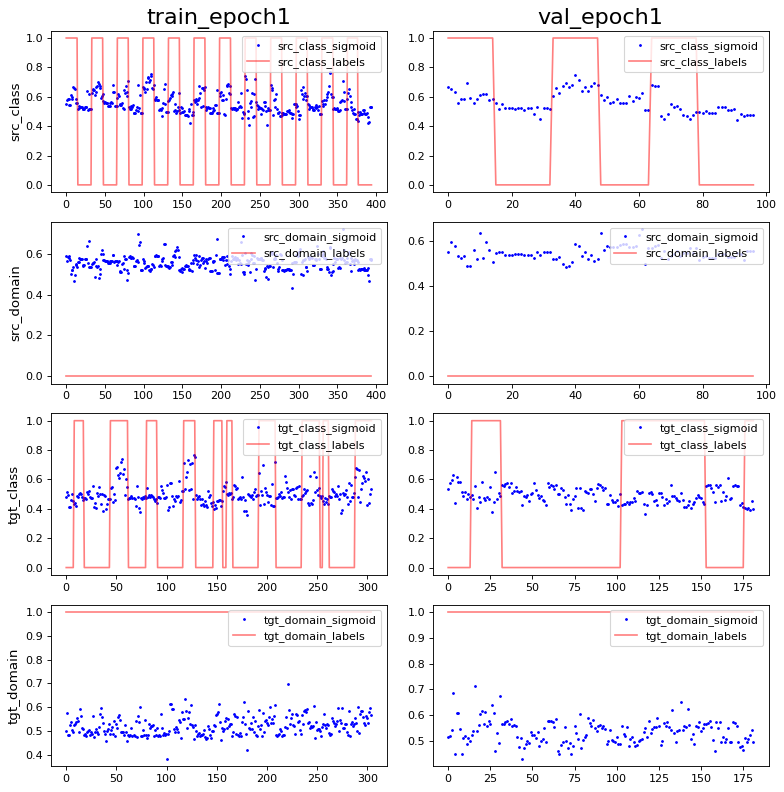

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/dann/
show standardize mean and std: 1.5894572e-09 0.99999994
PCA var: [28.5      42.6      48.199997 53.299995 57.199997 60.399998 62.999996
 65.299995 67.299995 69.2     ]
show standardize mean and std: 7.595972e-10 0.9965218
PCA var: [35.7      48.2      54.9      60.2      63.600002 66.5      69.1
 71.299995 73.299995 74.899994]


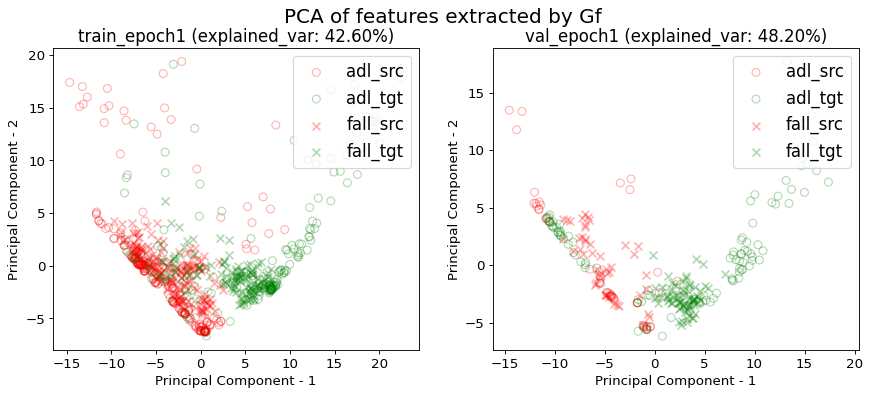

------------------------------Working on i_CV 1------------------------------
Working on get_UPFall_loader...
train_data shape: (393, 3, 66)
val_data shape: (99, 3, 66)
Working on get_UMAFall_loader...
train_data shape: (396, 3, 66)
val_data shape: (91, 3, 66)
FeatureExtractor_total_params: 168
DannModel_total_params: 748
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/dann/
acc performance: 0.4529262086513995 0.6717557251908397 0.4351145038167939 0.47837150127226463
acc performance: 0.45454545454545453 0.6464646464646465 0.3333333333333333 0.5151515151515151


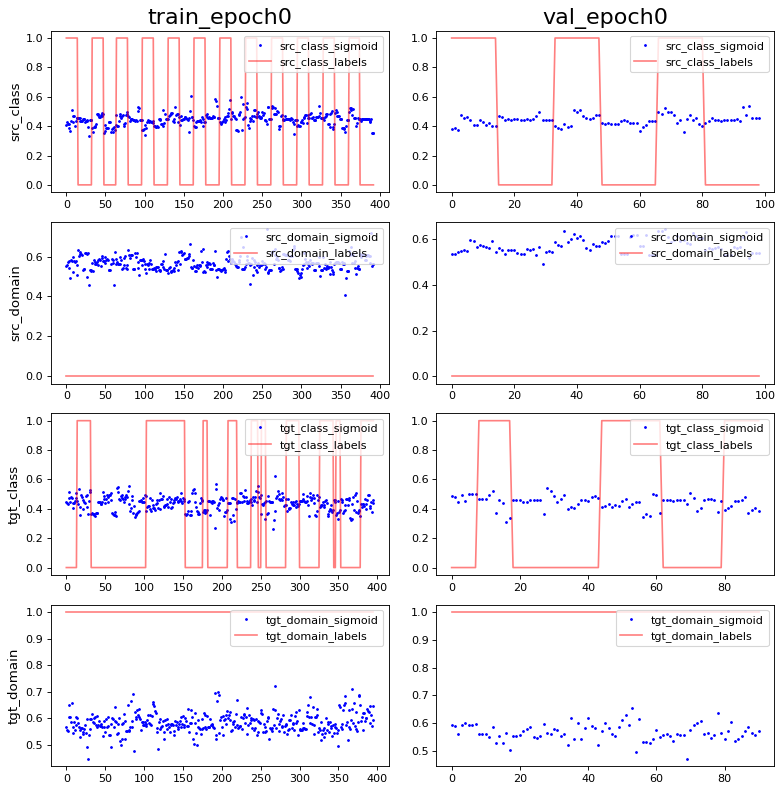

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/dann/
show standardize mean and std: 1.3430141e-09 0.98248553
PCA var: [28.3      44.3      52.6      59.1      64.2      68.       70.1
 71.6      73.1      74.299995]
show standardize mean and std: 8.3655644e-10 0.97894496
PCA var: [30.1 47.9 60.5 67.3 71.8 75.4 78.5 80.2 81.7 83. ]


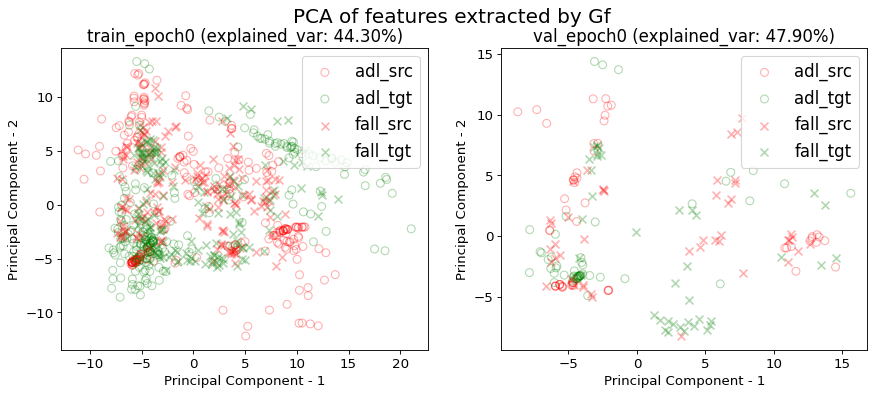

outputdir for dann_learning_diagnosis output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/dann/


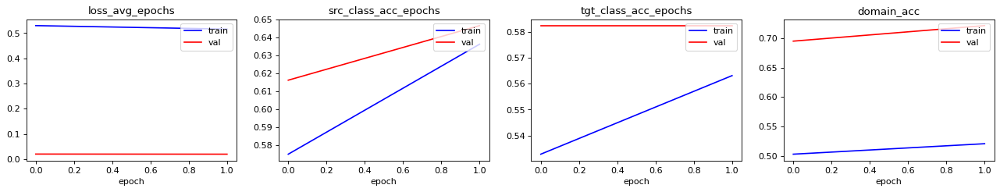

-----------------Exporting pytorch model-----------------
FeatureExtractor_total_params: 168
DannModel_total_params: 748
model saved successfully
-----------------Evaluating trained model-----------------
outputdir for model_output_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/dann/
acc performance: 0.6513994910941476 0.6946564885496184 0.5114503816793893 0.7480916030534351
acc performance: 0.6464646464646465 0.6868686868686869 0.5353535353535354 0.696969696969697


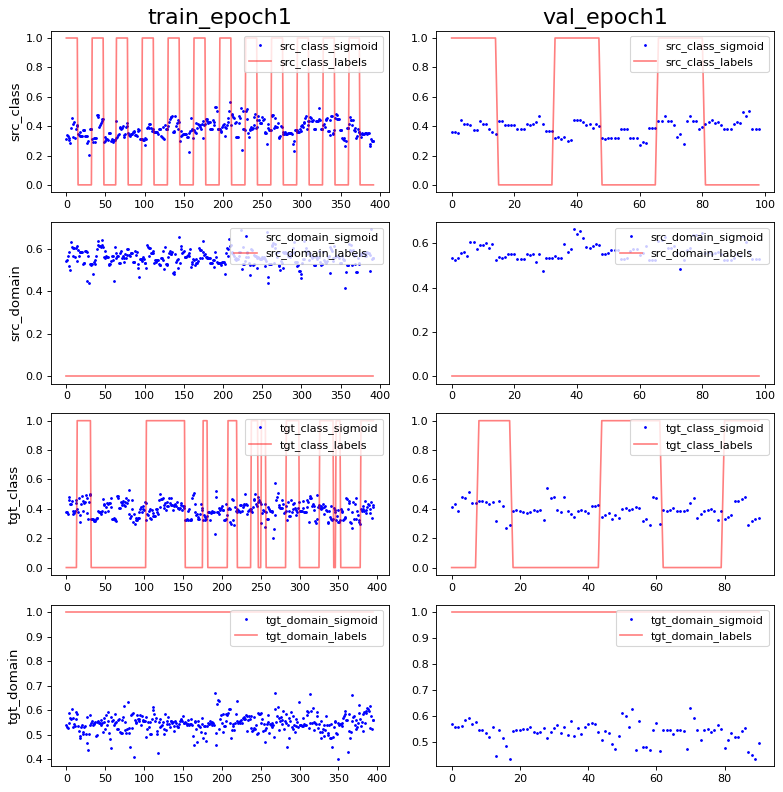

outputdir for model_features_diagnosis_trainval output: /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/dann/
show standardize mean and std: 0.0 0.98248553
PCA var: [32.4      50.200005 57.600006 63.500008 68.40001  71.600006 73.700005
 75.100006 76.40001  77.600006]
show standardize mean and std: -5.577043e-09 0.9789451
PCA var: [31.400002 53.600002 64.100006 71.3      75.600006 79.00001  80.80001
 82.30001  83.50001  84.700005]


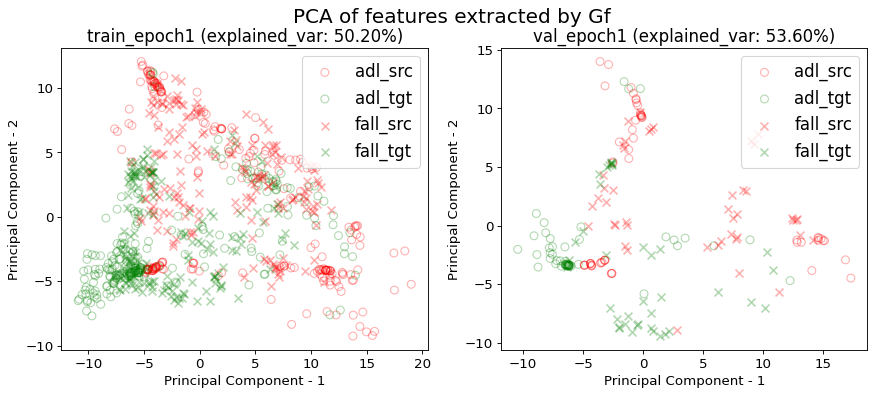

---------------Exporting model performance---------------
show df_performance


,i_CV,train_src_class_loss,train_tgt_class_loss,train_src_domain_loss,train_tgt_domain_loss,train_src_class_acc,train_tgt_class_acc,train_domain_acc,val_src_class_loss,val_tgt_class_loss,val_src_domain_loss,val_tgt_domain_loss,val_src_class_acc,val_tgt_class_acc,val_domain_acc
0,0.000000,0.153773,0.167974,0.181365,0.186760,0.808442,0.675410,0.355628,0.006338,0.003942,0.007368,0.003823,0.804124,0.571429,0.455197
1,1.000000,0.166080,0.175826,0.183469,0.166454,0.636132,0.563131,0.520913,0.006717,0.008197,0.006629,0.006578,0.646465,0.582418,0.721053
mean,0.500000,0.159927,0.171900,0.182417,0.176607,0.722287,0.619271,0.438270,0.006527,0.006069,0.006999,0.005201,0.725294,0.576923,0.588125
std,0.707107,0.008702,0.005553,0.001488,0.014359,0.121841,0.079393,0.116874,0.000268,0.003009,0.000523,0.001949,0.111482,0.007770,0.187988


val_src_class_acc: 0.7253±0.1115
val_tgt_class_acc: 0.5769±0.0078
val_domain_acc: 0.5881±0.1880
--------------Exporting notebook parameters--------------
{'CV_n': 2, 'samples_n': 492, 'classes_n': 2, 'model_name': 'DannModel', 'src_dataset_name': 'UPFall', 'tgt_dataset_name': 'UMAFall', 'src_sensor_loc': 'rightpocket', 'tgt_sensor_loc': 'leg', 'date': '2020/04/11 22:02:37', 'num_epochs': 2, 'channel_n': 4, 'batch_size': 4, 'learning_rate': 0.0001, 'input_dim': (4, 3, 66), 'output_dim': 2, 'label_dim': (4,)}
val_tgt_class_acc: 0.5769±0.0078
val_domain_acc: 0.5881±0.1880
time elapsed: 00:00:53
df_performance_table_rep_agg saved at /home/mchan2020/project_FDDAT/data_mic/stage2_modeloutput_18hz_5fold/UPFall_rightpocket_UMAFall_leg/repetitive_results/


,rep_i0,rep_i1,rep_avg
channel_n,4,4,4
batch_size,4,4,4
learning_rate,0.0001,0.0001,0.0001
source,0.511±0.101,0.750±0.245,0.631±0.169
DANN,0.690±0.253,0.577±0.008,0.633±0.080
target,0.368±0.163,0.648±0.047,0.508±0.198
domain,0.692±0.131,0.588±0.188,0.640±0.074
time_elapsed,55.0733,53.8494,54.4613
num_params,748,748,748


In [7]:
for tasks_params in tasks_params_list:

    (src_name, tgt_name) = tasks_params['task']

#     if 'rightpocket' in src_name or 'leg' in tgt_name or 'rightpocket' in tgt_name or 'leg' in src_name:
#         tasks_params['CV_n'] = 15
#     else:
#         tasks_params['CV_n'] = 17


    task_outputdir = home_dir + 'data_mic/{}/{}_{}/'.format(output_folder, src_name, tgt_name)

    if not os.path.exists(task_outputdir):
        os.makedirs(task_outputdir)
    print('outputdir for stage2 output:', task_outputdir)
    
    df_performance_table_agg = pd.DataFrame('', index=['channel_n', 'batch_size', 'learning_rate', 
                                                      'source', 'DANN', 'target', 'domain', 'time_elapsed', 'num_params'], columns=[])

    
    for i in range(0,rep_n):
        df_performance_table = performance_table(src_name, tgt_name, tasks_params, inputdir, task_outputdir)
        df_performance_table_agg['rep_i{}'.format(i)] = df_performance_table

    df_outputdir = task_outputdir+'repetitive_results/'
    if not os.path.exists(df_outputdir):
        os.makedirs(df_outputdir)
    print('df_performance_table_rep_agg saved at', df_outputdir)

    # Serialize data into file:
    json.dump({key:val for key, val in tasks_params.items() if key != 'device'}, open(df_outputdir+'optimal_training_params.json', 'w'))

    df_performance_table_agg = get_rep_stats(df_performance_table_agg, rep_n)
    df_performance_table_agg.to_csv(df_outputdir+'df_performance_table_rep{}_agg.csv'.format(rep_n, i), encoding='utf-8')

    display(df_performance_table_agg)

In [8]:
# def get_rep_stats_2(df_performance_table_agg, rep_n):
#     df_acc = df_performance_table_agg.loc[ ['source', 'DANN', 'target', 'domain'] , ].copy()
#     df_params = df_performance_table_agg.loc[ ['channel_n', 'batch_size', 'learning_rate', 'time_elapsed', 'num_params'], ].copy()

#     # accs
#     df_performance_table_all_mean = df_acc.applymap(get_mean)
#     df_performance_table_means = df_performance_table_all_mean.mean(axis=1)
#     df_performance_table_stds = df_performance_table_all_mean.std(axis=1)
#     df_performance_table_all_mean['mean'] = df_performance_table_means
#     df_performance_table_all_mean['std'] = df_performance_table_stds
#     df_performance_table_all_mean['rep'] = df_performance_table_all_mean[['mean', 'std']].apply(lambda x : '{:.3f}±{:.3f}'.format(x[0],x[1]), axis=1)

#     # params
#     df_params_means = df_params.mean(axis=1)

#     df_performance_table_agg['rep_avg'] = ''
#     df_performance_table_agg.loc[ ['source', 'DANN', 'target', 'domain'] , ['rep_avg']] = df_performance_table_all_mean.loc[:, 'rep']
#     df_performance_table_agg.loc[ ['channel_n', 'batch_size', 'learning_rate', 'time_elapsed', 'num_params'] , ['rep_avg']] = df_params_means
# return df_performance_table_agg

In [9]:
# del df_performance_table_agg['rep_avg']

In [10]:
# df_params_means

In [11]:
# df_performance_table_all_mean.loc[:, 'rep']

In [12]:
# df_params_means

In [13]:
# aaa